In [95]:
import scipy
import matplotlib
import numpy as np
import math
import pylab
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import matplotlib.colors as colors
import matplotlib.cm as cm
from matplotlib import colorbar
from matplotlib.patches import Ellipse
from matplotlib.ticker import LogFormatter
from matplotlib.ticker import LogFormatterExponent
from matplotlib.ticker import LogLocator
from matplotlib.ticker import AutoMinorLocator
from matplotlib.ticker import FixedLocator
from matplotlib.ticker import MultipleLocator
from matplotlib.colors import LogNorm
from matplotlib.colors import Normalize
from astropy.table import Table, vstack, join
from astropy.io import ascii, fits
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.optimize import curve_fit
from collections import Counter
from matplotlib.lines import Line2D
import lmfit
from sklearn.linear_model import LinearRegression
from scipy import interpolate
from scipy.interpolate import interp1d
from scipy.interpolate import UnivariateSpline
from scipy import interpolate
import time
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
pd.options.mode.copy_on_write = True
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint
from scipy.optimize import fsolve
import tensorflow as tf
from scipy.optimize import fsolve
from matplotlib.gridspec import GridSpec
from sklearn.model_selection import cross_validate, KFold
from tensorflow import keras
from scipy.stats import norm

In [96]:
def read_fits_and_cut_plus(input_file_name):
    df = pd.read_csv(input_file_name)
    df['id'] = df['id'].astype(str)
    df.drop(['MASK','SLIT','B', 'V', 'R', 'I', 'J', 'H', 'K', 'BERR', 'VERR', 'RERR', 'IERR', 'JERR', 'HERR', 'KERR', 'PHOT_COLOR',
            'AGE','TEFFERR','LOGGERR','ALPHAFE', 'ALPHAFEERR','SIFE', 'SIFEERR', 'CAFE', 'CAFEERR', 'TIFE', 'TIFEERR'], axis=1, inplace=True)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    df = df[(-0.0 < df['MGFEERR']) & (df['MGFEERR'] < 0.5)]
    return df
    
def read_hsc(input_file_name):
    data = ascii.read(input_file_name,
        names=['id', 'ra', 'dec', 'X', 'Y', 'ipsf', 'gpsf', 'npsf', 'ipsferr',
        'gpsferr', 'npsferr', 'cli', 'clg', 'cln', 'a_i', 'a_g', 'a_n'])
    df = data.to_pandas()
    df['id'] = df['id'].astype(str)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    df['g0'] = df['gpsf'] - df['a_g']
    df['i0'] = df['ipsf'] - df['a_i']
    df['n0'] = df['npsf'] - df['a_n']
    return df

def read_hsc_members(input_file_name):
    df = pd.read_csv(input_file_name)
    df['id'] = df['id'].astype(str)
    for column in df.columns:
        if df[column].dtype == 'object' and isinstance(df[column][0], bytes):
            df[column] = df[column].str.decode('utf-8')
    return df

In [97]:
## Read HSC-DEIMOS files
fnx = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Fornax_DEIMOS_Evan_Lauren.csv')
scl = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Sculptor_DEIMOS_Evan_Lauren.csv')
umi = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Ursaminor_DEIMOS_Evan_Lauren.csv')
dra = read_fits_and_cut_plus('/emc1/home/jhong5/subaru_hsc/Draco_DEIMOS_Evan_Lauren.csv')
print(f'len(fnx) = {len(fnx)}') #628 -> 360
print(f'len(scl) = {len(scl)}') #599 -> 361
print(f'len(umi) = {len(umi)}') #384 -> 108
print(f'len(dra) = {len(dra)}') #346 -> 130

## Read whole HSC data
hsc_fnx = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/fornax_tpall3e_g24_radec_members_cut.csv')
hsc_scl = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/sculptor_tpall3e_g24_radec_members_cut.csv')
hsc_umi = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/ursaminor_tpall3e_g24_radec_members_cut.csv')
hsc_dra = read_hsc_members('/emc1/home/jhong5/subaru_hsc/hsc_data/draco_tpall3e_g24_radec_members_cut.csv')
print(f'len(hsc_fnx) = {len(hsc_fnx)}') #49704
print(f'len(hsc_scl) = {len(hsc_scl)}') #10360
print(f'len(hsc_umi) = {len(hsc_umi)}') #5891
print(f'len(hsc_dra) = {len(hsc_dra)}') #5430

# Define the distance modulus for each dataset from McConnachie (2012)
dm_values = {
    'fnx': 20.84,
    'scl': 19.67,
    'umi': 19.4,
    'dra': 19.4
}

# Define the datasets
datasets = {
    'fnx': [fnx, hsc_fnx],
    'scl': [scl, hsc_scl],
    'umi': [umi, hsc_umi],
    'dra': [dra, hsc_dra]
}

# Apply the distance modulus correction and store as G0
for key, dataset_list in datasets.items():
    dm = dm_values[key]
    for dataset in dataset_list:
        dataset['Mg0'] = dataset['g0'] - dm
        dataset['Mi0'] = dataset['i0'] - dm
        dataset['Mn0'] = dataset['n0'] - dm

Mg0_max = -0.20 ; Mn0_max = -0.30 ; Mi0_max = -1.18
fnx_mag = fnx[(fnx['Mg0'] < Mg0_max) & (fnx['Mn0'] < Mn0_max) & (fnx['Mi0'] < Mi0_max)]
print('len(fnx_mag) =', len(fnx), '->', len(fnx_mag)) #360 -> 298
hsc_fnx_mag = hsc_fnx[(hsc_fnx['Mg0'] < Mg0_max) & (hsc_fnx['Mn0'] < Mn0_max) & (hsc_fnx['Mi0'] < Mi0_max)]
print('len(hsc_fnx_mag) =', len(hsc_fnx), '->', len(hsc_fnx_mag)) #49704 -> 7895

Mg0_max = 0.18 ; Mn0_max = 0.08 ; Mi0_max = -0.70
scl_mag = scl[(scl['Mg0'] < Mg0_max) & (scl['Mn0'] < Mn0_max) & (scl['Mi0'] < Mi0_max)]
print('len(scl_mag) =', len(scl), '->', len(scl_mag)) #361 -> 316
hsc_scl_mag = hsc_scl[(hsc_scl['Mg0'] < Mg0_max) & (hsc_scl['Mn0'] < Mn0_max) & (hsc_scl['Mi0'] < Mi0_max)]
print('len(hsc_scl_mag) =', len(hsc_scl), '->', len(hsc_scl_mag)) #10360 -> 1449

Mg0_max = 1.00 ; Mn0_max = 0.85 ; Mi0_max = 0.15
umi_mag = umi[(umi['Mg0'] < Mg0_max) & (umi['Mn0'] < Mn0_max) & (umi['Mi0'] < Mi0_max)]
print('len(umi_mag) =', len(umi), '->', len(umi_mag)) #108 -> 92
hsc_umi_mag = hsc_umi[(hsc_umi['Mg0'] < Mg0_max) & (hsc_umi['Mn0'] < Mn0_max) & (hsc_umi['Mi0'] < Mi0_max)]
print('len(hsc_umi_mag) =', len(hsc_umi), '->', len(hsc_umi_mag)) #5891 -> 862

Mg0_max = 0.65 ; Mn0_max = 0.50 ; Mi0_max = -0.20
dra_mag = dra[(dra['Mg0'] < Mg0_max) & (dra['Mn0'] < Mn0_max) & (dra['Mi0'] < Mi0_max)]
print('len(dra_mag) =', len(dra), '->', len(dra_mag)) #130 -> 105
hsc_dra_mag = hsc_dra[(hsc_dra['Mg0'] < Mg0_max) & (hsc_dra['Mn0'] < Mn0_max) & (hsc_dra['Mi0'] < Mi0_max)]
print('len(hsc_dra_mag) =', len(hsc_dra), '->', len(hsc_dra_mag)) #5430 -> 511

umi_mag = pd.concat([umi_mag.copy()] * 3, ignore_index=True)
dra_mag = pd.concat([dra_mag.copy()] * 3, ignore_index=True)


def compute_color_indices(df, col_pairs):
    for col1, col2 in col_pairs:
        df[f'{col1}_{col2}'] = df[col1] - df[col2]
        
color_pairs = [('g0', 'i0'), ('g0', 'n0'), ('n0', 'g0'), ('n0', 'i0')]

for df in [fnx_mag, scl_mag, umi_mag, dra_mag, hsc_fnx_mag, hsc_scl_mag, hsc_umi_mag, hsc_dra_mag]:
    compute_color_indices(df, color_pairs)


# Combine DEIMOS
frame = [fnx_mag, scl_mag, umi_mag, dra_mag]
df_mag = pd.concat(frame, ignore_index=True)
print('len(df_mag) =', len(df_mag)) #1205
print(Counter(df_mag['DSPH'])) #Counter({'scl': 316, 'dra': 315, 'for': 298, 'umi': 276})

# Combine HSC
frame = [hsc_fnx_mag, hsc_scl_mag, hsc_umi_mag, hsc_dra_mag]
hsc_df_mag = pd.concat(frame, ignore_index=True)
print('len(hsc_df_mag) =', len(hsc_df_mag)) #10717
print(Counter(hsc_df_mag['name'])) #Counter({'for': 7895, 'scl': 1449, 'umi': 862, 'dra': 511})

len(fnx) = 355
len(scl) = 361
len(umi) = 108
len(dra) = 130
len(hsc_fnx) = 49240
len(hsc_scl) = 9968
len(hsc_umi) = 5445
len(hsc_dra) = 5052
len(fnx_mag) = 355 -> 298
len(hsc_fnx_mag) = 49240 -> 7895
len(scl_mag) = 361 -> 316
len(hsc_scl_mag) = 9968 -> 1445
len(umi_mag) = 108 -> 92
len(hsc_umi_mag) = 5445 -> 819
len(dra_mag) = 130 -> 105
len(hsc_dra_mag) = 5052 -> 487
len(df_mag) = 1205
Counter({'scl': 316, 'dra': 315, 'for': 298, 'umi': 276})
len(hsc_df_mag) = 10646
Counter({'for': 7895, 'scl': 1445, 'umi': 819, 'dra': 487})


# Random Forest Regressor

In [98]:
%%time

# Get index of df_mag
indices = df_mag.index

# Using K(5)-fold
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# Build the model
def build_model(n_estimators, min_samples_leaf, max_features, max_samples):
    model = RandomForestRegressor(
        n_estimators = n_estimators, #
        min_samples_leaf = min_samples_leaf, 
        max_features = max_features, #
        max_samples = max_samples, #
        oob_score = True,
        random_state = 42
    )
    return model

# Make the model
model_rfr = build_model(500, 3, 0.5, 0.4)

# Iterate over each fold
for train_index, test_index in kf.split(df_mag):
    # Split into training and testing set for this fold
    train_dataset = df_mag.iloc[train_index]
    test_dataset = df_mag.iloc[test_index]

    # Train the model
    model_rfr.fit(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values,
                  train_dataset[['FEH', 'MGH']].values)

    # Predict on train and test sample
    train_dataset_pred_values = model_rfr.predict(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    train_dataset['FEH_phot_rfr'], train_dataset['MGH_phot_rfr'] = train_dataset_pred_values[:, 0], train_dataset_pred_values[:, 1]
    train_dataset['FEH_phot_rfr_uncertainty'], train_dataset['MGH_phot_rfr_uncertainty'] = train_dataset_pred_values[:, 0].std(axis=0), train_dataset_pred_values[:, 1].std(axis=0)

    test_dataset_pred_values = model_rfr.predict(test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    test_dataset['FEH_phot_rfr'], test_dataset['MGH_phot_rfr'] = test_dataset_pred_values[:, 0], test_dataset_pred_values[:, 1]
    test_dataset['FEH_phot_rfr_uncertainty'], test_dataset['MGH_phot_rfr_uncertainty'] = test_dataset_pred_values[:, 0].std(axis=0), test_dataset_pred_values[:, 1].std(axis=0)

# Train dataset RMSE
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_rfr'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_rfr'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_rfr'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_rfr'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

# Test dataset RMSE
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_rfr'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_rfr'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_rfr'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_rfr'])
print(f'Test RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Test RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Test R² FEH: {test_FEH_r2:.3f}') #
print(f'Test R² MGH: {test_MGH_r2:.3f}') #

## Finally, get the prediction from the HSC data
hsc_df_mag.rename(columns = {'name':'DSPH'}, inplace=True)

hsc_dataset_pred_values = model_rfr.predict(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
hsc_df_mag['FEH_phot_rfr'], hsc_df_mag['MGH_phot_rfr'] = hsc_dataset_pred_values[:, 0], hsc_dataset_pred_values[:, 1]
hsc_df_mag['FEH_phot_rfr_uncertainty'], hsc_df_mag['MGH_phot_rfr_uncertainty'] = hsc_dataset_pred_values[:, 0].std(axis=0), hsc_dataset_pred_values[:, 1].std(axis=0)

# ---------------------------------------------------------------------------------------------------------------------------------

# Predict MGFE
hsc_df_mag['MGFE_phot_rfr'] = hsc_df_mag['MGH_phot_rfr'] - hsc_df_mag['FEH_phot_rfr']
hsc_df_mag['MGFE_phot_rfr_uncertainty'] = np.sqrt(np.abs(hsc_df_mag['MGH_phot_rfr_uncertainty']**2 + hsc_df_mag['FEH_phot_rfr_uncertainty']**2))

keys = ['DSPH', 'Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_g0', 'n0_i0']
for key in keys:
    train_dataset[key] = train_dataset[key]
train_dataset['MGFE'] = train_dataset['MGH'] - train_dataset['FEH']
train_dataset['MGFEERR'] = np.sqrt(train_dataset['MGHERR']**2 + train_dataset['FEHERR']**2)
train_dataset['MGFE_phot_rfr'] = train_dataset['MGH_phot_rfr'] - train_dataset['FEH_phot_rfr']
train_dataset['MGFE_phot_rfr_uncertainty'] = np.sqrt(train_dataset['MGH_phot_rfr_uncertainty']**2 + train_dataset['FEH_phot_rfr_uncertainty']**2)
train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_rfr'] - train_dataset['FEH_phot_rfr']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_rfr'] - train_dataset['FEH_phot_rfr']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

keys = ['DSPH', 'Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_g0', 'n0_i0']
for key in keys:
    test_dataset[key] = test_dataset[key]
test_dataset['MGFE'] = test_dataset['MGH'] - test_dataset['FEH']
test_dataset['MGFEERR'] = np.sqrt(test_dataset['MGHERR']**2 + test_dataset['FEHERR']**2)
test_dataset['MGFE_phot_rfr'] = test_dataset['MGH_phot_rfr'] - test_dataset['FEH_phot_rfr']
test_dataset['MGFE_phot_rfr_uncertainty'] = np.sqrt(test_dataset['MGH_phot_rfr_uncertainty']**2 + test_dataset['FEH_phot_rfr_uncertainty']**2)
test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_rfr'] - test_dataset['FEH_phot_rfr']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_rfr'] - test_dataset['FEH_phot_rfr']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Training RMSE FEH: 0.199
Training RMSE MGH: 0.218
Training R² FEH: 0.862
Training R² MGH: 0.680
Test RMSE FEH: 0.261
Test RMSE MGH: 0.266
Test R² FEH: 0.760
Test R² MGH: 0.571
Training RMSE MGFE: 0.227
Training R² MGFE: 0.628
Test RMSE MGFE: 0.276
Test R² MGFE: 0.407
CPU times: user 9.44 s, sys: 0 ns, total: 9.44 s
Wall time: 9.43 s


In [99]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

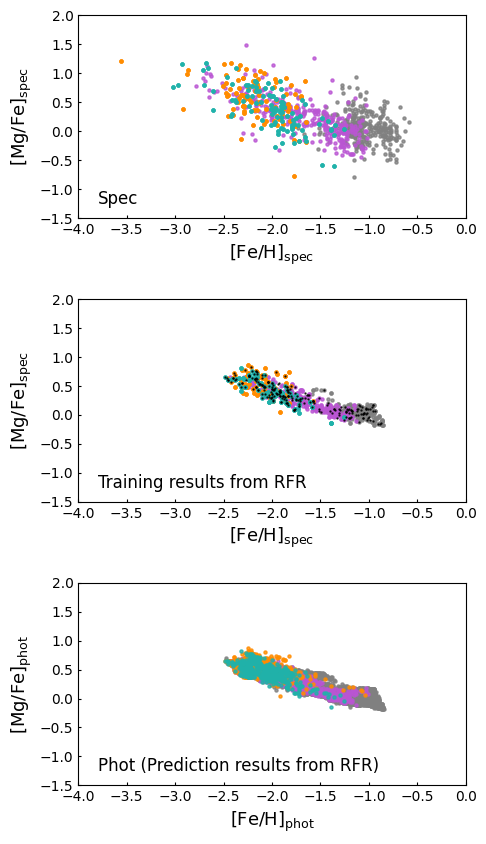

In [101]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_rfr'], train_fnx['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_rfr'], train_scl['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_rfr'], train_umi['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_rfr'], train_dra['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_rfr'], test_fnx['MGFE_phot_rfr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_rfr'], test_scl['MGFE_phot_rfr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_rfr'], test_umi['MGFE_phot_rfr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_rfr'], test_dra['MGFE_phot_rfr'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from RFR', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_rfr'], hsc_fnx_mag['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_rfr'], hsc_scl_mag['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from RFR)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

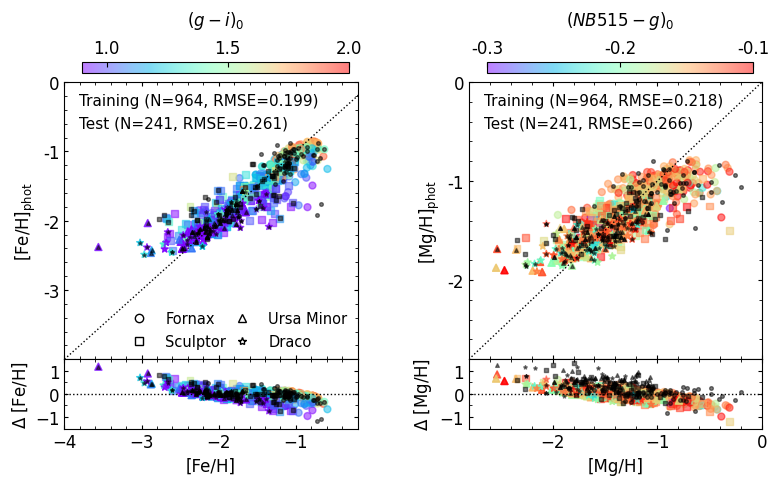

In [102]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_rfr'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_rfr'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_rfr'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_rfr'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_dataset['FEH'], train_dataset['FEH_phot_rfr'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_rfr']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_rfr']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_rfr']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_rfr']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_rfr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_rfr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_rfr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_rfr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_rfr'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_rfr'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_rfr'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_rfr'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_rfr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_rfr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_rfr']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_rfr']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_rfr']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_rfr']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_rfr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_rfr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_rfr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_rfr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

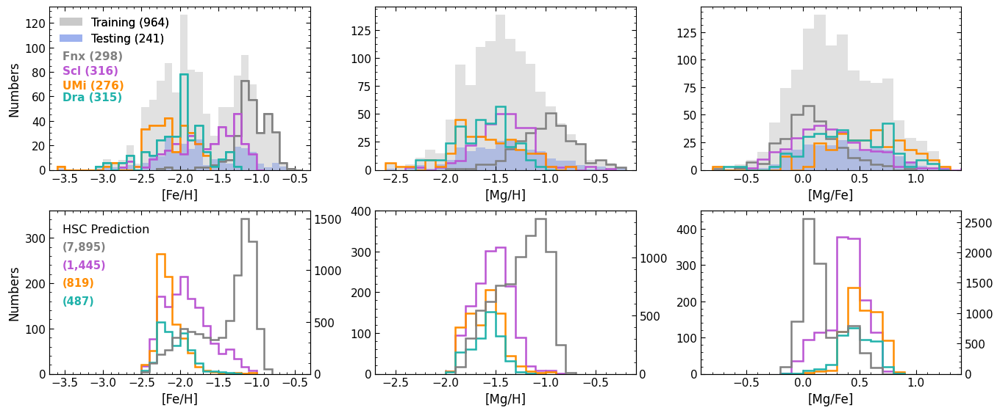

In [103]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
# plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_rfr'], [hsc_scl_mag['FEH_phot_rfr'], hsc_umi_mag['FEH_phot_rfr'], hsc_dra_mag['FEH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 360])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rfr'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_rfr'], [hsc_scl_mag['MGH_phot_rfr'], hsc_umi_mag['MGH_phot_rfr'], hsc_dra_mag['MGH_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_rfr'], [hsc_scl_mag['MGFE_phot_rfr'], hsc_umi_mag['MGFE_phot_rfr'], hsc_dra_mag['MGFE_phot_rfr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [104]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_rfr']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_rfr']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_rfr']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_rfr']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_rfr']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_rfr']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_rfr']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_rfr']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_rfr']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_rfr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_rfr']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_rfr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_rfr']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_rfr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_rfr']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_rfr']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_rfr']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_rfr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_rfr']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_rfr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_rfr']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_rfr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_rfr']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_rfr']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

#df.to_csv('feh_mgh_mgfe_distribution_mean_std_rfr.csv')
df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.42 ± 0.39,-1.25 ± 0.25,0.17 ± 0.18
hsc_scl_mag,-1.90 ± 0.30,-1.53 ± 0.18,0.38 ± 0.17
hsc_umi_mag,-2.13 ± 0.18,-1.60 ± 0.17,0.53 ± 0.13
hsc_dra_mag,-2.06 ± 0.20,-1.59 ± 0.14,0.47 ± 0.15


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [105]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_rfr')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_rfr')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_rfr')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_rfr')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.012, 'std': 0.349, 'n': 245, '95% CI (std)': array([-2.695, -1.329]), '99% CI (std)': array([-2.911, -1.113]), '95% CI (SE)': array([-2.056, -1.968])}
Galaxy for: {'mean': -1.045, 'std': 0.224, 'n': 240, '95% CI (std)': array([-1.484, -0.605]), '99% CI (std)': array([-1.623, -0.466]), '95% CI (SE)': array([-1.073, -1.016])}
Galaxy scl: {'mean': -1.644, 'std': 0.4, 'n': 260, '95% CI (std)': array([-2.429, -0.859]), '99% CI (std)': array([-2.677, -0.611]), '95% CI (SE)': array([-1.693, -1.595])}
Galaxy umi: {'mean': -2.158, 'std': 0.3, 'n': 219, '95% CI (std)': array([-2.747, -1.57 ]), '99% CI (std)': array([-2.933, -1.384]), '95% CI (SE)': array([-2.198, -2.119])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.628, 'std': 0.266, 'n': 245, '95% CI (std)': array([-2.149, -1.106]), '99% CI (std)': array([-2.314, -0.941]), '95% CI (SE)': array([-1.661, -1.594])}
Galaxy for: {'mean': -0.996, 'st

In [106]:
train_dataset_0 = train_dataset[(train_dataset['g0'] <= 18)]
train_dataset_1 = train_dataset[(18 < train_dataset['g0']) & (train_dataset['g0'] <= 19)]
train_dataset_2 = train_dataset[(19 < train_dataset['g0']) & (train_dataset['g0'] <= 20)]
train_dataset_3 = train_dataset[(20 < train_dataset['g0'])]
print(len(train_dataset), '=', len(train_dataset_0), '+', len(train_dataset_1), '+', len(train_dataset_2), '+', len(train_dataset_3))

from collections import Counter
order = ['for', 'scl', 'umi', 'dra']
def print_counter(counter):
    for key in order:
        print(f'{key}: {counter.get(key, 0)}', end='  ')
    print()
print_counter(Counter(train_dataset_0['DSPH']))
print_counter(Counter(train_dataset_1['DSPH']))
print_counter(Counter(train_dataset_2['DSPH']))
print_counter(Counter(train_dataset_3['DSPH']))

964 = 89 + 286 + 501 + 88
for: 0  scl: 27  umi: 6  dra: 56  
for: 1  scl: 141  umi: 69  dra: 75  
for: 161  scl: 92  umi: 136  dra: 112  
for: 78  scl: 0  umi: 8  dra: 2  


In [107]:
dsph_groups = {
    0: ['scl', 'umi', 'dra'],
    1: ['fnx', 'scl', 'umi', 'dra'],
    2: ['fnx', 'scl', 'umi', 'dra'],
    3: ['fnx', 'umi', 'dra'],
}

# 컬럼명과 변수 접미사 매핑
column_suffix = {
    'FEH': 'feh',
    'MGH': 'mgh',
    'FEH_phot_rfr': 'feh_pred',
    'MGH_phot_rfr': 'mgh_pred',
}

for level, dsphs in dsph_groups.items():
    for dsph in dsphs:
        dataset = globals()[f"train_dataset_{level}"]
        for col, suffix in column_suffix.items():
            var_name = f"parametric_ci_{suffix}_{level}"
            globals()[var_name] = parametric_confidence_intervals(dataset, col)

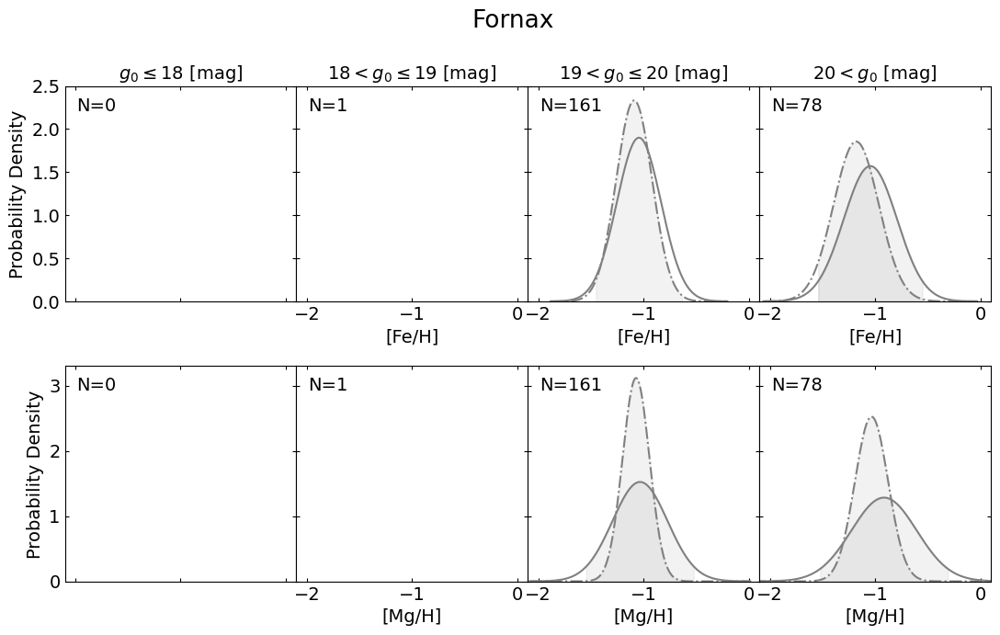

In [108]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(13, 7), gridspec_kw={'hspace':0.3, 'wspace':0})
xmin, xmax = -2.1, 0.1
ymin, ymax = 0, 2.5
color = 'gray'
plt.suptitle('Fornax', size=19, y=1)

# FEH

# ax0
axs[0,0].set_xticklabels([])
axs[0,0].set_ylabel('Probability Density', size=14)
axs[0,0].set_xlim([xmin, xmax])
axs[0,0].set_ylim([ymin, ymax])
axs[0,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].set_title('$g_0 \leq 18$ [mag]', size=14)
axs[0,0].text(0.05, 0.95, 'N=0', ha='left', va='top', transform=axs[0,0].transAxes, size=14)



# ax1
mu_real, sigma_real = parametric_ci_feh_1['for']['mean'], parametric_ci_feh_1['for']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_1['for']['mean'], parametric_ci_feh_pred_1['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,1].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_1['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_1['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].set_xlabel('[Fe/H]', size=14)
axs[0,1].set_yticklabels([])
axs[0,1].set_xlim([xmin, xmax])
axs[0,1].set_ylim([ymin, ymax])
axs[0,1].set_title('$18 < g_0 \leq 19$ [mag]', size=14)
feh_1 = parametric_ci_feh_1['for']['n']
axs[0,1].text(0.05, 0.95, f'N={feh_1}', ha='left', va='top', transform=axs[0,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_feh_2['for']['mean'], parametric_ci_feh_2['for']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_2['for']['mean'], parametric_ci_feh_pred_2['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
ax2.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_2['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_2['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].set_xlabel('[Fe/H]', size=14)
axs[0,2].set_yticklabels([])
axs[0,2].set_xlim([xmin, xmax])
axs[0,2].set_ylim([ymin, ymax])
axs[0,2].set_title('$19 < g_0 \leq 20$ [mag]', size=14)
feh_2 = parametric_ci_feh_2['for']['n']
axs[0,2].text(0.05, 0.95, f'N={feh_2}', ha='left', va='top', transform=axs[0,2].transAxes, size=14)


# ax3
mu_real, sigma_real = parametric_ci_feh_3['for']['mean'], parametric_ci_feh_3['for']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_3['for']['mean'], parametric_ci_feh_pred_3['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_3['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_3['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].set_xlabel('[Fe/H]', size=14)
axs[0,3].set_yticklabels([])
axs[0,3].set_xlim([xmin, xmax])
axs[0,3].set_ylim([ymin, ymax])
axs[0,3].set_title('$20 < g_0$ [mag]', size=14)
feh_3 = parametric_ci_feh_3['for']['n']
axs[0,3].text(0.05, 0.95, f'N={feh_3}', ha='left', va='top', transform=axs[0,3].transAxes, size=14)




# MGH
ymin, ymax = 0, 3.3

axs[1,0].set_xticklabels([])
axs[1,0].set_ylabel('Probability Density', size=14)
axs[1,0].set_xlim([xmin, xmax])
axs[1,0].set_ylim([ymin, ymax])
axs[1,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].text(0.05, 0.95, 'N=0', ha='left', va='top', transform=axs[1,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_mgh_1['for']['mean'], parametric_ci_mgh_1['for']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_1['for']['mean'], parametric_ci_mgh_pred_1['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_1['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_1['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].set_xlabel('[Mg/H]', size=14)
axs[1,1].set_yticklabels([])
axs[1,1].set_xlim([xmin, xmax])
axs[1,1].set_ylim([ymin, ymax])
mgh_1 = parametric_ci_mgh_1['for']['n']
axs[1,1].text(0.05, 0.95, f'N={mgh_1}', ha='left', va='top', transform=axs[1,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_mgh_2['for']['mean'], parametric_ci_mgh_2['for']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_2['for']['mean'], parametric_ci_mgh_pred_2['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].set_xlabel('[Mg/H]', size=14)
axs[1,2].set_yticklabels([])
axs[1,2].set_xlim([xmin, xmax])
axs[1,2].set_ylim([ymin, ymax])
mgh_2 = parametric_ci_mgh_2['for']['n']
axs[1,2].text(0.05, 0.95, f'N={mgh_2}', ha='left', va='top', transform=axs[1,2].transAxes, size=14)

# ax3
mu_real, sigma_real = parametric_ci_mgh_3['for']['mean'], parametric_ci_mgh_3['for']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_3['for']['mean'], parametric_ci_mgh_pred_3['for']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_3['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_3['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_3['for']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_3['for']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].set_xlabel('[Mg/H]', size=14)
axs[1,3].set_yticklabels([])
axs[1,3].set_xlim([xmin, xmax])
axs[1,3].set_ylim([ymin, ymax])
mgh_3 = parametric_ci_mgh_3['for']['n']
axs[1,3].text(0.05, 0.95, f'N={mgh_3}', ha='left', va='top', transform=axs[1,3].transAxes, size=14)


#plt.show()
plt.savefig('ci_training_each_mag_Fornax.png', bbox_inches='tight')

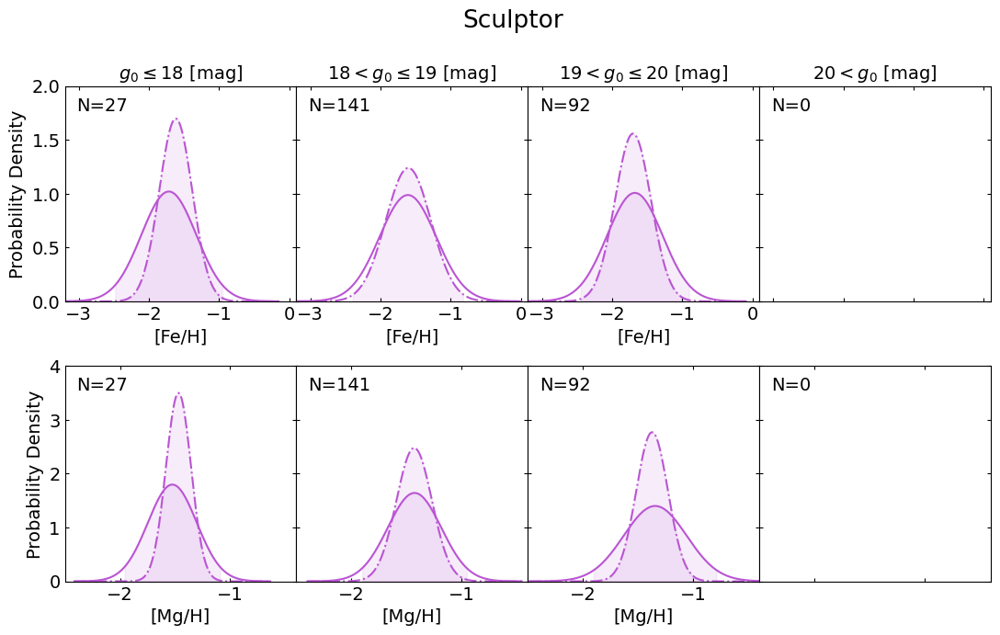

In [109]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(13, 7), gridspec_kw={'hspace':0.3, 'wspace':0})
xmin, xmax = -3.2, 0.1
ymin, ymax = 0, 2
color = 'mediumorchid'
plt.suptitle('Sculptor', size=19, y=1)

# FEH

# ax0
mu_real, sigma_real = parametric_ci_feh_0['scl']['mean'], parametric_ci_feh_0['scl']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_0['scl']['mean'], parametric_ci_feh_pred_0['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_0['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_0['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].set_xlabel('[Fe/H]', size=14)
axs[0,0].set_ylabel('Probability Density', size=14)
axs[0,0].set_xlim([xmin, xmax])
axs[0,0].set_ylim([ymin, ymax])
axs[0,0].set_title('$g_0 \leq 18$ [mag]', size=14)
feh_0 = parametric_ci_feh_0['scl']['n']
axs[0,0].text(0.05, 0.95, f'N={feh_0}', ha='left', va='top', transform=axs[0,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_feh_1['scl']['mean'], parametric_ci_feh_1['scl']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_1['scl']['mean'], parametric_ci_feh_pred_1['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
ax2.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_1['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_1['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].set_xlabel('[Fe/H]', size=14)
axs[0,1].set_yticklabels([])
axs[0,1].set_xlim([xmin, xmax])
axs[0,1].set_ylim([ymin, ymax])
axs[0,1].set_title('$18 < g_0 \leq 19$ [mag]', size=14)
feh_1 = parametric_ci_feh_1['scl']['n']
axs[0,1].text(0.05, 0.95, f'N={feh_1}', ha='left', va='top', transform=axs[0,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_feh_2['scl']['mean'], parametric_ci_feh_2['scl']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_2['scl']['mean'], parametric_ci_feh_pred_2['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_2['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_2['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].set_xlabel('[Fe/H]', size=14)
axs[0,2].set_yticklabels([])
axs[0,2].set_xlim([xmin, xmax])
axs[0,2].set_ylim([ymin, ymax])
axs[0,2].set_title('$19 < g_0 \leq 20$ [mag]', size=14)
feh_2 = parametric_ci_feh_2['scl']['n']
axs[0,2].text(0.05, 0.95, f'N={feh_2}', ha='left', va='top', transform=axs[0,2].transAxes, size=14)


# ax3
axs[0,3].set_xticklabels([])
axs[0,3].set_yticklabels([])
axs[0,3].set_xlim([xmin, xmax])
axs[0,3].set_ylim([ymin, ymax])
axs[0,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].set_title('$20 < g_0$ [mag]', size=14)
axs[0,3].text(0.05, 0.95, 'N=0', ha='left', va='top', transform=axs[0,3].transAxes, size=14)





# MGH
xmin, xmax = -2.5, -0.4
ymin, ymax = 0, 4

# ax0
mu_real, sigma_real = parametric_ci_mgh_0['scl']['mean'], parametric_ci_mgh_0['scl']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_0['scl']['mean'], parametric_ci_mgh_pred_0['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_0['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_0['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].set_xlabel('[Mg/H]', size=14)
axs[1,0].set_ylabel('Probability Density', size=14)
axs[1,0].set_xlim([xmin, xmax])
axs[1,0].set_ylim([ymin, ymax])
mgh_0 = parametric_ci_mgh_0['scl']['n']
axs[1,0].text(0.05, 0.95, f'N={mgh_0}', ha='left', va='top', transform=axs[1,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_mgh_1['scl']['mean'], parametric_ci_mgh_1['scl']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_1['scl']['mean'], parametric_ci_mgh_pred_1['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_1['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_1['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].set_xlabel('[Mg/H]', size=14)
axs[1,1].set_yticklabels([])
axs[1,1].set_xlim([xmin, xmax])
axs[1,1].set_ylim([ymin, ymax])
mgh_1 = parametric_ci_mgh_1['scl']['n']
axs[1,1].text(0.05, 0.95, f'N={mgh_1}', ha='left', va='top', transform=axs[1,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_mgh_2['scl']['mean'], parametric_ci_mgh_2['scl']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_2['scl']['mean'], parametric_ci_mgh_pred_2['scl']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['scl']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['scl']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].set_xlabel('[Mg/H]', size=14)
axs[1,2].set_yticklabels([])
axs[1,2].set_xlim([xmin, xmax])
axs[1,2].set_ylim([ymin, ymax])
mgh_2 = parametric_ci_mgh_2['scl']['n']
axs[1,2].text(0.05, 0.95, f'N={mgh_2}', ha='left', va='top', transform=axs[1,2].transAxes, size=14)


# ax3
axs[1,3].set_xticklabels([])
axs[1,3].set_yticklabels([])
axs[1,3].set_xlim([xmin, xmax])
axs[1,3].set_ylim([ymin, ymax])
axs[1,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].text(0.05, 0.95, 'N=0', ha='left', va='top', transform=axs[1,3].transAxes, size=14)


#plt.show()
plt.savefig('ci_training_each_mag_Sculptor.png', bbox_inches='tight')

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


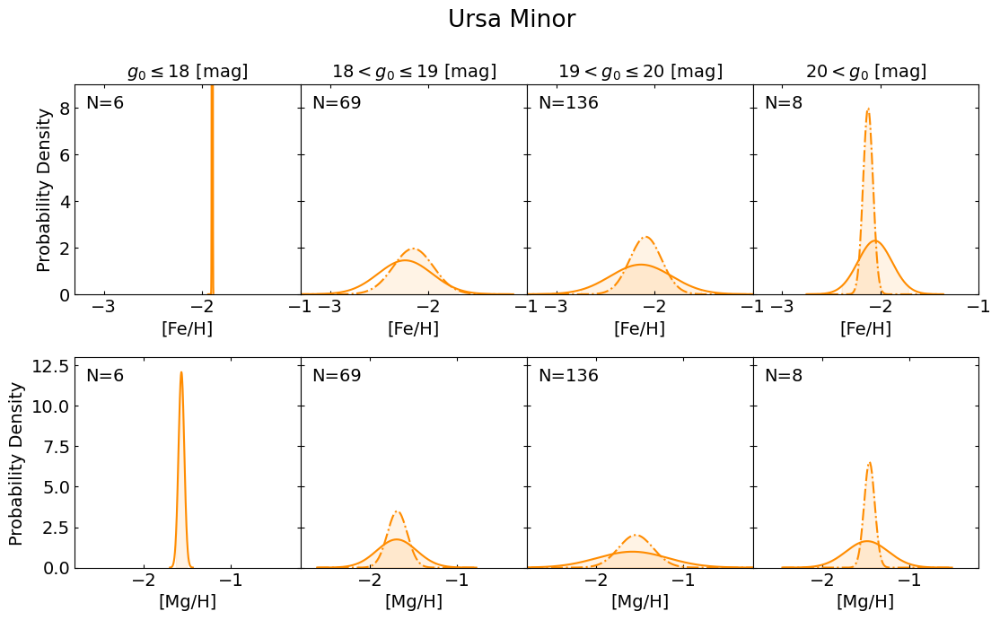

In [110]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(13, 7), gridspec_kw={'hspace':0.3, 'wspace':0})
xmin, xmax = -3.3, -1
ymin, ymax = 0, 9
color = 'darkorange'
plt.suptitle('Ursa Minor', size=19, y=1)

# FEH

# ax0
mu_real, sigma_real = parametric_ci_feh_0['umi']['mean'], parametric_ci_feh_0['umi']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_0['umi']['mean'], parametric_ci_feh_pred_0['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_0['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_0['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].set_xlabel('[Fe/H]', size=14)
axs[0,0].set_ylabel('Probability Density', size=14)
axs[0,0].set_xlim([xmin, xmax])
axs[0,0].set_ylim([ymin, ymax])
axs[0,0].set_title('$g_0 \leq 18$ [mag]', size=14)
feh_0 = parametric_ci_feh_0['umi']['n']
axs[0,0].text(0.05, 0.95, f'N={feh_0}', ha='left', va='top', transform=axs[0,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_feh_1['umi']['mean'], parametric_ci_feh_1['umi']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_1['umi']['mean'], parametric_ci_feh_pred_1['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
ax2.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_1['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_1['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].set_xlabel('[Fe/H]', size=14)
axs[0,1].set_yticklabels([])
axs[0,1].set_xlim([xmin, xmax])
axs[0,1].set_ylim([ymin, ymax])
axs[0,1].set_title('$18 < g_0 \leq 19$ [mag]', size=14)
feh_1 = parametric_ci_feh_1['umi']['n']
axs[0,1].text(0.05, 0.95, f'N={feh_1}', ha='left', va='top', transform=axs[0,1].transAxes, size=14)

# ax2
mu_real, sigma_real = parametric_ci_feh_2['umi']['mean'], parametric_ci_feh_2['umi']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_2['umi']['mean'], parametric_ci_feh_pred_2['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].set_xlabel('[Fe/H]', size=14)
axs[0,2].set_yticklabels([])
axs[0,2].set_xlim([xmin, xmax])
axs[0,2].set_ylim([ymin, ymax])
axs[0,2].set_title('$19 < g_0 \leq 20$ [mag]', size=14)
feh_2 = parametric_ci_feh_2['umi']['n']
axs[0,2].text(0.05, 0.95, f'N={feh_2}', ha='left', va='top', transform=axs[0,2].transAxes, size=14)


# ax3
mu_real, sigma_real = parametric_ci_feh_3['umi']['mean'], parametric_ci_feh_3['umi']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_3['umi']['mean'], parametric_ci_feh_pred_3['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_3['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_3['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].set_xlabel('[Fe/H]', size=14)
axs[0,3].set_yticklabels([])
axs[0,3].set_xlim([xmin, xmax])
axs[0,3].set_ylim([ymin, ymax])
axs[0,3].set_title('$20 < g_0$ [mag]', size=14)
feh_3 = parametric_ci_feh_3['umi']['n']
axs[0,3].text(0.05, 0.95, f'N={feh_3}', ha='left', va='top', transform=axs[0,3].transAxes, size=14)





# MGH
xmin, xmax = -2.8, -0.2
ymin, ymax = 0, 13

# ax0
mu_real, sigma_real = parametric_ci_mgh_0['umi']['mean'], parametric_ci_mgh_0['umi']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_0['umi']['mean'], parametric_ci_mgh_pred_0['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_0['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_0['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].set_xlabel('[Mg/H]', size=14)
axs[1,0].set_ylabel('Probability Density', size=14)
axs[1,0].set_xlim([xmin, xmax])
axs[1,0].set_ylim([ymin, ymax])
mgh_0 = parametric_ci_mgh_0['umi']['n']
axs[1,0].text(0.05, 0.95, f'N={mgh_0}', ha='left', va='top', transform=axs[1,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_mgh_1['umi']['mean'], parametric_ci_mgh_1['umi']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_1['umi']['mean'], parametric_ci_mgh_pred_1['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_1['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_1['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].set_xlabel('[Mg/H]', size=14)
axs[1,1].set_yticklabels([])
axs[1,1].set_xlim([xmin, xmax])
axs[1,1].set_ylim([ymin, ymax])
mgh_1 = parametric_ci_mgh_1['umi']['n']
axs[1,1].text(0.05, 0.95, f'N={mgh_1}', ha='left', va='top', transform=axs[1,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_mgh_2['umi']['mean'], parametric_ci_mgh_2['umi']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_2['umi']['mean'], parametric_ci_mgh_pred_2['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].set_xlabel('[Mg/H]', size=14)
axs[1,2].set_yticklabels([])
axs[1,2].set_xlim([xmin, xmax])
axs[1,2].set_ylim([ymin, ymax])
mgh_2 = parametric_ci_mgh_2['umi']['n']
axs[1,2].text(0.05, 0.95, f'N={mgh_2}', ha='left', va='top', transform=axs[1,2].transAxes, size=14)


# ax3
mu_real, sigma_real = parametric_ci_mgh_3['umi']['mean'], parametric_ci_mgh_3['umi']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_3['umi']['mean'], parametric_ci_mgh_pred_3['umi']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['umi']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['umi']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].set_xlabel('[Mg/H]', size=14)
axs[1,3].set_yticklabels([])
axs[1,3].set_xlim([xmin, xmax])
axs[1,3].set_ylim([ymin, ymax])
mgh_3 = parametric_ci_mgh_3['umi']['n']
axs[1,3].text(0.05, 0.95, f'N={mgh_3}', ha='left', va='top', transform=axs[1,3].transAxes, size=14)


#plt.show()
plt.savefig('ci_training_each_mag_Ursaminor.png', bbox_inches='tight')

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: divide by zero encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/scipy/stats/_distn_infrastructure.py:1988: RuntimeWarning: invalid value encountered in divide
  x = np.asarray((x - loc)/scale, dtype=dtyp)


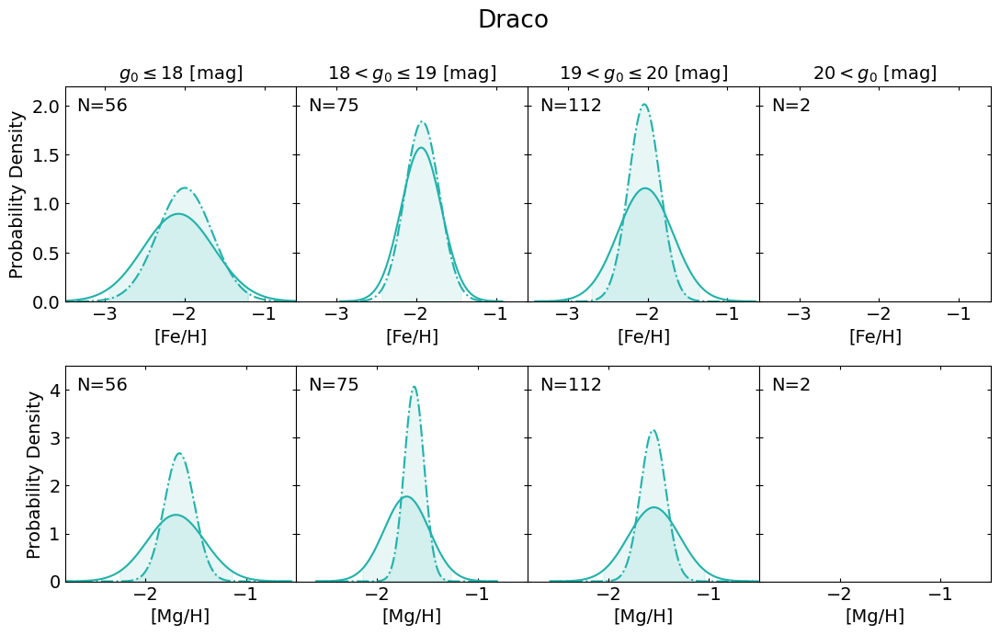

In [111]:
fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(13, 7), gridspec_kw={'hspace':0.3, 'wspace':0})
xmin, xmax = -3.5, -0.6
ymin, ymax = 0, 2.2
color = 'lightseagreen'
plt.suptitle('Draco', size=19, y=1)

# FEH

# ax0
mu_real, sigma_real = parametric_ci_feh_0['dra']['mean'], parametric_ci_feh_0['dra']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_0['dra']['mean'], parametric_ci_feh_pred_0['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_0['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_0['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_0['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,0].set_xlabel('[Fe/H]', size=14)
axs[0,0].set_ylabel('Probability Density', size=14)
axs[0,0].set_xlim([xmin, xmax])
axs[0,0].set_ylim([ymin, ymax])
axs[0,0].set_title('$g_0 \leq 18$ [mag]', size=14)
feh_0 = parametric_ci_feh_0['dra']['n']
axs[0,0].text(0.05, 0.95, f'N={feh_0}', ha='left', va='top', transform=axs[0,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_feh_1['dra']['mean'], parametric_ci_feh_1['dra']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_1['dra']['mean'], parametric_ci_feh_pred_1['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
ax2.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_1['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_1['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_1['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,1].set_xlabel('[Fe/H]', size=14)
axs[0,1].set_yticklabels([])
axs[0,1].set_xlim([xmin, xmax])
axs[0,1].set_ylim([ymin, ymax])
axs[0,1].set_title('$18 < g_0 \leq 19$ [mag]', size=14)
feh_1 = parametric_ci_feh_1['dra']['n']
axs[0,1].text(0.05, 0.95, f'N={feh_1}', ha='left', va='top', transform=axs[0,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_feh_2['dra']['mean'], parametric_ci_feh_2['dra']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_2['dra']['mean'], parametric_ci_feh_pred_2['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,2].set_xlabel('[Fe/H]', size=14)
axs[0,2].set_yticklabels([])
axs[0,2].set_xlim([xmin, xmax])
axs[0,2].set_ylim([ymin, ymax])
axs[0,2].set_title('$19 < g_0 \leq 20$ [mag]', size=14)
feh_2 = parametric_ci_feh_2['dra']['n']
axs[0,2].text(0.05, 0.95, f'N={feh_2}', ha='left', va='top', transform=axs[0,2].transAxes, size=14)


# ax3
mu_real, sigma_real = parametric_ci_feh_3['dra']['mean'], parametric_ci_feh_3['dra']['std']
mu_pred, sigma_pred = parametric_ci_feh_pred_3['dra']['mean'], parametric_ci_feh_pred_3['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_feh_3['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_feh_3['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_feh_3['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[0,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[0,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[0,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[0,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[0,3].set_xlabel('[Fe/H]', size=14)
axs[0,3].set_yticklabels([])
axs[0,3].set_xlim([xmin, xmax])
axs[0,3].set_ylim([ymin, ymax])
axs[0,3].set_title('$20 < g_0$ [mag]', size=14)
feh_3 = parametric_ci_feh_3['dra']['n']
axs[0,3].text(0.05, 0.95, f'N={feh_3}', ha='left', va='top', transform=axs[0,3].transAxes, size=14)





# MGH
xmin, xmax = -2.8, -0.5
ymin, ymax = 0, 4.5

# ax0
mu_real, sigma_real = parametric_ci_mgh_0['dra']['mean'], parametric_ci_mgh_0['dra']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_0['dra']['mean'], parametric_ci_mgh_pred_0['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_0['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_0['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_0['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,0].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,0].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,0].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,0].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,0].set_xlabel('[Mg/H]', size=14)
axs[1,0].set_ylabel('Probability Density', size=14)
axs[1,0].set_xlim([xmin, xmax])
axs[1,0].set_ylim([ymin, ymax])
mgh_0 = parametric_ci_mgh_0['dra']['n']
axs[1,0].text(0.05, 0.95, f'N={mgh_0}', ha='left', va='top', transform=axs[1,0].transAxes, size=14)


# ax1
mu_real, sigma_real = parametric_ci_mgh_1['dra']['mean'], parametric_ci_mgh_1['dra']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_1['dra']['mean'], parametric_ci_mgh_pred_1['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_1['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_1['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_1['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,1].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,1].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,1].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,1].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,1].set_xlabel('[Mg/H]', size=14)
axs[1,1].set_yticklabels([])
axs[1,1].set_xlim([xmin, xmax])
axs[1,1].set_ylim([ymin, ymax])
mgh_1 = parametric_ci_mgh_1['dra']['n']
axs[1,1].text(0.05, 0.95, f'N={mgh_1}', ha='left', va='top', transform=axs[1,1].transAxes, size=14)


# ax2
mu_real, sigma_real = parametric_ci_mgh_2['dra']['mean'], parametric_ci_mgh_2['dra']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_2['dra']['mean'], parametric_ci_mgh_pred_2['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,2].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,2].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,2].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,2].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,2].set_xlabel('[Mg/H]', size=14)
axs[1,2].set_yticklabels([])
axs[1,2].set_xlim([xmin, xmax])
axs[1,2].set_ylim([ymin, ymax])
mgh_2 = parametric_ci_mgh_2['dra']['n']
axs[1,2].text(0.05, 0.95, f'N={mgh_2}', ha='left', va='top', transform=axs[1,2].transAxes, size=14)


# ax3
mu_real, sigma_real = parametric_ci_mgh_3['dra']['mean'], parametric_ci_mgh_3['dra']['std']
mu_pred, sigma_pred = parametric_ci_mgh_pred_3['dra']['mean'], parametric_ci_mgh_pred_3['dra']['std']
x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
x = np.linspace(x_min, x_max, 200)
y_real = norm.pdf(x, mu_real, sigma_real)
y_pred = norm.pdf(x, mu_pred, sigma_pred)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                where=((parametric_ci_mgh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                where=((parametric_ci_mgh_2['dra']['95% CI (std)'][0] <= x) & (x <= parametric_ci_mgh_2['dra']['95% CI (std)'][1])),
                color=color, alpha=0.1)
axs[1,3].plot(x, y_real, linestyle='-', color=color, label='True')
axs[1,3].plot(x, y_pred, linestyle='-.', color=color, label='Prediction')
axs[1,3].tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=14)
axs[1,3].tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=14)
axs[1,3].set_xlabel('[Mg/H]', size=14)
axs[1,3].set_yticklabels([])
axs[1,3].set_xlim([xmin, xmax])
axs[1,3].set_ylim([ymin, ymax])
mgh_3 = parametric_ci_mgh_3['dra']['n']
axs[1,3].text(0.05, 0.95, f'N={mgh_3}', ha='left', va='top', transform=axs[1,3].transAxes, size=14)


#plt.show()
plt.savefig('ci_training_each_mag_Draco.png', bbox_inches='tight')

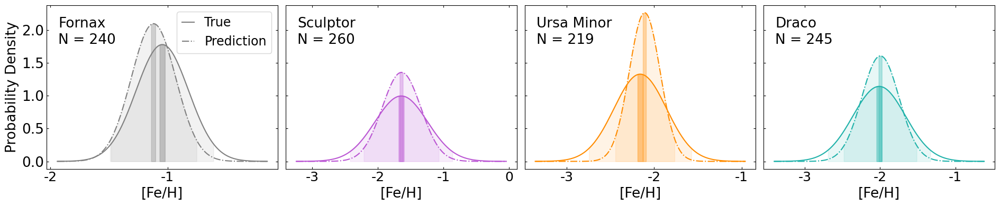

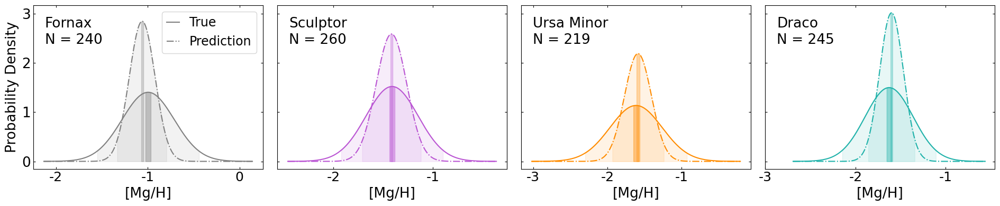

In [112]:
def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_rfr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_rfr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

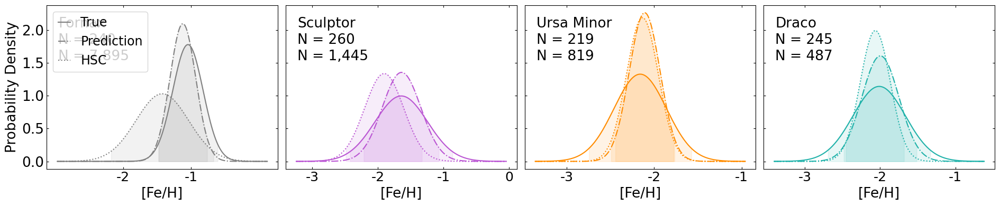

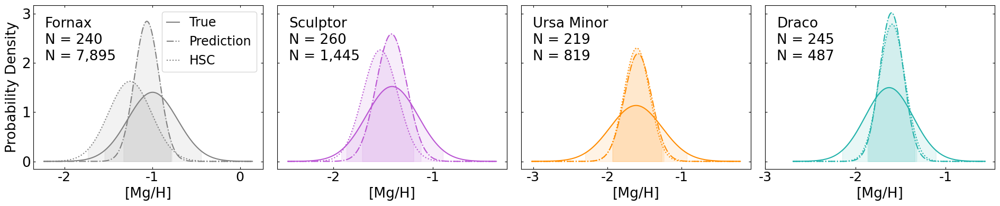

In [113]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_rfr'], hsc_df_mag['FEH_phot_rfr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_rfr'], hsc_df_mag['MGH_phot_rfr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [114]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_rfr')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_rfr')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_rfr')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_rfr')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.055444777132807, -1.9702232679702778)}
Galaxy for: {'bootstrap 95% CI': (-1.0732025665045128, -1.018222307625699)}
Galaxy scl: {'bootstrap 95% CI': (-1.6928183192690758, -1.5969749031785487)}
Galaxy umi: {'bootstrap 95% CI': (-2.2001033445212395, -2.1193475267701087)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6614056501041887, -1.5955245940653053)}
Galaxy for: {'bootstrap 95% CI': (-1.0333968177208135, -0.9611313523679259)}
Galaxy scl: {'bootstrap 95% CI': (-1.4388652469078425, -1.3789590943296197)}
Galaxy umi: {'bootstrap 95% CI': (-1.6600873584052065, -1.5661928057424632)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.026867423146612, -1.9653331033200938)}
Galaxy for: {'bootstrap 95% CI': (-1.1448467383679732, -1.09683808967558)}
Galaxy scl: {'bootstrap 95% CI': (-1.6748952136389799, -1.6034752961071248)}
Galaxy umi

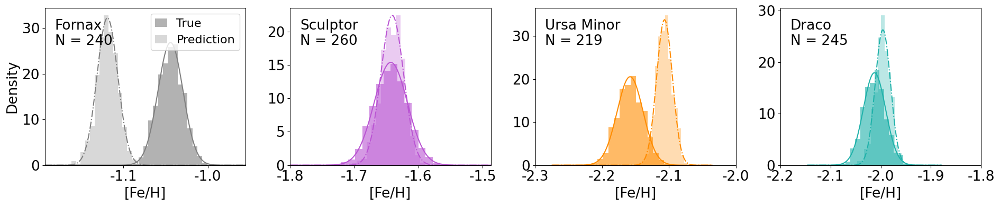

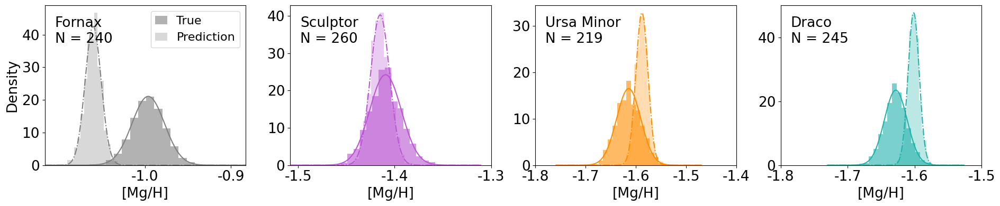

In [115]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_rfr', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_rfr', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [116]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_rfr')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_rfr')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.141, RMSE = 0.213, Relative Error % = 7.08%
Galaxy for: MAE = 0.184, RMSE = 0.280, Relative Error % = 16.75%
Galaxy scl: MAE = 0.222, RMSE = 0.313, Relative Error % = 13.09%
Galaxy umi: MAE = 0.135, RMSE = 0.236, Relative Error % = 6.31%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.168, RMSE = 0.217, Relative Error % = 10.42%
Galaxy for: MAE = 0.249, RMSE = 0.323, Relative Error % = 26.26%
Galaxy scl: MAE = 0.206, RMSE = 0.280, Relative Error % = 14.42%
Galaxy umi: MAE = 0.197, RMSE = 0.243, Relative Error % = 12.49%

Our FEH predictions are accurate to within 6-17% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 10-26% (95% confidence) across different galaxies.


# XGBoost

In [117]:
%%time
import xgboost as xgb

kf = KFold(n_splits=5, shuffle=True, random_state=42)

def build_model_xgboost(n_estimators, min_child_weight, colsample_bytree):
    model = xgb.XGBRegressor(
        n_estimators = n_estimators, 
        min_child_weight = min_child_weight, 
        colsample_bytree = colsample_bytree, 
        learning_rate=0.05,
        subsample=0.8,
        random_state = 42
    )
    return model

model_xgboost = build_model_xgboost(500, 3, 0.5) #3 was supposed to be 1 / 11, 3, 0.5 are also possible

# Iterate over each fold
for train_index, test_index in kf.split(df_mag):
    # Split into training and testing set for this fold
    train_dataset = df_mag.iloc[train_index]
    test_dataset = df_mag.iloc[test_index]

    # Train the model
    model_xgboost.fit(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values,
                  train_dataset[['FEH', 'MGH']].values)

    # Predict on train and test sample
    train_dataset_pred_values = model_xgboost.predict(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    train_dataset['FEH_phot_xgboost'], train_dataset['MGH_phot_xgboost'] = train_dataset_pred_values[:, 0], train_dataset_pred_values[:, 1]
    train_dataset['FEH_phot_xgboost_uncertainty'], train_dataset['MGH_phot_xgboost_uncertainty'] = train_dataset_pred_values[:, 0].std(axis=0), train_dataset_pred_values[:, 1].std(axis=0)

    test_dataset_pred_values = model_xgboost.predict(test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    test_dataset['FEH_phot_xgboost'], test_dataset['MGH_phot_xgboost'] = test_dataset_pred_values[:, 0], test_dataset_pred_values[:, 1]
    test_dataset['FEH_phot_xgboost_uncertainty'], test_dataset['MGH_phot_xgboost_uncertainty'] = test_dataset_pred_values[:, 0].std(axis=0), test_dataset_pred_values[:, 1].std(axis=0)

# Train dataset RMSE
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_xgboost'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_xgboost'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_xgboost'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_xgboost'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

# Test dataset RMSE
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_xgboost'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_xgboost'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_xgboost'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_xgboost'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

## Finally, get the prediction from the HSC data
hsc_dataset_pred_values = model_xgboost.predict(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
hsc_df_mag['FEH_phot_xgboost'], hsc_df_mag['MGH_phot_xgboost'] = hsc_dataset_pred_values[:, 0], hsc_dataset_pred_values[:, 1]
hsc_df_mag['FEH_phot_xgboost_uncertainty'], hsc_df_mag['MGH_phot_xgboost_uncertainty'] = hsc_dataset_pred_values[:, 0].std(axis=0), hsc_dataset_pred_values[:, 1].std(axis=0)

# ---------------------------------------------------------------------------------------------------------------------------------

# Predict MGFE
hsc_df_mag['MGFE_phot_xgboost'] = hsc_df_mag['MGH_phot_xgboost'] - hsc_df_mag['FEH_phot_xgboost']
hsc_df_mag['MGFE_phot_xgboost_uncertainty'] = np.sqrt(np.abs(hsc_df_mag['MGH_phot_xgboost_uncertainty']**2 + hsc_df_mag['FEH_phot_xgboost_uncertainty']**2))

train_dataset['MGFE_phot_xgboost'] = train_dataset['MGH_phot_xgboost'] - train_dataset['FEH_phot_xgboost']
train_dataset['MGFE_phot_xgboost_uncertainty'] = np.sqrt(train_dataset['MGH_phot_xgboost_uncertainty']**2 + train_dataset['FEH_phot_xgboost_uncertainty']**2)
train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_xgboost'] - train_dataset['FEH_phot_xgboost']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_xgboost'] - train_dataset['FEH_phot_xgboost']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_dataset['MGFE_phot_xgboost'] = test_dataset['MGH_phot_xgboost'] - test_dataset['FEH_phot_xgboost']
test_dataset['MGFE_phot_xgboost_uncertainty'] = np.sqrt(test_dataset['MGH_phot_xgboost_uncertainty']**2 + test_dataset['FEH_phot_xgboost_uncertainty']**2)
test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_xgboost'] - test_dataset['FEH_phot_xgboost']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_xgboost'] - test_dataset['FEH_phot_xgboost']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Training RMSE FEH: 0.031
Training RMSE MGH: 0.111
Training R² FEH: 0.997
Training R² MGH: 0.918
Training RMSE FEH: 0.183
Training RMSE MGH: 0.238
Training R² FEH: 0.882
Training R² MGH: 0.659
Training RMSE MGFE: 0.111
Training R² MGFE: 0.911
Test RMSE MGFE: 0.240
Test R² MGFE: 0.551
CPU times: user 5.49 s, sys: 116 ms, total: 5.61 s
Wall time: 5.6 s


In [118]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

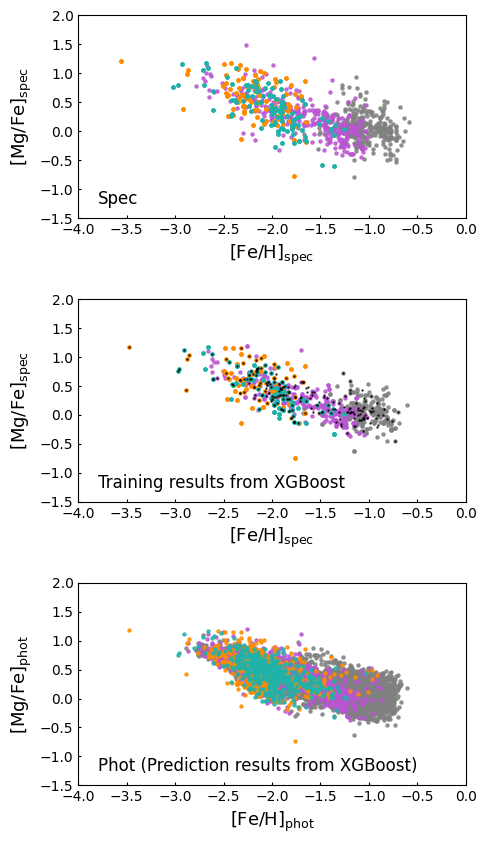

In [119]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_xgboost'], train_fnx['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_xgboost'], train_scl['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_xgboost'], train_umi['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_xgboost'], train_dra['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_xgboost'], test_fnx['MGFE_phot_xgboost'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_xgboost'], test_scl['MGFE_phot_xgboost'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_xgboost'], test_umi['MGFE_phot_xgboost'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_xgboost'], test_dra['MGFE_phot_xgboost'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from XGBoost', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_xgboost'], hsc_fnx_mag['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_xgboost'], hsc_scl_mag['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_xgboost'], hsc_umi_mag['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_xgboost'], hsc_dra_mag['MGFE_phot_xgboost'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from XGBoost)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

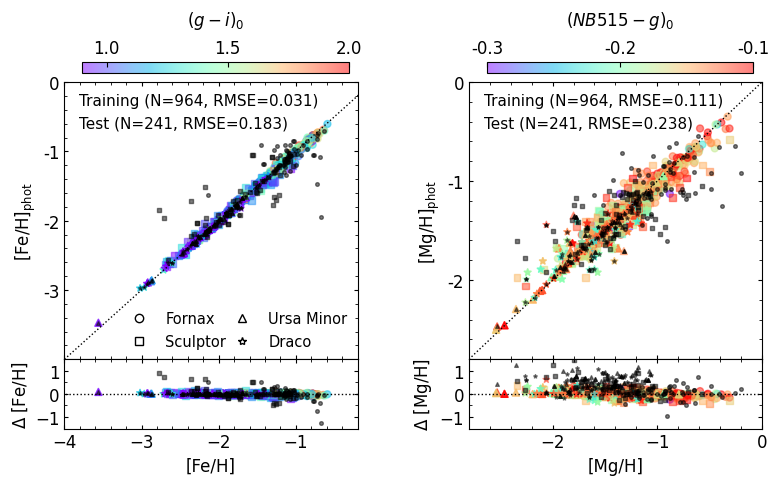

In [120]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_xgboost'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_xgboost'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_xgboost'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_xgboost'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_xgboost'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_xgboost'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_xgboost'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_xgboost'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_xgboost'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_xgboost']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_xgboost']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_xgboost']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_xgboost']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_xgboost']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_xgboost']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_xgboost']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_xgboost']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_xgboost'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_xgboost'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_xgboost'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_xgboost'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_xgboost'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_xgboost'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_xgboost'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_xgboost'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_xgboost'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_xgboost']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_xgboost']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_xgboost']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_xgboost']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_xgboost']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_xgboost']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_xgboost']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_xgboost']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

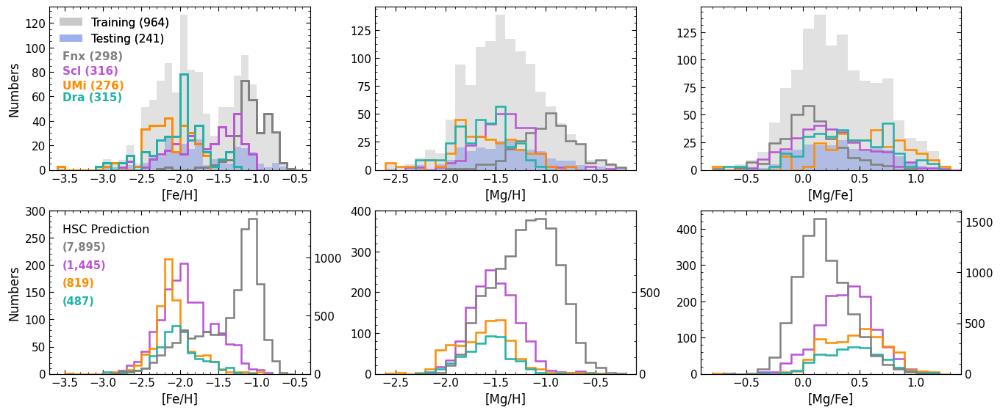

In [121]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_xgboost'], [hsc_scl_mag['FEH_phot_xgboost'], hsc_umi_mag['FEH_phot_xgboost'], hsc_dra_mag['FEH_phot_xgboost']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_xgboost'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_xgboost'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_xgboost'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_xgboost'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_xgboost'], [hsc_scl_mag['MGH_phot_xgboost'], hsc_umi_mag['MGH_phot_xgboost'], hsc_dra_mag['MGH_phot_xgboost']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_xgboost'], [hsc_scl_mag['MGFE_phot_xgboost'], hsc_umi_mag['MGFE_phot_xgboost'], hsc_dra_mag['MGFE_phot_xgboost']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [122]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_xgboost']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_xgboost']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_xgboost']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_xgboost']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_xgboost']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_xgboost']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_xgboost']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_xgboost']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_xgboost']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_xgboost']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_xgboost']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_xgboost']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_xgboost']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_xgboost']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_xgboost']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_xgboost']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_xgboost']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_xgboost']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_xgboost']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.38 ± 0.42,-1.20 ± 0.31,0.18 ± 0.22
hsc_scl_mag,-1.89 ± 0.35,-1.51 ± 0.24,0.39 ± 0.24
hsc_umi_mag,-2.08 ± 0.27,-1.61 ± 0.28,0.47 ± 0.26
hsc_dra_mag,-2.02 ± 0.28,-1.59 ± 0.23,0.43 ± 0.25


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [123]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_xgboost')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_xgboost')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_xgboost')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_xgboost')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.012, 'std': 0.349, 'n': 245, '95% CI (std)': array([-2.695, -1.329]), '99% CI (std)': array([-2.911, -1.113]), '95% CI (SE)': array([-2.056, -1.968])}
Galaxy for: {'mean': -1.045, 'std': 0.224, 'n': 240, '95% CI (std)': array([-1.484, -0.605]), '99% CI (std)': array([-1.623, -0.466]), '95% CI (SE)': array([-1.073, -1.016])}
Galaxy scl: {'mean': -1.644, 'std': 0.4, 'n': 260, '95% CI (std)': array([-2.429, -0.859]), '99% CI (std)': array([-2.677, -0.611]), '95% CI (SE)': array([-1.693, -1.595])}
Galaxy umi: {'mean': -2.158, 'std': 0.3, 'n': 219, '95% CI (std)': array([-2.747, -1.57 ]), '99% CI (std)': array([-2.933, -1.384]), '95% CI (SE)': array([-2.198, -2.119])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.628, 'std': 0.266, 'n': 245, '95% CI (std)': array([-2.149, -1.106]), '99% CI (std)': array([-2.314, -0.941]), '95% CI (SE)': array([-1.661, -1.594])}
Galaxy for: {'mean': -0.996, 'st

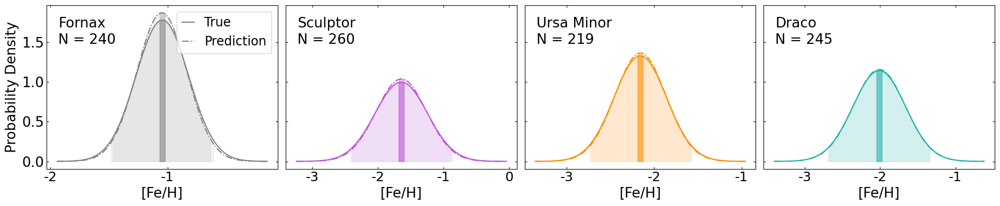

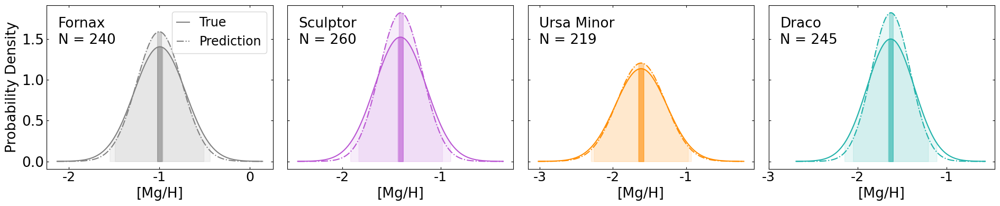

In [124]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_xgboost'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_xgboost'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

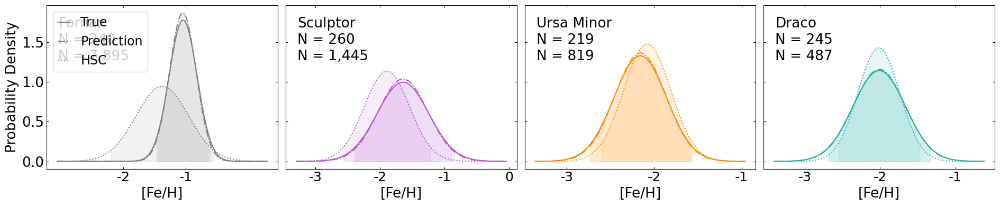

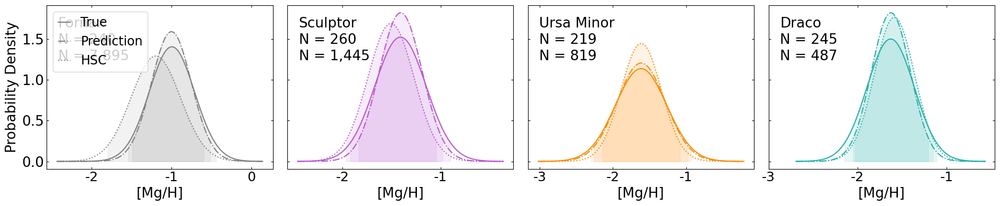

In [125]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_xgboost'], hsc_df_mag['FEH_phot_xgboost'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_xgboost'], hsc_df_mag['MGH_phot_xgboost'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [126]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_xgboost')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_xgboost')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_xgboost')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_xgboost')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0518556052080084, -1.9698219215619435)}
Galaxy for: {'bootstrap 95% CI': (-1.0740393271108417, -1.0153704891956767)}
Galaxy scl: {'bootstrap 95% CI': (-1.6906474354054803, -1.598841993477804)}
Galaxy umi: {'bootstrap 95% CI': (-2.197777043503222, -2.1198229198428975)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6599382942932486, -1.5947626545820177)}
Galaxy for: {'bootstrap 95% CI': (-1.034107492267189, -0.9600630366244088)}
Galaxy scl: {'bootstrap 95% CI': (-1.4386124402848213, -1.3762084464213526)}
Galaxy umi: {'bootstrap 95% CI': (-1.66424375657377, -1.5674703084165698)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.0540772080421448, -1.9676839679479599)}
Galaxy for: {'bootstrap 95% CI': (-1.0764935106039046, -1.0257264822721481)}
Galaxy scl: {'bootstrap 95% CI': (-1.6899160623550415, -1.5962024927139282)}
Galaxy umi

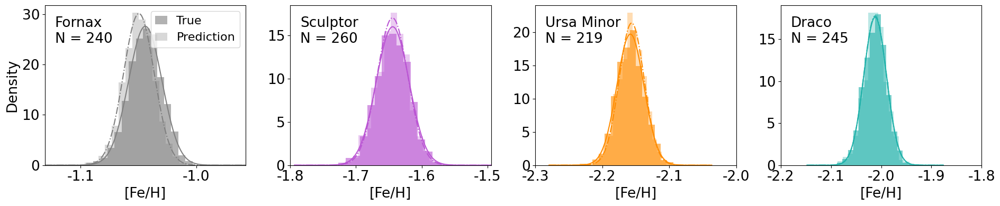

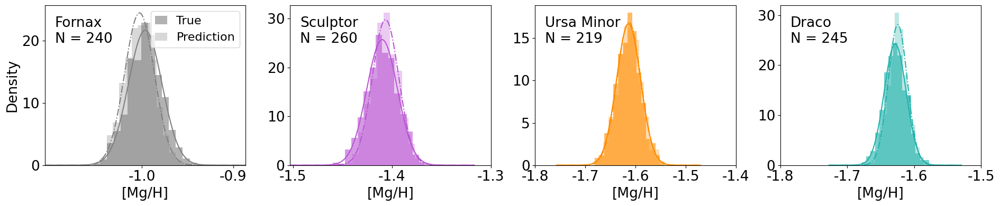

In [127]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_xgboost', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_xgboost', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [128]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_xgboost')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_xgboost')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.017, RMSE = 0.029, Relative Error % = 0.87%
Galaxy for: MAE = 0.150, RMSE = 0.257, Relative Error % = 13.67%
Galaxy scl: MAE = 0.172, RMSE = 0.272, Relative Error % = 10.12%
Galaxy umi: MAE = 0.016, RMSE = 0.023, Relative Error % = 0.73%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.106, RMSE = 0.168, Relative Error % = 6.54%
Galaxy for: MAE = 0.236, RMSE = 0.308, Relative Error % = 24.91%
Galaxy scl: MAE = 0.228, RMSE = 0.288, Relative Error % = 15.93%
Galaxy umi: MAE = 0.098, RMSE = 0.164, Relative Error % = 6.20%

Our FEH predictions are accurate to within 1-14% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 6-25% (95% confidence) across different galaxies.


# ANN (Artificial Neural Network) using Tensorflow-Keras

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_18 (Dense)                │ (None, 1024)           │         7,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 2)              │         2,050 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,306,818 (24.06 MB)

 Trainable params: 6,306,818 (24.06 MB)

 Non-trainable params: 0 (0.00 B)


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
          loss       mae       mse  val_loss   val_mae   val_mse  epoch
495  0.078072  0.205989  0.078072  0.092775  0.217446  0.092775    495
496  0.077426  0.203839  0.077426  0.089769  0.210363  0.089769    496
497  0.074683  0.203732  0.074683  0.112604  0.256999  0.112604    497
498  0.071002  0.201548  0.071002  0.092722  0.216716  0.092722    498
499  0.072976  0.201455  0.072976  0.122022  0.265101  0.122022    499


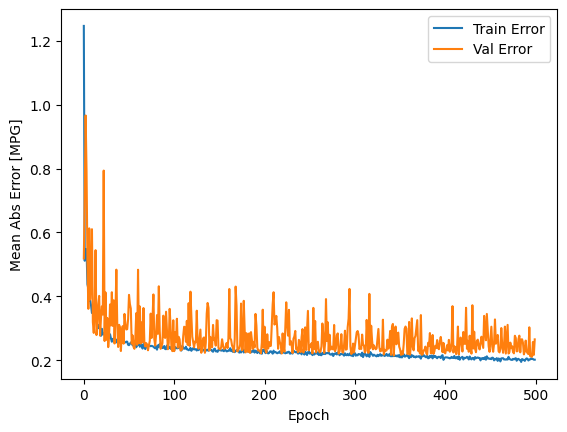

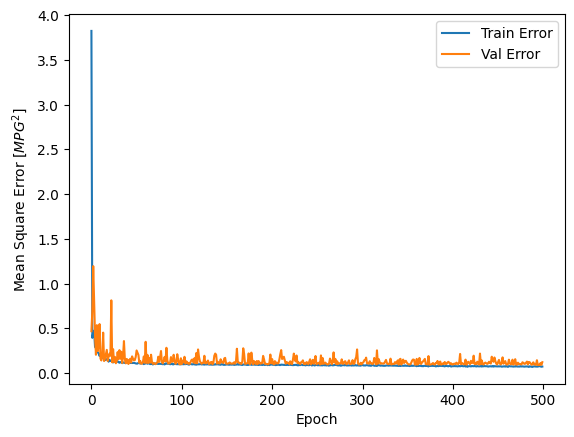

31/31 ━━━━━━━━━━━━━━━━━━━━ 1s 33ms/step
Training RMSE FEH: 0.329
Training RMSE MGH: 0.304
Training R² FEH: 0.620
Training R² MGH: 0.395
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
Test RMSE FEH: 0.346
Test RMSE MGH: 0.301
Test R² FEH: 0.591
Test R² MGH: 0.389
333/333 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step
Training RMSE MGFE: 0.310
Training R² MGFE: 0.302
Test RMSE MGFE: 0.334
Test R² MGFE: 0.166
CPU times: user 6h 31min 32s, sys: 2h 34min 58s, total: 9h 6min 31s
Wall time: 25min 2s


In [129]:
%%time
from tensorflow import keras
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization

# Split the dataset into training and testing sets
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Define the model architecture:
def build_model_ann():
    model = keras.Sequential([
        keras.layers.Dense(1024, activation='relu', input_shape=(6,)),
        keras.layers.Dense(1024, activation='relu'),
        Dropout(0.2),          # prevent overfitting
        keras.layers.Dense(1024, activation='relu'),
        Dropout(0.2),
        keras.layers.Dense(1024, activation='relu'),
        Dropout(0.2),
        keras.layers.Dense(1024, activation='relu'),
        Dropout(0.2),
        keras.layers.Dense(1024, activation='relu'),
        keras.layers.Dense(1024, activation='relu'),
        keras.layers.Dense(2)  # PredictingFEH and MGH 
    ])
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=0.001)
    # Compile the model with RMSprop optimizer and mean squared error loss function
    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae', 'mse'])
    return model

# Create the model and display its summary.
model_ann = build_model_ann()
model_ann.summary()

# Define a custom callback to print a dot at the end of each epoch
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('.', end='')

# Set the number of epochs for training and define early stopping
EPOCHS = 500 #5000
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=500)

# Train the model with the training data, using validation split and early stopping
history = model_ann.fit(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']],
                    train_dataset[['FEH', 'MGH']],
                    epochs=EPOCHS, validation_split=0.2, verbose=0,
                    callbacks=[early_stop, PrintDot()])
# Store the training history and print the final epochs' history
# model_ann.save("model_ann.h5")

# Plot the training history for Mean Absolute Error (MAE) and Mean Squared Error (MSE)
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
print('\n', hist.tail())

def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MPG]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MPG^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.legend()
  plt.show()

plot_history(history)

# Make predictions for the training and test dataset and update the dataframe with predicted FEH and MGH
train_predictions = model_ann.predict(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
train_dataset['FEH_phot_ann'], train_dataset['MGH_phot_ann'] = train_predictions[:, 0], train_predictions[:, 1]
train_dataset['MGFE_phot_ann'] = train_dataset['MGH_phot_ann'] - train_dataset['FEH_phot_ann']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_ann'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_ann'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_ann'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_ann'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_predictions = model_ann.predict(test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
test_dataset['FEH_phot_ann'], test_dataset['MGH_phot_ann'] = test_predictions[:, 0], test_predictions[:, 1]
test_dataset['MGFE_phot_ann'] = test_dataset['MGH_phot_ann'] - test_dataset['FEH_phot_ann']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_ann'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_ann'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_ann'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_ann'])
print(f'Test RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Test RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Test R² FEH: {test_FEH_r2:.3f}') #
print(f'Test R² MGH: {test_MGH_r2:.3f}') #

# Make predictions for the HSC dataset and update the dataframe with predicted FEH and MGH
hsc_predictions = model_ann.predict(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
hsc_df_mag['FEH_phot_ann'], hsc_df_mag['MGH_phot_ann'] = hsc_predictions[:, 0], hsc_predictions[:, 1]
hsc_df_mag['MGFE_phot_ann'] = hsc_df_mag['MGH_phot_ann'] - hsc_df_mag['FEH_phot_ann']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann'] - train_dataset['FEH_phot_ann']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann'] - train_dataset['FEH_phot_ann']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #
test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann'] - test_dataset['FEH_phot_ann']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann'] - test_dataset['FEH_phot_ann']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


In [130]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

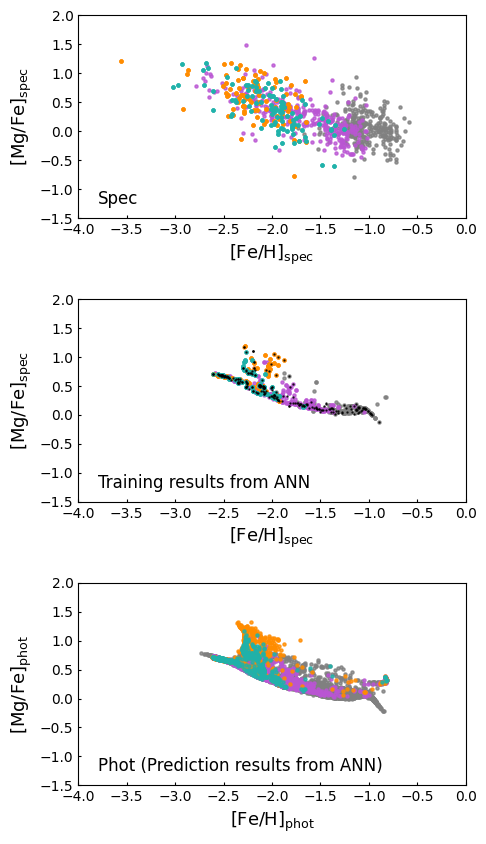

In [131]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_ann'], train_fnx['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_ann'], train_scl['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_ann'], train_umi['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_ann'], train_dra['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_ann'], test_fnx['MGFE_phot_ann'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_ann'], test_scl['MGFE_phot_ann'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_ann'], test_umi['MGFE_phot_ann'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_ann'], test_dra['MGFE_phot_ann'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from ANN', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_ann'], hsc_fnx_mag['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_ann'], hsc_scl_mag['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_ann'], hsc_umi_mag['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_ann'], hsc_dra_mag['MGFE_phot_ann'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from ANN)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)


plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

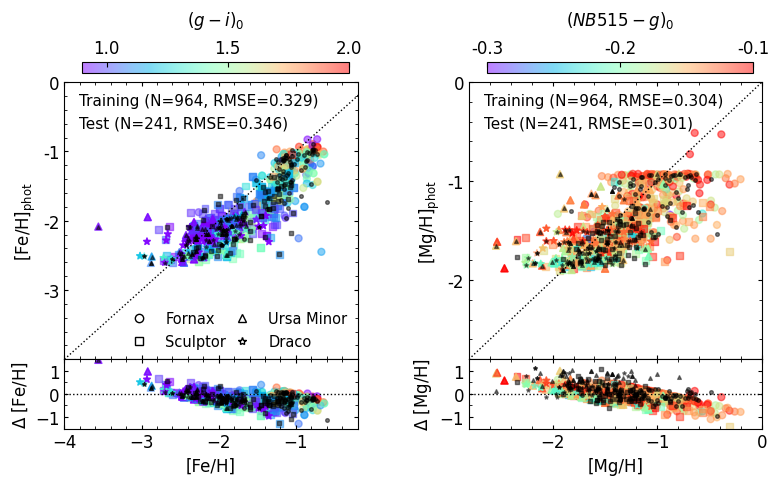

In [132]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_ann'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_ann'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_ann'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_ann'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_ann'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_ann'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_ann'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_ann']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_ann']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_ann']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_ann']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_ann']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_ann']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_ann'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_ann'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_ann'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_ann'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_ann'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_ann'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_ann'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_ann']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_ann']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_ann']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_ann']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_ann']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_ann']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

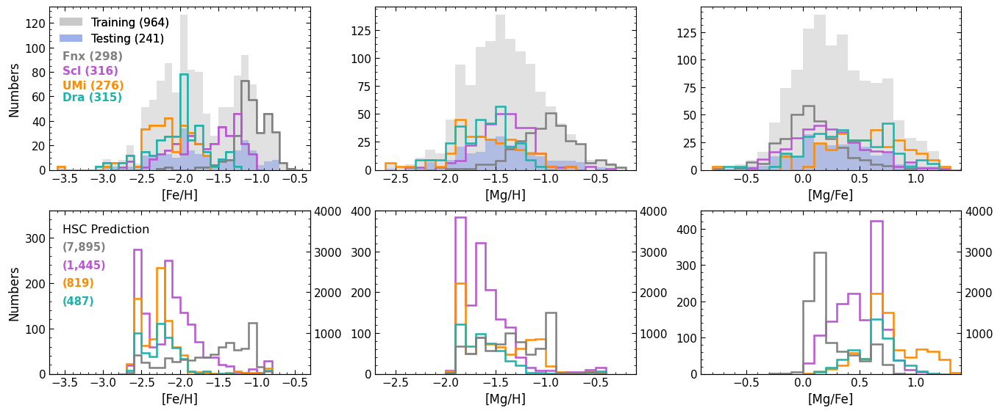

In [133]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(AutoMinorLocator(5))
    ax_twin.set_yticks([1000, 2000, 3000, 4000])
    ax_twin.set_yticklabels(['1000', '2000', '3000', '4000'])
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_ann'], [hsc_scl_mag['FEH_phot_ann'], hsc_umi_mag['FEH_phot_ann'], hsc_dra_mag['FEH_phot_ann']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 360])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_ann'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_ann'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_ann'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_ann'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_ann'], [hsc_scl_mag['MGH_phot_ann'], hsc_umi_mag['MGH_phot_ann'], hsc_dra_mag['MGH_phot_ann']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_ann'], [hsc_scl_mag['MGFE_phot_ann'], hsc_umi_mag['MGFE_phot_ann'], hsc_dra_mag['MGFE_phot_ann']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')


plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [134]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_ann']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_ann']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_ann']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_ann']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_ann']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_ann']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_ann']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_ann']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_ann']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_ann']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_ann']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_ann']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_ann']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_ann']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_ann']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_ann']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_ann']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_ann']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_ann']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_ann']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_ann']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_ann']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_ann']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_ann']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.59 ± 0.48,-1.34 ± 0.31,0.24 ± 0.21
hsc_scl_mag,-2.11 ± 0.37,-1.61 ± 0.25,0.50 ± 0.20
hsc_umi_mag,-2.26 ± 0.30,-1.49 ± 0.33,0.77 ± 0.24
hsc_dra_mag,-2.24 ± 0.28,-1.61 ± 0.24,0.63 ± 0.18


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [135]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_ann')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_ann')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_ann')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_ann')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

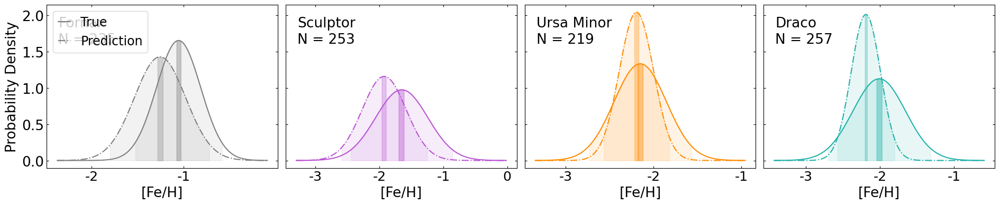

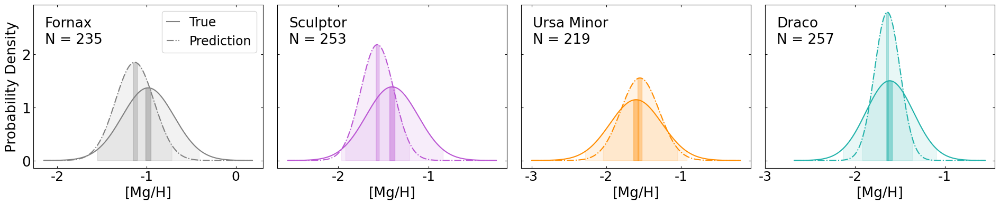

In [136]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_ann'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_ann'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

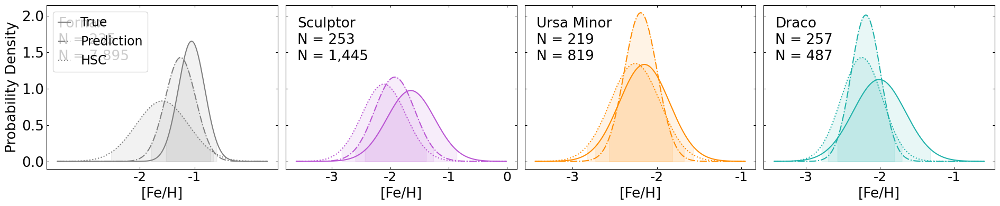

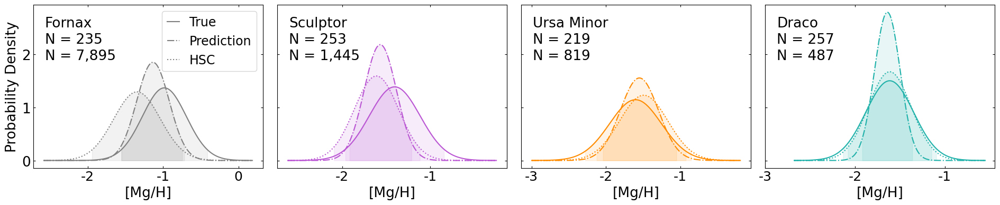

In [137]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_ann'], hsc_df_mag['FEH_phot_ann'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_ann'], hsc_df_mag['MGH_phot_ann'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [138]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_ann')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_ann')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_ann')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_ann')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0516208447769237, -1.9701812230565285)}
Galaxy for: {'bootstrap 95% CI': (-1.0835189260567524, -1.021090392647308)}
Galaxy scl: {'bootstrap 95% CI': (-1.69896371440964, -1.5966801678375198)}
Galaxy umi: {'bootstrap 95% CI': (-2.190039712934851, -2.1113210084276144)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.647213140561931, -1.5793975571164003)}
Galaxy for: {'bootstrap 95% CI': (-1.0199835577634282, -0.9462805470277282)}
Galaxy scl: {'bootstrap 95% CI': (-1.4371350529583429, -1.3688972192368134)}
Galaxy umi: {'bootstrap 95% CI': (-1.6450902210841818, -1.5537402453179092)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.21336829662323, -2.166335916519165)}
Galaxy for: {'bootstrap 95% CI': (-1.293768236041069, -1.220972752571106)}
Galaxy scl: {'bootstrap 95% CI': (-1.9687747001647948, -1.8838180869817733)}
Galaxy umi: {'b

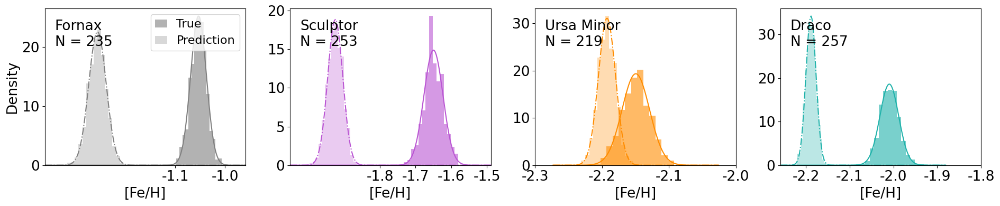

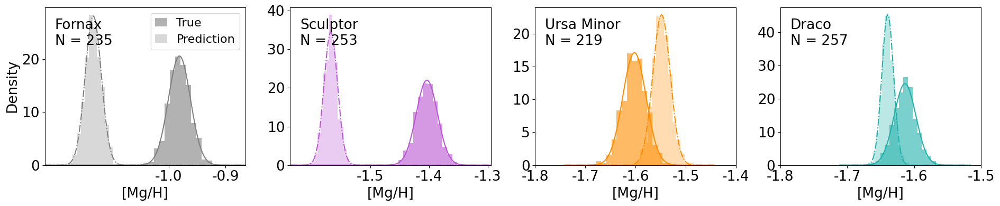

In [139]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_ann', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_ann', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [140]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_ann')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_ann')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.260, RMSE = 0.299, Relative Error % = 12.97%
Galaxy for: MAE = 0.246, RMSE = 0.331, Relative Error % = 23.20%
Galaxy scl: MAE = 0.367, RMSE = 0.437, Relative Error % = 22.03%
Galaxy umi: MAE = 0.191, RMSE = 0.286, Relative Error % = 8.81%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.221, RMSE = 0.259, Relative Error % = 13.19%
Galaxy for: MAE = 0.264, RMSE = 0.335, Relative Error % = 26.30%
Galaxy scl: MAE = 0.218, RMSE = 0.278, Relative Error % = 15.04%
Galaxy umi: MAE = 0.238, RMSE = 0.324, Relative Error % = 14.63%

Our FEH predictions are accurate to within 9-23% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 13-26% (95% confidence) across different galaxies.


# ANN using PyTorch

ANNModel(
  (fc1): Linear(in_features=6, out_features=1024, bias=True)
  (fc2): Linear(in_features=1024, out_features=1024, bias=True)
  (fc3): Linear(in_features=1024, out_features=1024, bias=True)
  (fc4): Linear(in_features=1024, out_features=1024, bias=True)
  (fc5): Linear(in_features=1024, out_features=1024, bias=True)
  (fc6): Linear(in_features=1024, out_features=1024, bias=True)
  (fc7): Linear(in_features=1024, out_features=2, bias=True)
  (dropout): Dropout(p=0.2, inplace=False)
)

Epoch 0/500:
....................................................................................................
Epoch 100/500:
....................................................................................................
Epoch 200/500:
....................................................................................................
Epoch 300/500:
....................................................................................................
Epoch 400/500:
.........................

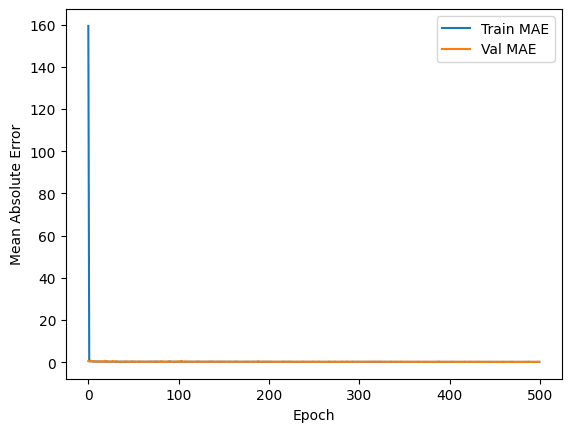

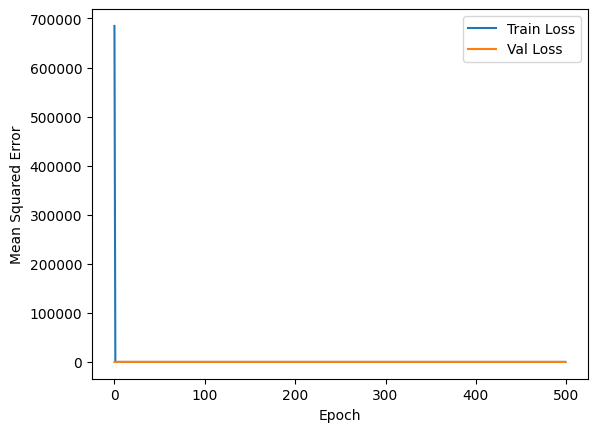

Training RMSE FEH: 0.443
Training RMSE MGH: 0.470
Training R² FEH: 0.754
Training R² MGH: -0.450
Training RMSE FEH: 0.289
Training RMSE MGH: 0.448
Training R² FEH: 0.714
Training R² MGH: -0.354
Training RMSE MGFE: 0.384
Training R² MGFE: -0.071
Test RMSE MGFE: 0.362
Test R² MGFE: 0.017
CPU times: user 1h 20min 6s, sys: 1min 34s, total: 1h 21min 40s
Wall time: 1h 22min 32s


In [141]:
%%time
import torch
from torch.utils.data import Dataset, TensorDataset
from torch.utils.data import DataLoader
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from sklearn.metrics import r2_score

# Split the data
train_df_full, test_df = train_test_split(df_mag, test_size=0.2, random_state=42)
# Set the validation (training) sample
train_df, val_df = train_test_split(train_df_full, test_size=0.2, random_state=42)

# Input features
feature_cols = ['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']
target_cols  = ['FEH', 'MGH']

# Conversion Tensor (dtype: float32)
x_train = torch.tensor(train_df[feature_cols].values, dtype=torch.float32)
y_train = torch.tensor(train_df[target_cols].values, dtype=torch.float32)
x_val   = torch.tensor(val_df[feature_cols].values, dtype=torch.float32)
y_val   = torch.tensor(val_df[target_cols].values, dtype=torch.float32)
x_test  = torch.tensor(test_df[feature_cols].values, dtype=torch.float32)

# Make TensorDataset and DataLoader
batch_size = 32
train_data = TensorDataset(x_train, y_train)
val_data   = TensorDataset(x_val, y_val)
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader   = DataLoader(val_data, batch_size=batch_size, shuffle=False)

# Define model
class ANNModel(nn.Module):
    def __init__(self):
        super(ANNModel, self).__init__()
        self.fc1 = nn.Linear(6, 1024)
        self.fc2 = nn.Linear(1024, 1024)
        self.fc3 = nn.Linear(1024, 1024)
        self.fc4 = nn.Linear(1024, 1024)
        self.fc5 = nn.Linear(1024, 1024)
        self.fc6 = nn.Linear(1024, 1024)
        self.fc7 = nn.Linear(1024, 2)
        self.dropout = nn.Dropout(0.2)
        
    def forward(self, x):
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.dropout(x)
        x = F.relu(self.fc3(x))
        x = self.dropout(x)
        x = F.relu(self.fc4(x))
        x = self.dropout(x)
        x = F.relu(self.fc5(x))
        x = F.relu(self.fc6(x))
        x = self.fc7(x)
        return x

model = ANNModel()
print(model)

# Set the optimizer and loss function
optimizer = optim.RMSprop(model.parameters(), lr=0.001)
criterion = nn.MSELoss()

# Learning loop with Early Stopping
EPOCHS = 500
patience = 500
best_val_loss = float('inf')
epochs_no_improve = 0

# Make lists to save the learning/validation/MAE
train_losses, val_losses = [], []
train_mae, val_mae = [], []

for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0
    running_mae = 0.0
    for inputs, targets in train_loader:
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, targets)
        loss.backward()
        optimizer.step()
        
        running_loss += loss.item() * inputs.size(0)
        running_mae += torch.mean(torch.abs(outputs - targets)).item() * inputs.size(0)
    
    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_mae = running_mae / len(train_loader.dataset)
    train_losses.append(epoch_loss)
    train_mae.append(epoch_mae)
    
    # Validation
    model.eval()
    val_running_loss = 0.0
    val_running_mae = 0.0
    with torch.no_grad():
        for inputs, targets in val_loader:
            outputs = model(inputs)
            loss = criterion(outputs, targets)
            val_running_loss += loss.item() * inputs.size(0)
            val_running_mae += torch.mean(torch.abs(outputs - targets)).item() * inputs.size(0)
    val_epoch_loss = val_running_loss / len(val_loader.dataset)
    val_epoch_mae = val_running_mae / len(val_loader.dataset)
    val_losses.append(val_epoch_loss)
    val_mae.append(val_epoch_mae)
    
    # Go to the new line every 100 epoch
    if epoch % 100 == 0:
        print(f"\nEpoch {epoch}/{EPOCHS}:")
    print('.', end='')
    
    # Early Stopping: Save the model when the validation loss improves
    if val_epoch_loss < best_val_loss:
        best_val_loss = val_epoch_loss
        epochs_no_improve = 0
        best_model_state = model.state_dict()
    else:
        epochs_no_improve += 1
    if epochs_no_improve >= patience:
        print("\nEarly stopping at epoch", epoch)
        break

print('\nTraining complete.')

# Visualize learning process
plt.figure()
plt.xlabel('Epoch')
plt.ylabel('Mean Absolute Error')
plt.plot(train_mae, label='Train MAE')
plt.plot(val_mae, label='Val MAE')
plt.legend()
plt.show()

plt.figure()
plt.xlabel('Epoch')
plt.ylabel('Mean Squared Error')
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.legend()
plt.show()

# Get prediction
# Load the best model parameters in modeling
model.load_state_dict(best_model_state)
model.eval()

with torch.no_grad():
    # Predict test sample
    test_preds = model(x_test).numpy()
    # Predict training sample
    x_train_full = torch.tensor(train_df_full[feature_cols].values, dtype=torch.float32)
    train_preds = model(x_train_full).numpy()
    # Predict HSC sample
    x_hsc = torch.tensor(hsc_df_mag[feature_cols].values, dtype=torch.float32)
    hsc_preds = model(x_hsc).numpy()

train_dataset = train_df_full
test_dataset = test_df

# Save the prediction to the dataframe
train_dataset['FEH_phot_ann_pytorch'] = train_preds[:, 0]
train_dataset['MGH_phot_ann_pytorch'] = train_preds[:, 1]
train_dataset['MGFE_phot_ann_pytorch'] = train_dataset['MGH_phot_ann_pytorch'] - train_dataset['FEH_phot_ann_pytorch']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['MGH_phot_ann_pytorch'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_ann_pytorch'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_ann_pytorch'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_ann_pytorch'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_dataset['FEH_phot_ann_pytorch'] = test_preds[:, 0]
test_dataset['MGH_phot_ann_pytorch'] = test_preds[:, 1]
test_dataset['MGFE_phot_ann_pytorch'] = test_dataset['MGH_phot_ann_pytorch'] - test_dataset['FEH_phot_ann_pytorch']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_ann_pytorch'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_ann_pytorch'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_ann_pytorch'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_ann_pytorch'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

hsc_df_mag['FEH_phot_ann_pytorch'] = hsc_preds[:, 0]
hsc_df_mag['MGH_phot_ann_pytorch'] = hsc_preds[:, 1]
hsc_df_mag['MGFE_phot_ann_pytorch'] = hsc_df_mag['MGH_phot_ann_pytorch'] - hsc_df_mag['FEH_phot_ann_pytorch']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann_pytorch'] - train_dataset['FEH_phot_ann_pytorch']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann_pytorch'] - train_dataset['FEH_phot_ann_pytorch']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann_pytorch'] - test_dataset['FEH_phot_ann_pytorch']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann_pytorch'] - test_dataset['FEH_phot_ann_pytorch']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


In [142]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

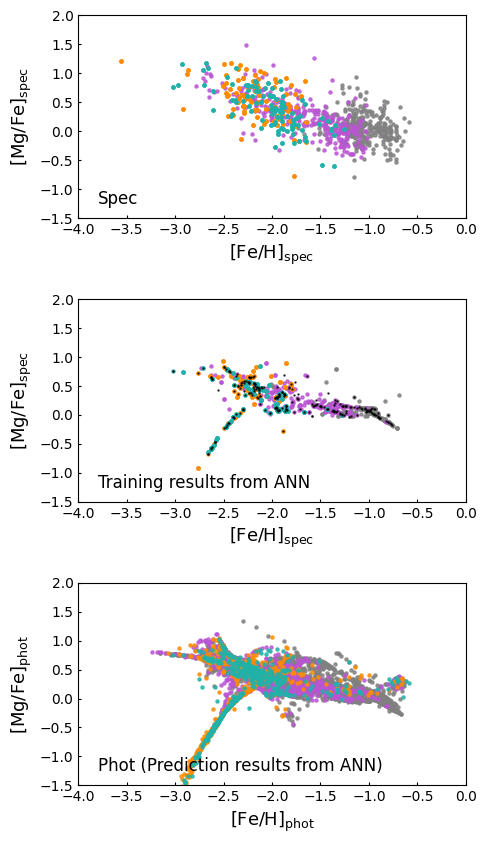

In [143]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_ann_pytorch'], train_fnx['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_ann_pytorch'], train_scl['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_ann_pytorch'], train_umi['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_ann_pytorch'], train_dra['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_ann_pytorch'], test_fnx['MGFE_phot_ann_pytorch'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_ann_pytorch'], test_scl['MGFE_phot_ann_pytorch'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_ann_pytorch'], test_umi['MGFE_phot_ann_pytorch'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_ann_pytorch'], test_dra['MGFE_phot_ann_pytorch'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from ANN', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_ann_pytorch'], hsc_fnx_mag['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_ann_pytorch'], hsc_scl_mag['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_ann_pytorch'], hsc_umi_mag['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_ann_pytorch'], hsc_dra_mag['MGFE_phot_ann_pytorch'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from ANN)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

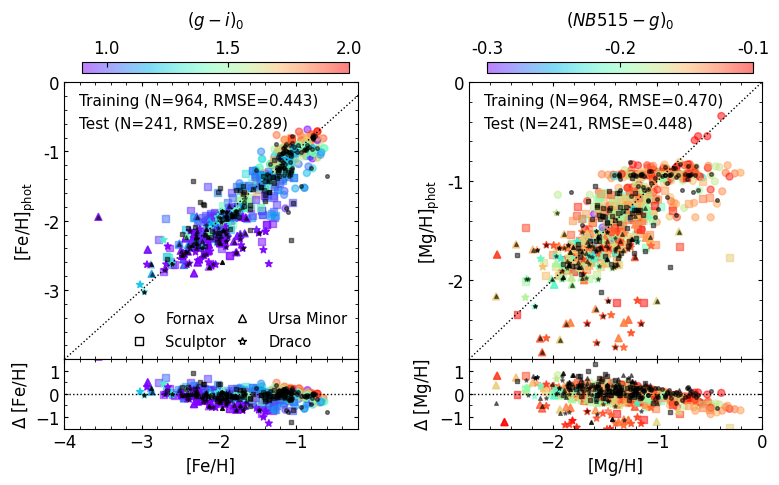

In [144]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_ann_pytorch'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann_pytorch']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_ann_pytorch']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_ann_pytorch']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_ann_pytorch']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann_pytorch']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_ann_pytorch']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_ann_pytorch']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_ann_pytorch']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_ann_pytorch'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_ann_pytorch'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['MGH'], test_FEH['MGH_phot_ann_pytorch'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann_pytorch']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_ann_pytorch']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_ann_pytorch']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_ann_pytorch']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann_pytorch']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_ann_pytorch']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_ann_pytorch']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_ann_pytorch']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

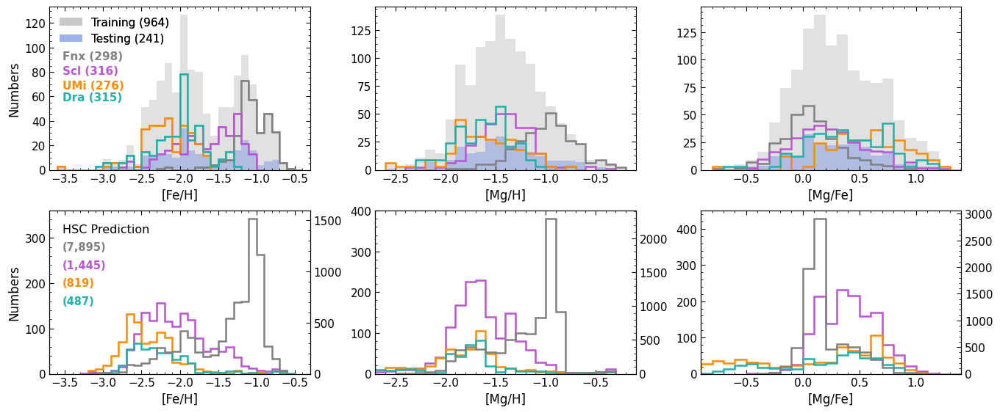

In [145]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_ann_pytorch'], [hsc_scl_mag['FEH_phot_ann_pytorch'], hsc_umi_mag['FEH_phot_ann_pytorch'], hsc_dra_mag['FEH_phot_ann_pytorch']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 360])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_ann_pytorch'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_ann_pytorch'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_ann_pytorch'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_ann_pytorch'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_ann_pytorch'], [hsc_scl_mag['MGH_phot_ann_pytorch'], hsc_umi_mag['MGH_phot_ann_pytorch'], hsc_dra_mag['MGH_phot_ann_pytorch']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_ann_pytorch'], [hsc_scl_mag['MGFE_phot_ann_pytorch'], hsc_umi_mag['MGFE_phot_ann_pytorch'], hsc_dra_mag['MGFE_phot_ann_pytorch']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')


plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [146]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_ann_pytorch']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_ann_pytorch']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_ann_pytorch']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_ann_pytorch']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_ann_pytorch']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_ann_pytorch']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_ann_pytorch']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_ann_pytorch']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_ann_pytorch']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_ann_pytorch']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_ann_pytorch']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_ann_pytorch']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_ann_pytorch']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_ann_pytorch']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_ann_pytorch']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_ann_pytorch']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.39 ± 0.49,-1.20 ± 0.35,0.19 ± 0.20
hsc_scl_mag,-2.02 ± 0.44,-1.62 ± 0.34,0.40 ± 0.24
hsc_umi_mag,-2.40 ± 0.40,-2.40 ± 0.96,-0.00 ± 0.69
hsc_dra_mag,-2.25 ± 0.41,-2.10 ± 0.74,0.16 ± 0.49


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [147]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_ann_pytorch')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_ann_pytorch')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_ann_pytorch')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_ann_pytorch')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

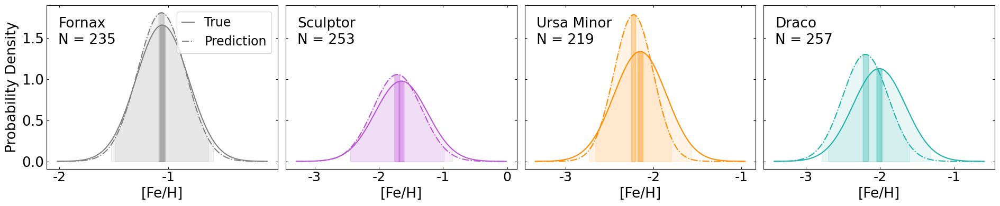

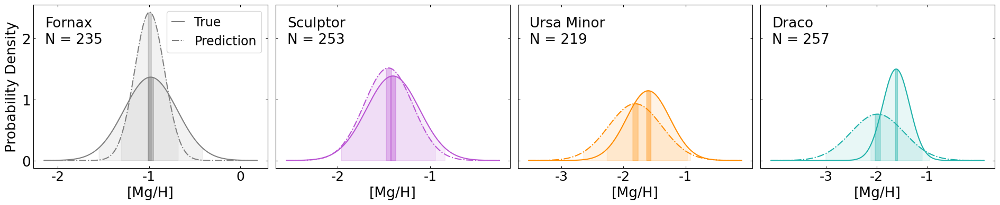

In [148]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_ann_pytorch'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_ann_pytorch'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

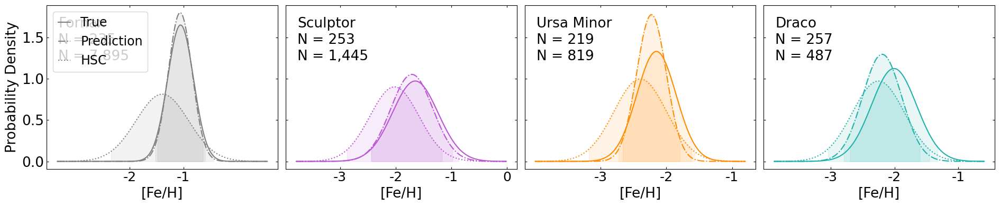

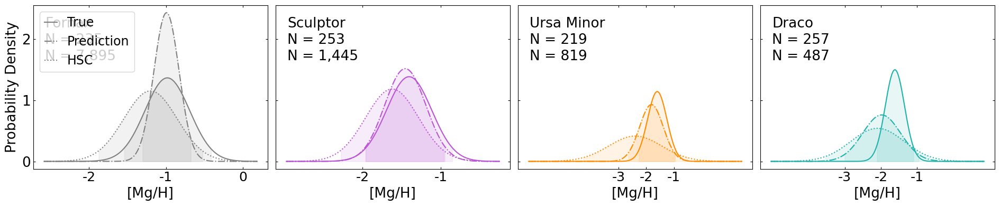

In [149]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_ann_pytorch'], hsc_df_mag['FEH_phot_ann_pytorch'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_ann_pytorch'], hsc_df_mag['MGH_phot_ann_pytorch'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [150]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_ann_pytorch')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_ann_pytorch')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_ann_pytorch')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_ann_pytorch')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.047981733743462, -1.9677177711706944)}
Galaxy for: {'bootstrap 95% CI': (-1.0839869748157092, -1.0240211776331292)}
Galaxy scl: {'bootstrap 95% CI': (-1.701023499310946, -1.599173990606401)}
Galaxy umi: {'bootstrap 95% CI': (-2.188761572422746, -2.1132795828036173)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.64727010093634, -1.580397552662674)}
Galaxy for: {'bootstrap 95% CI': (-1.0186300019408474, -0.9449541386271376)}
Galaxy scl: {'bootstrap 95% CI': (-1.4385699813376074, -1.3693896882854975)}
Galaxy umi: {'bootstrap 95% CI': (-1.6483327646151973, -1.5572114016795966)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.2319000124931336, -2.156415957212448)}
Galaxy for: {'bootstrap 95% CI': (-1.0896397799253463, -1.035043728351593)}
Galaxy scl: {'bootstrap 95% CI': (-1.759409499168396, -1.6633266806602478)}
Galaxy umi: {'b

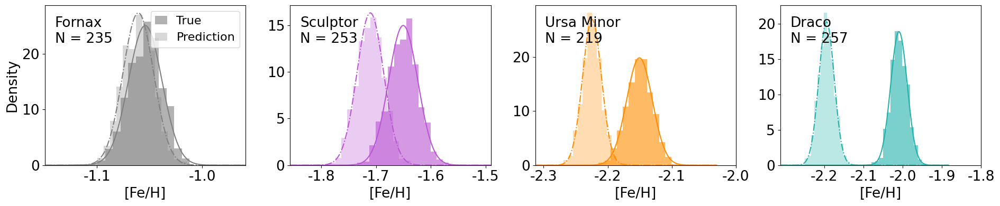

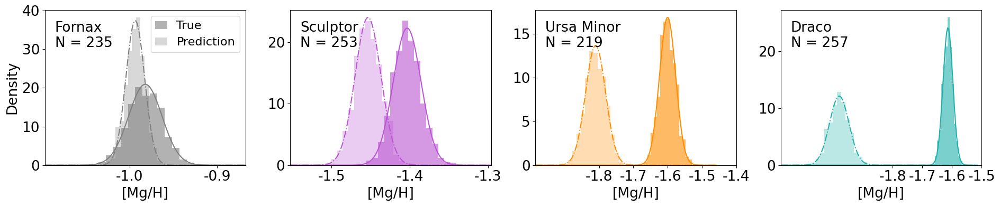

In [151]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_ann_pytorch', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_ann_pytorch', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [152]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_ann_pytorch')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_ann_pytorch')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.194, RMSE = 0.282, Relative Error % = 9.68%
Galaxy for: MAE = 0.157, RMSE = 0.230, Relative Error % = 14.86%
Galaxy scl: MAE = 0.205, RMSE = 0.295, Relative Error % = 12.33%
Galaxy umi: MAE = 0.214, RMSE = 0.342, Relative Error % = 9.87%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.373, RMSE = 0.545, Relative Error % = 22.29%
Galaxy for: MAE = 0.228, RMSE = 0.283, Relative Error % = 22.66%
Galaxy scl: MAE = 0.218, RMSE = 0.289, Relative Error % = 15.04%
Galaxy umi: MAE = 0.395, RMSE = 0.603, Relative Error % = 24.25%

Our FEH predictions are accurate to within 10-15% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 15-24% (95% confidence) across different galaxies.


# ANN using Scikit-learn

Iteration 1, loss = 0.84805391
Validation score: -1.699964
Iteration 2, loss = 0.30251846
Validation score: -0.425469
Iteration 3, loss = 0.17744402
Validation score: -0.414677
Iteration 4, loss = 0.17351863
Validation score: -0.045375
Iteration 5, loss = 0.12859106
Validation score: -0.130100
Iteration 6, loss = 0.11545453
Validation score: -0.052807
Iteration 7, loss = 0.10953014
Validation score: -0.040725
Iteration 8, loss = 0.10381398
Validation score: 0.099322
Iteration 9, loss = 0.09721410
Validation score: 0.103216
Iteration 10, loss = 0.09408434
Validation score: 0.186688
Iteration 11, loss = 0.08827674
Validation score: 0.199895
Iteration 12, loss = 0.08228802
Validation score: 0.310574
Iteration 13, loss = 0.07212853
Validation score: 0.375432
Iteration 14, loss = 0.06378430
Validation score: 0.293229
Iteration 15, loss = 0.06259632
Validation score: 0.438119
Iteration 16, loss = 0.05734785
Validation score: 0.365312
Iteration 17, loss = 0.06036604
Validation score: 0.416778

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


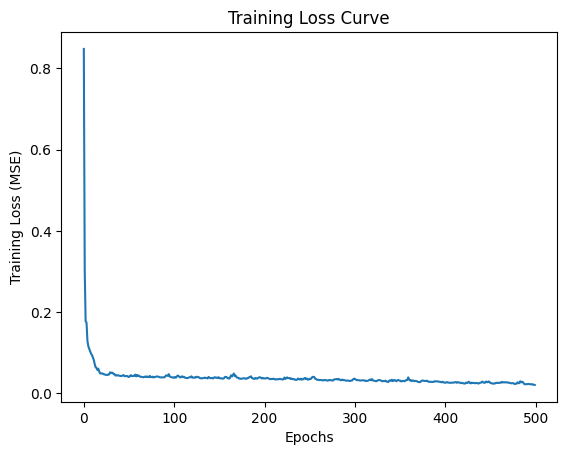

Training RMSE FEH: 0.240
Training RMSE MGH: 0.463
Training R² FEH: 0.803
Training R² MGH: -0.450
Training RMSE FEH: 0.206
Training RMSE MGH: 0.236
Training R² FEH: 0.851
Training R² MGH: 0.636
Training RMSE MGFE: 0.251
Training R² MGFE: 0.543
Test RMSE MGFE: 0.302
Test R² MGFE: 0.316
CPU times: user 18min 39s, sys: 3.27 s, total: 18min 42s
Wall time: 18min 41s


In [156]:
%%time
from sklearn.neural_network import MLPRegressor

# Split the data
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Input features
features = ['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']
targets  = ['FEH', 'MGH']

X_train = train_dataset[features]
y_train = train_dataset[targets]

# Make a model using MLPRegressor of Scikit-learn
# 5 hidden layers with 1024 units, activating relu
model_ann = MLPRegressor(hidden_layer_sizes=(1024, 1024, 1024, 1024, 1024),
                         activation='relu',
                         solver='adam',             # Use adam, sililar to RMSprop
                         learning_rate_init=0.001,
                         max_iter=500,              # Maximum number of epochs
                         early_stopping=True,       # Use internal validation split
                         validation_fraction=0.2,   # Use 20% of the training data as validation  
                         n_iter_no_change=500,      # Corresponds to patience (early stopping if no improvement)  
                         random_state=42,
                         verbose=True)

# Make a model
model_ann.fit(X_train, y_train)

# Visualize training process (loss_curve_ records training MSE)  
plt.figure()
plt.plot(model_ann.loss_curve_)
plt.xlabel('Epochs')
plt.ylabel('Training Loss (MSE)')
plt.title('Training Loss Curve')
plt.show()

# Get predictions of training and test dataset
X_test = test_dataset[features]
test_predictions = model_ann.predict(X_test)
test_dataset['FEH_phot_ann_sklearn'] = test_predictions[:, 0]
test_dataset['MGH_phot_ann_sklearn'] = test_predictions[:, 1]
test_dataset['MGFE_phot_ann_sklearn'] = test_dataset['MGH_phot_ann_sklearn'] - test_dataset['FEH_phot_ann_sklearn']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_ann_sklearn'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['FEH_phot_ann_sklearn'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_ann_sklearn'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['FEH_phot_ann_sklearn'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

train_predictions = model_ann.predict(X_train)
train_dataset['FEH_phot_ann_sklearn'] = train_predictions[:, 0]
train_dataset['MGH_phot_ann_sklearn'] = train_predictions[:, 1]
train_dataset['MGFE_phot_ann_sklearn'] = train_dataset['FEH_phot_ann_sklearn'] - train_dataset['FEH_phot_ann_sklearn']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_ann_sklearn'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_ann_sklearn'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_ann_sklearn'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_ann_sklearn'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

# Get predictions of the HSC samples
X_hsc = hsc_df_mag[features]
hsc_predictions = model_ann.predict(X_hsc)
hsc_df_mag['FEH_phot_ann_sklearn'] = hsc_predictions[:, 0]
hsc_df_mag['MGH_phot_ann_sklearn'] = hsc_predictions[:, 1]
hsc_df_mag['MGFE_phot_ann_sklearn'] = hsc_df_mag['MGH_phot_ann_sklearn'] - hsc_df_mag['FEH_phot_ann_sklearn']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann_sklearn'] - train_dataset['FEH_phot_ann_sklearn']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_ann_sklearn'] - train_dataset['FEH_phot_ann_sklearn']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann_sklearn'] - test_dataset['FEH_phot_ann_sklearn']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_ann_sklearn'] - test_dataset['FEH_phot_ann_sklearn']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


In [157]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

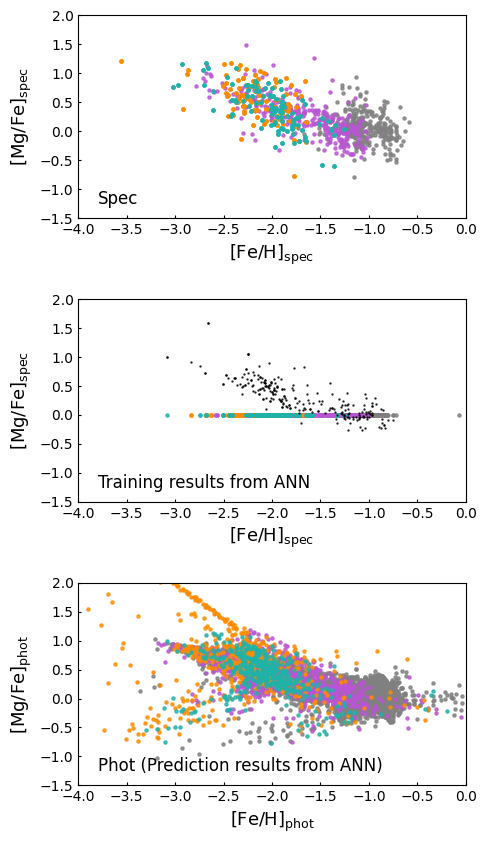

In [158]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_ann_sklearn'], train_fnx['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_ann_sklearn'], train_scl['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_ann_sklearn'], train_umi['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_ann_sklearn'], train_dra['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_ann_sklearn'], test_fnx['MGFE_phot_ann_sklearn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_ann_sklearn'], test_scl['MGFE_phot_ann_sklearn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_ann_sklearn'], test_umi['MGFE_phot_ann_sklearn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_ann_sklearn'], test_dra['MGFE_phot_ann_sklearn'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from ANN', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_ann_sklearn'], hsc_fnx_mag['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_ann_sklearn'], hsc_scl_mag['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_ann_sklearn'], hsc_umi_mag['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_ann_sklearn'], hsc_dra_mag['MGFE_phot_ann_sklearn'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from ANN)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)


plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

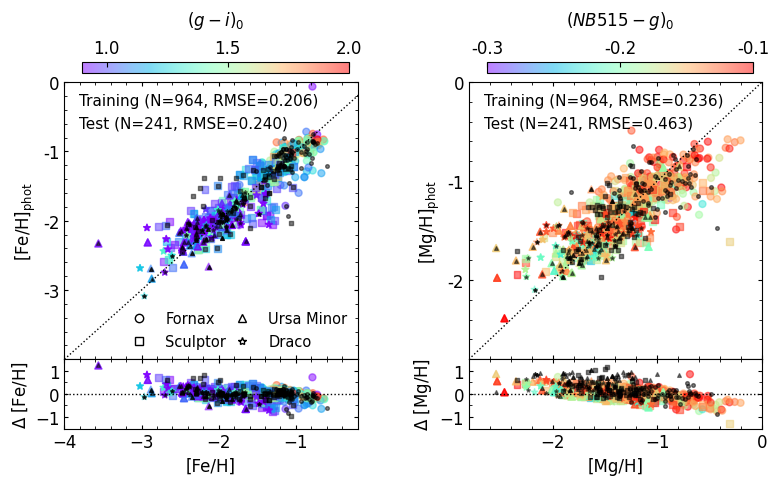

In [168]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_ann_sklearn'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_ann_sklearn']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_ann_sklearn']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_ann_sklearn']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_ann_sklearn']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_ann_sklearn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_ann_sklearn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_ann_sklearn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_ann_sklearn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_ann_sklearn'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_ann_sklearn'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['MGH'], test_FEH['MGH_phot_ann_sklearn'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_ann_sklearn']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_ann_sklearn']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_ann_sklearn']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_ann_sklearn']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_ann_sklearn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_ann_sklearn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_ann_sklearn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_ann_sklearn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

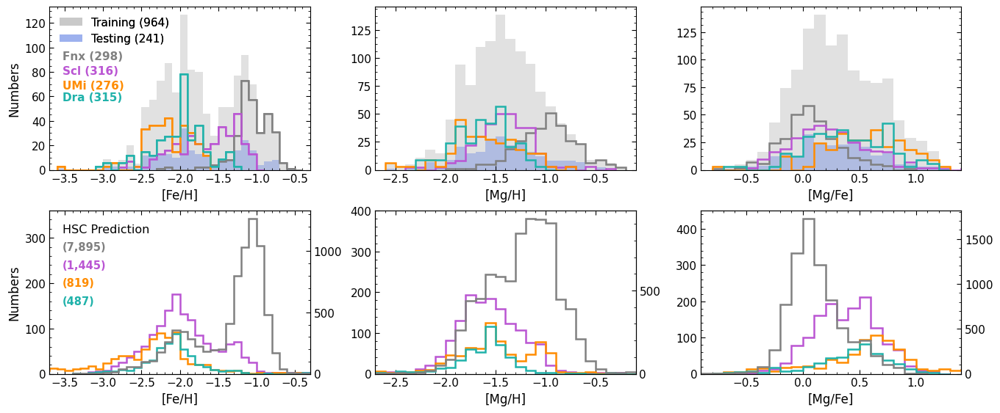

In [169]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_ann_sklearn'], [hsc_scl_mag['FEH_phot_ann_sklearn'], hsc_umi_mag['FEH_phot_ann_sklearn'], hsc_dra_mag['FEH_phot_ann_sklearn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 360])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_ann_sklearn'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_ann_sklearn'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_ann_sklearn'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_ann_sklearn'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_ann_sklearn'], [hsc_scl_mag['MGH_phot_ann_sklearn'], hsc_umi_mag['MGH_phot_ann_sklearn'], hsc_dra_mag['MGH_phot_ann_sklearn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_ann_sklearn'], [hsc_scl_mag['MGFE_phot_ann_sklearn'], hsc_umi_mag['MGFE_phot_ann_sklearn'], hsc_dra_mag['MGFE_phot_ann_sklearn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [170]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_ann_sklearn']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_ann_sklearn']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_ann_sklearn']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_ann_sklearn']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_ann_sklearn']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_ann_sklearn']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_ann_sklearn']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_ann_sklearn']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_ann_sklearn']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_ann_sklearn']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_ann_sklearn']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_ann_sklearn']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_ann_sklearn']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_ann_sklearn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_ann_sklearn']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_ann_sklearn']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.37 ± 0.49,-1.24 ± 0.36,0.13 ± 0.24
hsc_scl_mag,-1.94 ± 0.46,-1.56 ± 0.33,0.38 ± 0.29
hsc_umi_mag,-2.42 ± 0.62,-1.63 ± 0.61,0.79 ± 0.76
hsc_dra_mag,-2.08 ± 0.39,-1.67 ± 0.44,0.41 ± 0.34


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [171]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_ann_sklearn')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_ann_sklearn')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_ann_sklearn')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_ann_sklearn')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

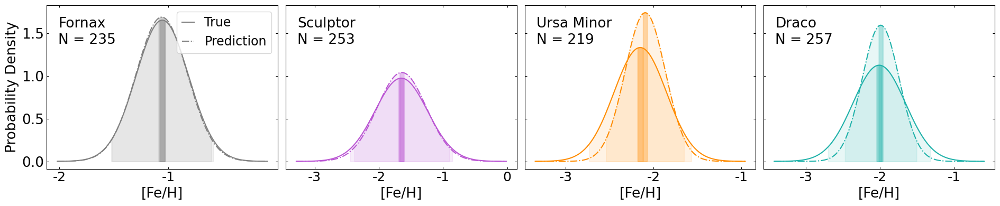

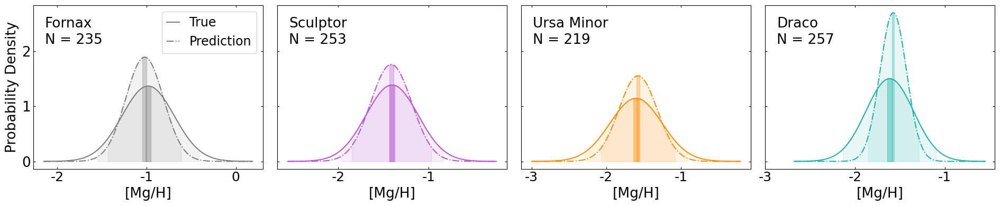

In [172]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_ann_sklearn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_ann_sklearn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

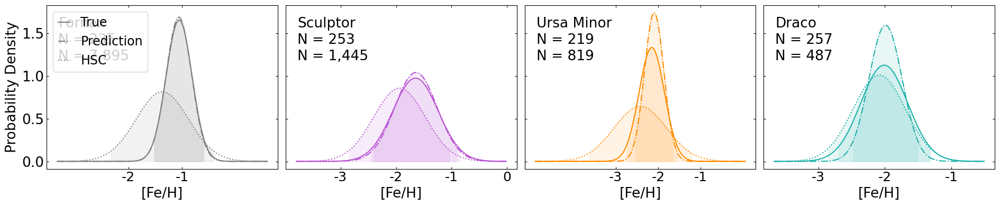

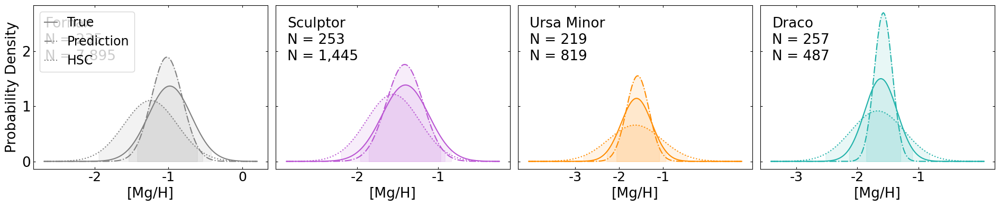

In [164]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_ann_sklearn'], hsc_df_mag['FEH_phot_ann_sklearn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_ann_sklearn'], hsc_df_mag['MGH_phot_ann_sklearn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [165]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_ann_sklearn')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_ann_sklearn')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_ann_sklearn')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_ann_sklearn')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.052666193934153, -1.964644585720857)}
Galaxy for: {'bootstrap 95% CI': (-1.0856500792370787, -1.024485662940351)}
Galaxy scl: {'bootstrap 95% CI': (-1.6995613880989806, -1.596507555392942)}
Galaxy umi: {'bootstrap 95% CI': (-2.1908034470632005, -2.1102191369904864)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6452028095471467, -1.5824052221285)}
Galaxy for: {'bootstrap 95% CI': (-1.020690967655656, -0.9472400747795731)}
Galaxy scl: {'bootstrap 95% CI': (-1.4394378469269087, -1.369225854268979)}
Galaxy umi: {'bootstrap 95% CI': (-1.6464871847805502, -1.5541659860066874)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.017396365379496, -1.9578915199696039)}
Galaxy for: {'bootstrap 95% CI': (-1.0890587048641254, -1.0291976380986414)}
Galaxy scl: {'bootstrap 95% CI': (-1.6899802728606115, -1.5941283292110682)}
Galaxy umi: {'b

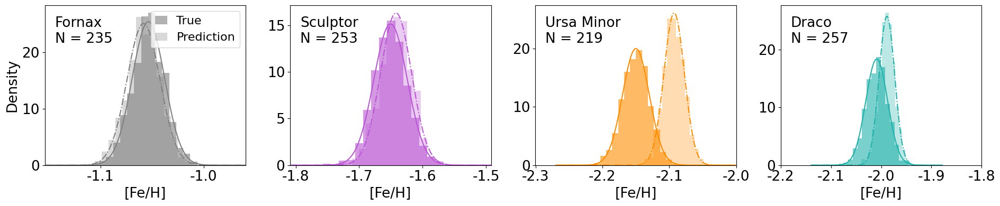

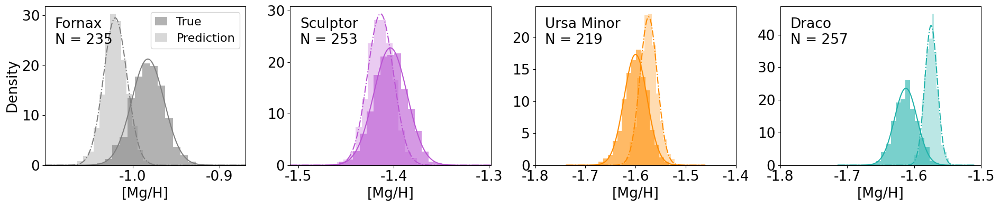

In [166]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_ann_sklearn', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_ann_sklearn', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [167]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_ann_sklearn')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_ann_sklearn')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.110, RMSE = 0.145, Relative Error % = 5.47%
Galaxy for: MAE = 0.146, RMSE = 0.214, Relative Error % = 13.82%
Galaxy scl: MAE = 0.205, RMSE = 0.300, Relative Error % = 12.29%
Galaxy umi: MAE = 0.178, RMSE = 0.267, Relative Error % = 8.21%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.190, RMSE = 0.250, Relative Error % = 11.34%
Galaxy for: MAE = 0.232, RMSE = 0.294, Relative Error % = 23.06%
Galaxy scl: MAE = 0.201, RMSE = 0.242, Relative Error % = 13.90%
Galaxy umi: MAE = 0.189, RMSE = 0.264, Relative Error % = 11.61%

Our FEH predictions are accurate to within 5-14% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 11-23% (95% confidence) across different galaxies.


# CNN (Convolutional Neural Network)

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)
/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_3 (Reshape)             │ (None, 6, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d (Conv1D)                 │ (None, 6, 8)           │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 6, 8)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_1 (Conv1D)               │ (None, 6, 4)           │           100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 6, 4)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_2 (Conv1D)               │ (None, 6, 2)           │            26 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 6, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 32)             │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_4 (LeakyReLU)       │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 8)              │           136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 8)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 4)              │            36 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 4)              │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 2)              │            10 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,284 (5.02 KB)

 Trainable params: 1,284 (5.02 KB)

 Non-trainable params: 0 (0.00 B)


....................................................................................................
....................................................................................................
...
          loss       mae       mse  val_loss   val_mae   val_mse  epoch
198  0.095272  0.227410  0.095272  0.094964  0.216875  0.094964    198
199  0.090199  0.221275  0.090199  0.095208  0.216971  0.095208    199
200  0.091160  0.221441  0.091160  0.094546  0.217788  0.094546    200
201  0.090109  0.221428  0.090109  0.098568  0.222220  0.098568    201
202  0.094882  0.229068  0.094882  0.095111  0.217504  0.095111    202


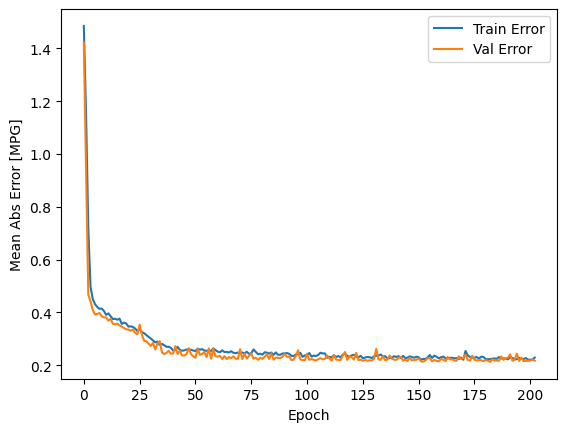

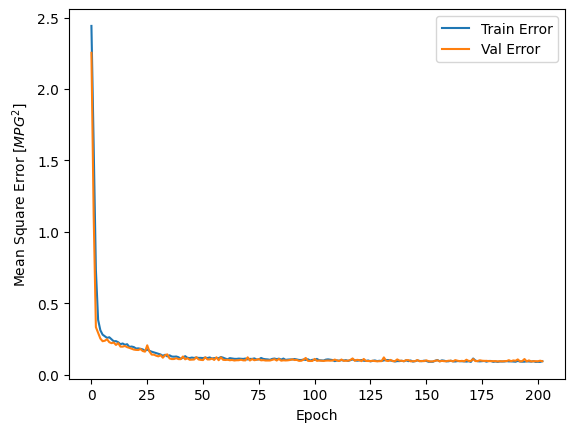

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Training RMSE FEH: 0.288
Training RMSE MGH: 1.773
Training R² FEH: 0.708
Training R² MGH: -19.609
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Training RMSE FEH: 0.283
Training RMSE MGH: 1.799
Training R² FEH: 0.726
Training R² MGH: -20.880
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training RMSE MGFE: 0.303
Training R² MGFE: 0.333
Test RMSE MGFE: 0.298
Test R² MGFE: 0.336
CPU times: user 2min 44s, sys: 52.5 s, total: 3min 36s
Wall time: 1min 42s


In [173]:
%%time
from tensorflow import keras

# Split the dataset into training and test sets
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Build a CNN model using Keras Sequential
def build_model_cnn():
    model = keras.Sequential([
        keras.layers.Reshape((6, 1), input_shape=(6,)),
        keras.layers.Conv1D(8, 3, activation=None, padding='same'),
        keras.layers.LeakyReLU(alpha=0.2),
        keras.layers.Conv1D(4, 3, activation=None, padding='same'),
        keras.layers.LeakyReLU(alpha=0.2),
        keras.layers.Conv1D(2, 3, activation=None, padding='same'),
        keras.layers.LeakyReLU(alpha=0.2),

        # Add Dropout after convolutional layers
        keras.layers.Dropout(0.2),

        # Dense layer after flatten
        keras.layers.Flatten(),
        keras.layers.Dense(32, activation=None),
        keras.layers.LeakyReLU(alpha=0.2),
        keras.layers.Dense(16, activation=None),
        keras.layers.LeakyReLU(alpha=0.2),
        keras.layers.Dense(8, activation=None),
        keras.layers.LeakyReLU(alpha=0.2),
        keras.layers.Dense(4, activation=None),
        keras.layers.LeakyReLU(alpha=0.2),

        # Output layer
        keras.layers.Dense(2)
    ])
    
    # compile a model
    optimizer = tf.keras.optimizers.Adam(0.001)
    model.compile(loss='mse',
                  optimizer=optimizer,
                  metrics=['mae', 'mse'])
    
    return model

model_cnn = build_model_cnn()
model_cnn.summary()

# Callback to print dot every 100 epochs
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs):
        if epoch % 100 == 0: print('')
        print('.', end='')

# Set the number of training epochs
EPOCHS = 500 #5000
# Early stopping if no improvement in validation loss for 50 epochs (patience)
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=50)

# Train the model using training data, with 20% for validation
history = model_cnn.fit(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']],
                    train_dataset[['FEH', 'MGH']],
                    epochs=EPOCHS, 
                    validation_split=0.2,
                    verbose=0,
                    callbacks=[early_stop, PrintDot()])
# Save training history
# model_cnn.save("model_cnn.h5")

# Plot training and validation MAE and MSE across epochs
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
print('\n', hist.tail())

def plot_history(history):
  hist = pd.DataFrame(history.history)
  hist['epoch'] = history.epoch

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Abs Error [MPG]')
  plt.plot(hist['epoch'], hist['mae'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mae'],
           label = 'Val Error')
  plt.legend()

  plt.figure()
  plt.xlabel('Epoch')
  plt.ylabel('Mean Square Error [$MPG^2$]')
  plt.plot(hist['epoch'], hist['mse'],
           label='Train Error')
  plt.plot(hist['epoch'], hist['val_mse'],
           label = 'Val Error')
  plt.legend()
  plt.show()

plot_history(history)

# Get predictions of training and test dataset
train_predictions = model_cnn.predict(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
train_dataset['FEH_phot_cnn'], train_dataset['MGH_phot_cnn'] = train_predictions[:, 0], train_predictions[:, 1]
train_dataset['MGFE_phot_cnn'] = train_dataset['MGH_phot_cnn'] - train_dataset['FEH_phot_cnn']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_cnn'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGFE_phot_cnn'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_cnn'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGFE_phot_cnn'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_predictions = model_cnn.predict(test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
test_dataset['FEH_phot_cnn'], test_dataset['MGH_phot_cnn'] = test_predictions[:, 0], test_predictions[:, 1]
test_dataset['MGFE_phot_cnn'] = test_dataset['MGH_phot_cnn'] - test_dataset['FEH_phot_cnn']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_cnn'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGFE_phot_cnn'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_cnn'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGFE_phot_cnn'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Get predictions of HSC samples
hsc_predictions = model_cnn.predict(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']])
hsc_df_mag['FEH_phot_cnn'], hsc_df_mag['MGH_phot_cnn'] = hsc_predictions[:, 0], hsc_predictions[:, 1]
hsc_df_mag['MGFE_phot_cnn'] = hsc_df_mag['MGH_phot_cnn'] - hsc_df_mag['FEH_phot_cnn']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_cnn'] - train_dataset['FEH_phot_cnn']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_cnn'] - train_dataset['FEH_phot_cnn']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_cnn'] - test_dataset['FEH_phot_cnn']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_cnn'] - test_dataset['FEH_phot_cnn']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


In [174]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

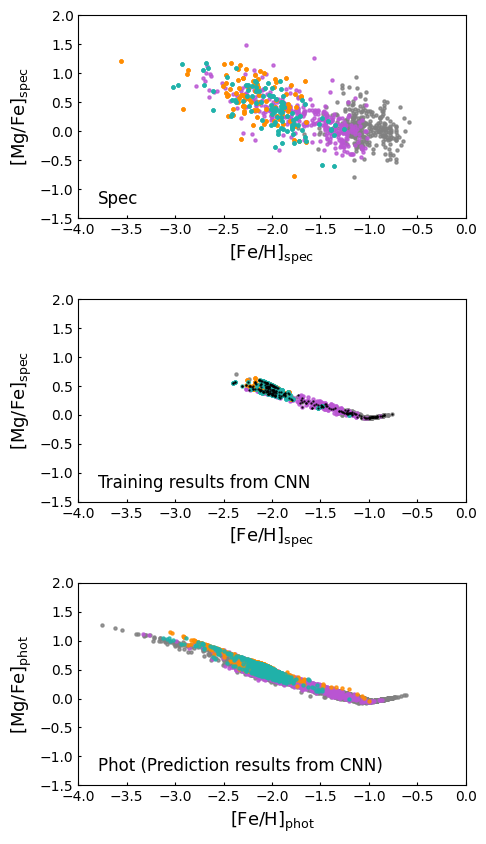

In [175]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_cnn'], train_fnx['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_cnn'], train_scl['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_cnn'], train_umi['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_cnn'], train_dra['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_cnn'], test_fnx['MGFE_phot_cnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_cnn'], test_scl['MGFE_phot_cnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_cnn'], test_umi['MGFE_phot_cnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_cnn'], test_dra['MGFE_phot_cnn'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from CNN', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_cnn'], hsc_fnx_mag['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_cnn'], hsc_scl_mag['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_cnn'], hsc_umi_mag['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_cnn'], hsc_dra_mag['MGFE_phot_cnn'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from CNN)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)


plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

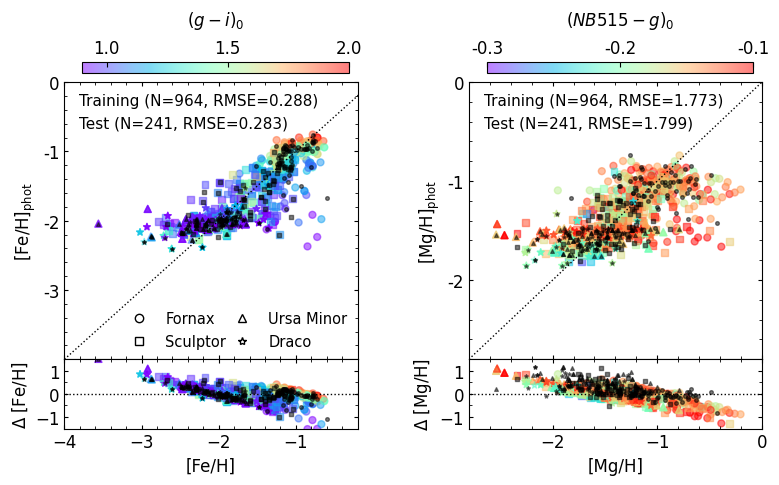

In [176]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_cnn'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_cnn'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_cnn'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_cnn'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_cnn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_cnn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_cnn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_cnn'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_cnn'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_cnn']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_cnn']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_cnn']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_cnn']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_cnn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_cnn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_cnn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_cnn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_cnn'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_cnn'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_cnn'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_cnn'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_cnn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_cnn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_cnn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_cnn'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_cnn'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_cnn']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_cnn']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_cnn']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_cnn']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_cnn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_cnn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_cnn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_cnn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

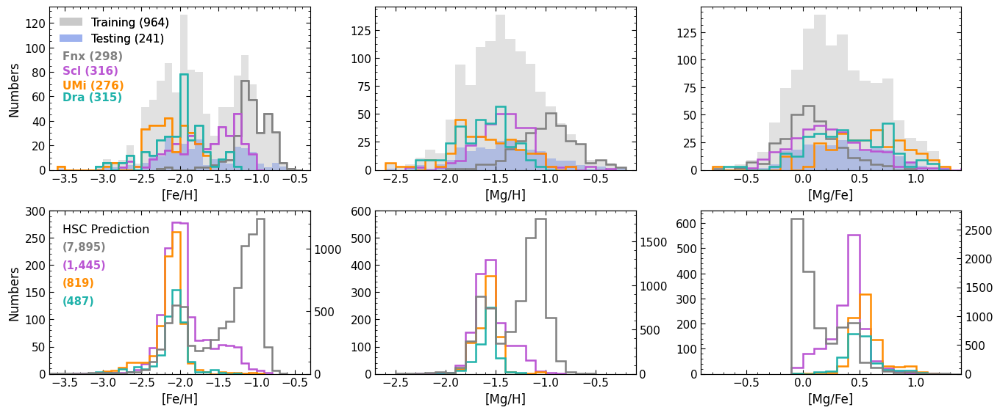

In [283]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_cnn'], [hsc_scl_mag['FEH_phot_cnn'], hsc_umi_mag['FEH_phot_cnn'], hsc_dra_mag['FEH_phot_cnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_cnn'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_cnn'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_cnn'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_cnn'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_cnn'], [hsc_scl_mag['MGH_phot_cnn'], hsc_umi_mag['MGH_phot_cnn'], hsc_dra_mag['MGH_phot_cnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 600])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_cnn'], [hsc_scl_mag['MGFE_phot_cnn'], hsc_umi_mag['MGFE_phot_cnn'], hsc_dra_mag['MGFE_phot_cnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 650])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [178]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_cnn']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_cnn']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_cnn']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_cnn']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_cnn']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_cnn']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_cnn']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_cnn']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_cnn']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_cnn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_cnn']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_cnn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_cnn']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_cnn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_cnn']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_cnn']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_cnn']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_cnn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_cnn']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_cnn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_cnn']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_cnn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_cnn']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_cnn']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.43 ± 0.47,-1.27 ± 0.26,0.15 ± 0.21
hsc_scl_mag,-1.93 ± 0.31,-1.54 ± 0.17,0.39 ± 0.17
hsc_umi_mag,-2.14 ± 0.23,-1.58 ± 0.11,0.56 ± 0.15
hsc_dra_mag,-2.10 ± 0.23,-1.59 ± 0.11,0.52 ± 0.15


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [179]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_cnn')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_cnn')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_cnn')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_cnn')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

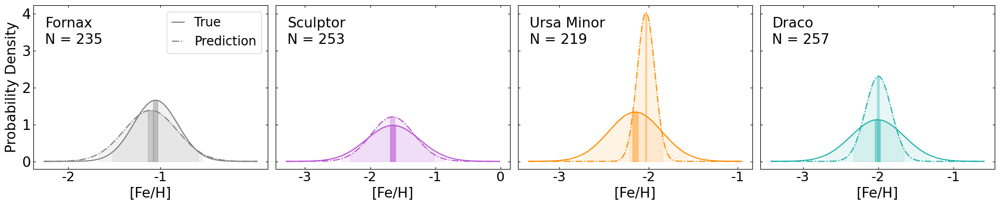

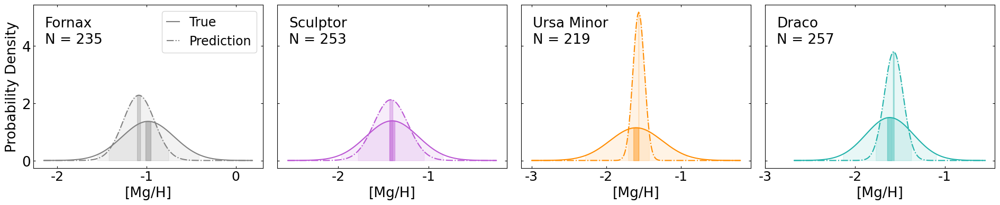

In [180]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_cnn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_cnn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

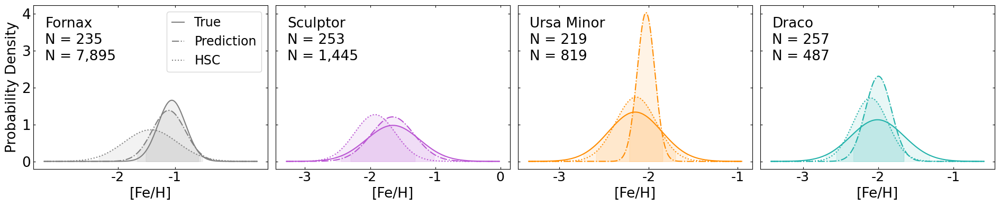

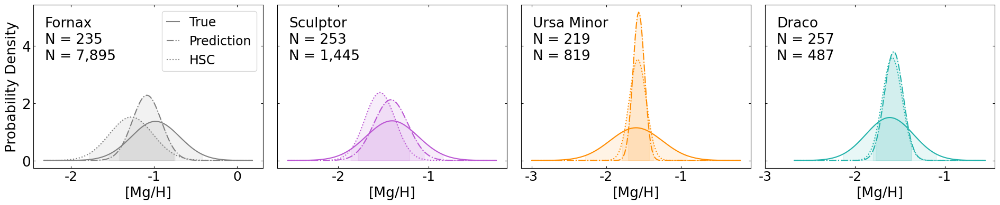

In [181]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_cnn'], hsc_df_mag['FEH_phot_cnn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_cnn'], hsc_df_mag['MGH_phot_cnn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [182]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_cnn')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_cnn')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_cnn')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_cnn')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0535069238205854, -1.9655071049350916)}
Galaxy for: {'bootstrap 95% CI': (-1.0853522085318072, -1.025482778780367)}
Galaxy scl: {'bootstrap 95% CI': (-1.698228098365157, -1.599200302016942)}
Galaxy umi: {'bootstrap 95% CI': (-2.1912839297461217, -2.114482414830407)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6425238101999444, -1.5816597132415795)}
Galaxy for: {'bootstrap 95% CI': (-1.0175527501825006, -0.9449717567924149)}
Galaxy scl: {'bootstrap 95% CI': (-1.4383885586886063, -1.3682068538755947)}
Galaxy umi: {'bootstrap 95% CI': (-1.646333400748468, -1.5576086715252884)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.018662524223328, -1.9750031769275664)}
Galaxy for: {'bootstrap 95% CI': (-1.1433456271886826, -1.0738529175519944)}
Galaxy scl: {'bootstrap 95% CI': (-1.6931082487106324, -1.6149223864078521)}
Galaxy umi:

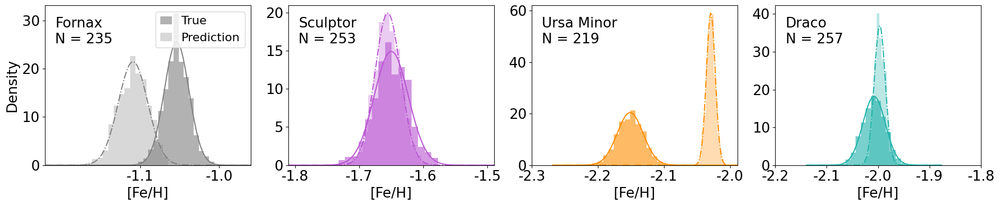

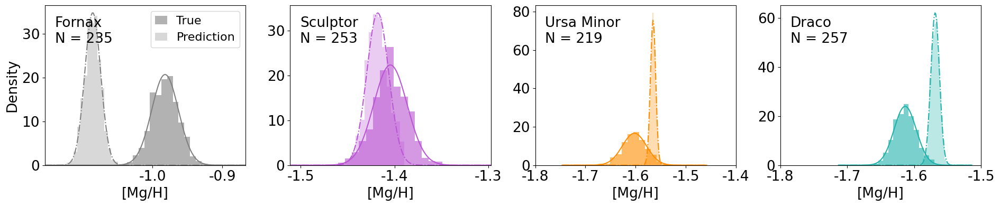

In [183]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_cnn', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_cnn', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [184]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_cnn')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_cnn')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.175, RMSE = 0.234, Relative Error % = 8.72%
Galaxy for: MAE = 0.178, RMSE = 0.259, Relative Error % = 16.83%
Galaxy scl: MAE = 0.226, RMSE = 0.302, Relative Error % = 13.57%
Galaxy umi: MAE = 0.232, RMSE = 0.328, Relative Error % = 10.71%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.205, RMSE = 0.263, Relative Error % = 12.26%
Galaxy for: MAE = 0.256, RMSE = 0.320, Relative Error % = 25.43%
Galaxy scl: MAE = 0.191, RMSE = 0.238, Relative Error % = 13.19%
Galaxy umi: MAE = 0.237, RMSE = 0.311, Relative Error % = 14.54%

Our FEH predictions are accurate to within 9-17% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 12-25% (95% confidence) across different galaxies.


# CNN try using Guiglion

In [190]:
%%time
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.layers import Input, Conv1D, LeakyReLU, Dropout, Flatten, Dense
from tensorflow.keras.models import Model
import tensorflow as tf
from sklearn.model_selection import train_test_split

# Data splitting
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Extract CNN input data and target data
X_train = train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_test = test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values

y_train = train_dataset[['FEH', 'MGH']].values
y_test = test_dataset[['FEH', 'MGH']].values

# Scaling CNN input data
scaler_X = StandardScaler()
X_train = scaler_X.fit_transform(X_train)
X_test = scaler_X.transform(X_test)

# Scaling target data
scaler_y = StandardScaler()
y_train = scaler_y.fit_transform(y_train)
y_test = scaler_y.transform(y_test)

# Reshape CNN input data
X_train = X_train.reshape(-1, 6, 1)
X_test = X_test.reshape(-1, 6, 1)

def build_model_cnn_guiglion():
    ipt = Input(shape=(6, 1), name="cnn_input")
    x = Conv1D(8, 3, padding='same', name='convol_1')(ipt)
    x = LeakyReLU()(x)
    x = Conv1D(4, 3, padding='same', name='convol_2')(x)
    x = LeakyReLU()(x)
    x = Conv1D(2, 3, padding='same', name='convol_3')(x)
    x = LeakyReLU()(x)
    x = Dropout(0.2)(x)
    x = Flatten()(x)
    x = Dense(32)(x)
    x = LeakyReLU()(x)

    # Additional Dense layer
    combined = Dense(16)(x)
    combined = LeakyReLU()(combined)

    # Output layer (FEH, MGH – 2 outputs)
    output = Dense(2, activation='linear', name="output_layer")(combined)

    # Model definition and compilation
    model = Model(inputs=ipt, outputs=output)
    optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
    model.compile(loss='mse', optimizer=optimizer, metrics=['mae', 'mse'])
    
    return model

# Make the model
model = build_model_cnn_guiglion()

# Train the model (using CNN input and target y_train)
history = model.fit(
    X_train,
    y_train,
    epochs=100,
    batch_size=32,
    validation_split=0.2,
    verbose=1
)

# Print model summary
model.summary()

# Make predictions for training and test data
train_predictions_scaled = model.predict(X_train)
train_predictions = scaler_y.inverse_transform(train_predictions_scaled)
train_dataset['FEH_phot_cnn_g'], train_dataset['MGH_phot_cnn_g'] = train_predictions[:, 0], train_predictions[:, 1]
train_dataset['MGFE_phot_cnn_g'] = train_dataset['MGH_phot_cnn_g'] - train_dataset['FEH_phot_cnn_g']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_cnn_g'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_cnn_g'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_cnn_g'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_cnn_g'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_predictions_scaled = model.predict(X_test)
test_predictions  = scaler_y.inverse_transform(test_predictions_scaled)
test_dataset['FEH_phot_cnn_g'], test_dataset['MGH_phot_cnn_g'] = test_predictions[:, 0], test_predictions[:, 1]
test_dataset['MGFE_phot_cnn_g'] = test_dataset['MGH_phot_cnn_g'] - test_dataset['FEH_phot_cnn_g']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_cnn_g'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_cnn_g'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_cnn_g'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_cnn_g'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Get the prediction of HSC (no need for hsc_input_phot, just hsc_input_cnn)
hsc_input_cnn = scaler_X.transform(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
hsc_input_cnn = np.array(hsc_input_cnn).reshape(-1, 6, 1)  # reshape for CNN input
hsc_predictions_scaled = model.predict(hsc_input_cnn)
hsc_predictions   = scaler_y.inverse_transform(hsc_predictions_scaled)
hsc_df_mag['FEH_phot_cnn_g'], hsc_df_mag['MGH_phot_cnn_g'] = hsc_predictions[:, 0], hsc_predictions[:, 1]
hsc_df_mag['MGFE_phot_cnn_g'] = hsc_df_mag['MGH_phot_cnn_g'] - hsc_df_mag['FEH_phot_cnn_g']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_cnn_g'] - train_dataset['FEH_phot_cnn_g']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_cnn_g'] - train_dataset['FEH_phot_cnn_g']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_cnn_g'] - test_dataset['FEH_phot_cnn_g']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_cnn_g'] - test_dataset['FEH_phot_cnn_g']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Epoch 1/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 3s 28ms/step - loss: 0.9566 - mae: 0.8029 - mse: 0.9566 - val_loss: 0.8274 - val_mae: 0.7144 - val_mse: 0.8274
Epoch 2/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step - loss: 0.7729 - mae: 0.7179 - mse: 0.7729 - val_loss: 0.6801 - val_mae: 0.6341 - val_mse: 0.6801
Epoch 3/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.7295 - mae: 0.6721 - mse: 0.7295 - val_loss: 0.6155 - val_mae: 0.6032 - val_mse: 0.6155
Epoch 4/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 1s 17ms/step - loss: 0.6444 - mae: 0.6284 - mse: 0.6444 - val_loss: 0.6019 - val_mae: 0.5952 - val_mse: 0.6019
Epoch 5/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6170 - mae: 0.6122 - mse: 0.6170 - val_loss: 0.5838 - val_mae: 0.5854 - val_mse: 0.5838
Epoch 6/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step - loss: 0.6009 - mae: 0.6016 - mse: 0.6009 - val_loss: 0.5733 - val_mae: 0.5805 - val_mse: 0.5733
Epoch 7/100
25/25 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step - loss: 0.5552 - mae: 0.5760 - mse: 0.5552 - val

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ cnn_input (InputLayer)          │ (None, 6, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convol_1 (Conv1D)               │ (None, 6, 8)           │            32 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 6, 8)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convol_2 (Conv1D)               │ (None, 6, 4)           │           100 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 6, 4)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ convol_3 (Conv1D)               │ (None, 6, 2)           │            26 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 6, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 6, 2)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 12)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 32)             │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 16)             │           528 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 2)              │            34 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,410 (13.32 KB)

 Trainable params: 1,136 (4.44 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,274 (8.89 KB)

31/31 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Training RMSE FEH: 0.271
Training RMSE MGH: 0.281
Training R² FEH: 0.743
Training R² MGH: 0.483
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
Training RMSE FEH: 0.259
Training RMSE MGH: 0.268
Training R² FEH: 0.769
Training R² MGH: 0.513
333/333 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
Training RMSE MGFE: 0.293
Training R² MGFE: 0.376
Test RMSE MGFE: 0.287
Test R² MGFE: 0.385
CPU times: user 1min 20s, sys: 26 s, total: 1min 46s
Wall time: 54.6 s


In [191]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

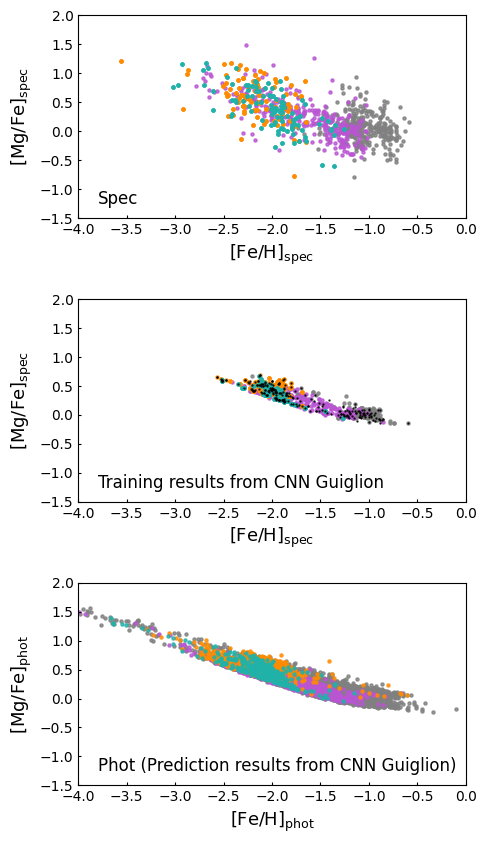

In [192]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_cnn_g'], train_fnx['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_cnn_g'], train_scl['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_cnn_g'], train_umi['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_cnn_g'], train_dra['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_cnn_g'], test_fnx['MGFE_phot_cnn_g'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_cnn_g'], test_scl['MGFE_phot_cnn_g'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_cnn_g'], test_umi['MGFE_phot_cnn_g'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_cnn_g'], test_dra['MGFE_phot_cnn_g'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from CNN Guiglion', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_cnn_g'], hsc_fnx_mag['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_cnn_g'], hsc_scl_mag['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_cnn_g'], hsc_umi_mag['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_cnn_g'], hsc_dra_mag['MGFE_phot_cnn_g'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from CNN Guiglion)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.savefig('feh_mgfe_spec_train_test_phot.png', bbox_inches='tight')

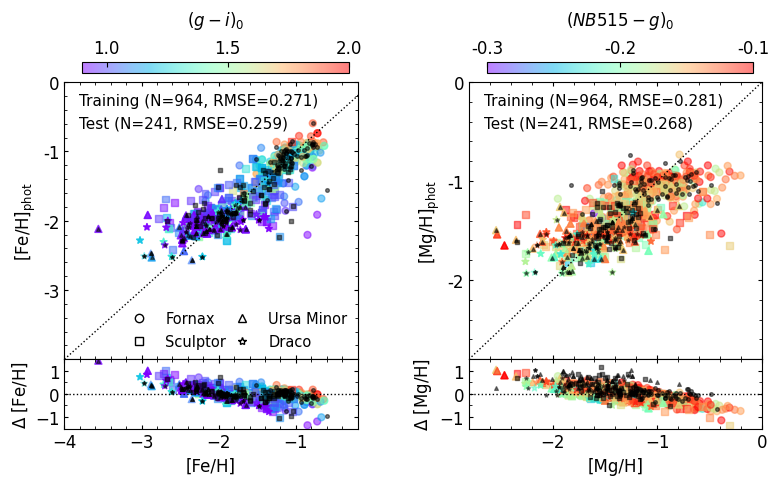

In [193]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_cnn_g'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_cnn_g'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_cnn_g'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_cnn_g'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_cnn_g'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_cnn_g']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_cnn_g']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_cnn_g']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_cnn_g']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_cnn_g']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_cnn_g']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_cnn_g']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_cnn_g']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_cnn_g'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_cnn_g'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_cnn_g'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_cnn_g'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_cnn_g'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_cnn_g'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_cnn_g']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_cnn_g']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_cnn_g']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_cnn_g']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_cnn_g']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_cnn_g']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_cnn_g']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_cnn_g']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.savefig('compare_train_test_pred.png', bbox_inches='tight')

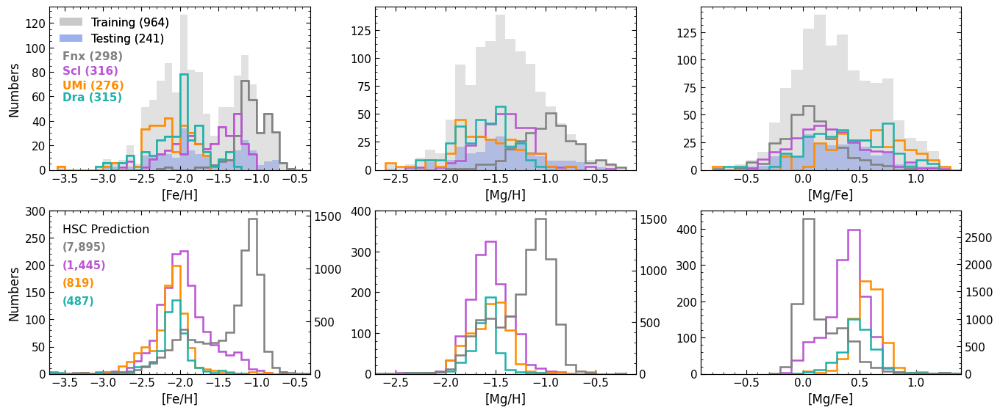

In [194]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_cnn_g'], [hsc_scl_mag['FEH_phot_cnn_g'], hsc_umi_mag['FEH_phot_cnn_g'], hsc_dra_mag['FEH_phot_cnn_g']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_cnn_g'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_cnn_g'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_cnn_g'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_cnn_g'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_cnn_g'], [hsc_scl_mag['MGH_phot_cnn_g'], hsc_umi_mag['MGH_phot_cnn_g'], hsc_dra_mag['MGH_phot_cnn_g']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_cnn_g'], [hsc_scl_mag['MGFE_phot_cnn_g'], hsc_umi_mag['MGFE_phot_cnn_g'], hsc_dra_mag['MGFE_phot_cnn_g']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.savefig('feh_mgh_mgfe_distribution.png', bbox_inches='tight')

In [195]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_cnn_g']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_cnn_g']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_cnn_g']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_cnn_g']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_cnn_g']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_cnn_g']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_cnn_g']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_cnn_g']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_cnn_g']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_cnn_g']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_cnn_g']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_cnn_g']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_cnn_g']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_cnn_g']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_cnn_g']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_cnn_g']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.40 ± 0.47,-1.24 ± 0.29,0.16 ± 0.21
hsc_scl_mag,-1.94 ± 0.35,-1.56 ± 0.20,0.39 ± 0.18
hsc_umi_mag,-2.14 ± 0.28,-1.56 ± 0.21,0.57 ± 0.14
hsc_dra_mag,-2.11 ± 0.28,-1.62 ± 0.15,0.50 ± 0.18


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [196]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_cnn_g')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_cnn_g')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_cnn_g')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_cnn_g')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

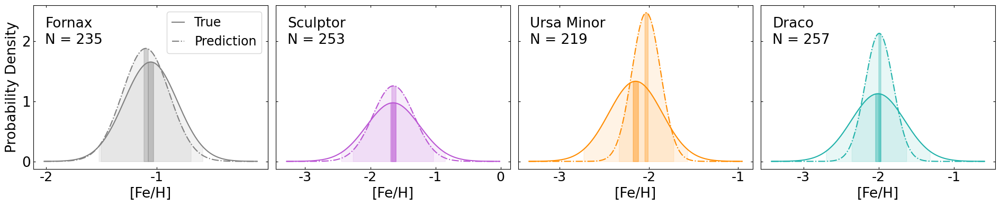

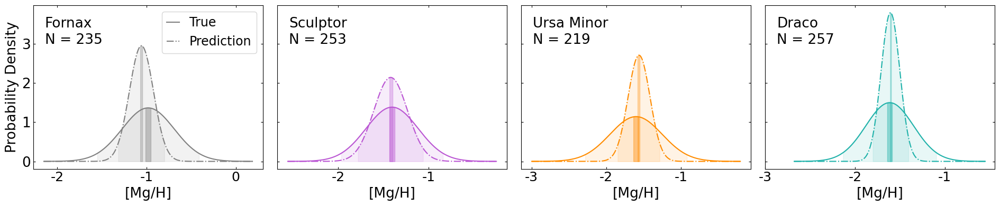

In [197]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_cnn_g'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_cnn_g'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

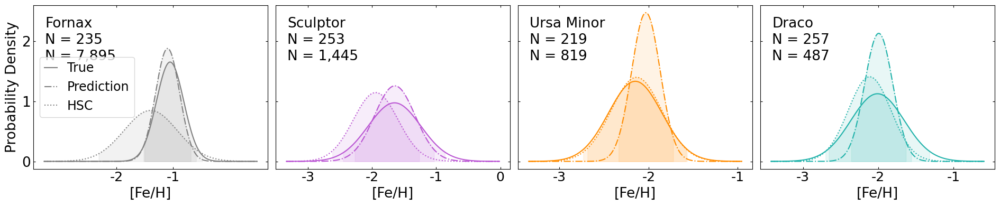

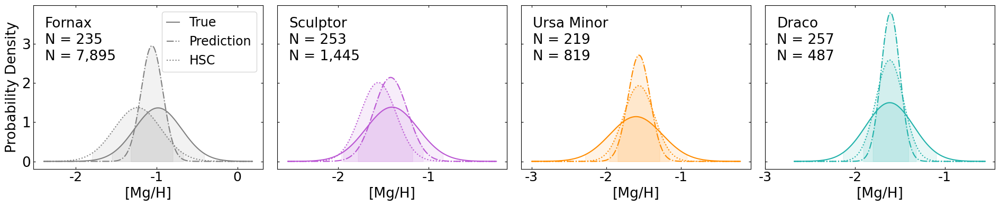

In [198]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_cnn_g'], hsc_df_mag['FEH_phot_cnn_g'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_cnn_g'], hsc_df_mag['MGH_phot_cnn_g'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [199]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_cnn_g')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_cnn_g')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_cnn_g')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_cnn_g')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0554072124547824, -1.9667326025535872)}
Galaxy for: {'bootstrap 95% CI': (-1.0853639646008233, -1.022795070684276)}
Galaxy scl: {'bootstrap 95% CI': (-1.700611951241083, -1.6036742263820447)}
Galaxy umi: {'bootstrap 95% CI': (-2.1868291198153575, -2.1091159807749227)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6466042270670802, -1.5811623457821715)}
Galaxy for: {'bootstrap 95% CI': (-1.0195152220781014, -0.9428840322596019)}
Galaxy scl: {'bootstrap 95% CI': (-1.4394635095826056, -1.3672697590524607)}
Galaxy umi: {'bootstrap 95% CI': (-1.6467577113562994, -1.5607182496476308)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.0159707188606264, -1.9702979743480682)}
Galaxy for: {'bootstrap 95% CI': (-1.1252411305904388, -1.072775089740753)}
Galaxy scl: {'bootstrap 95% CI': (-1.6801241248846055, -1.6044626742601396)}
Galaxy u

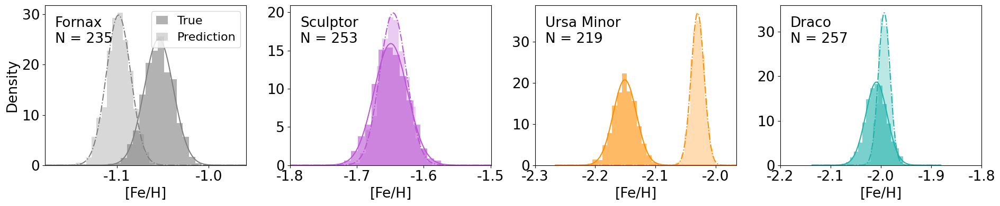

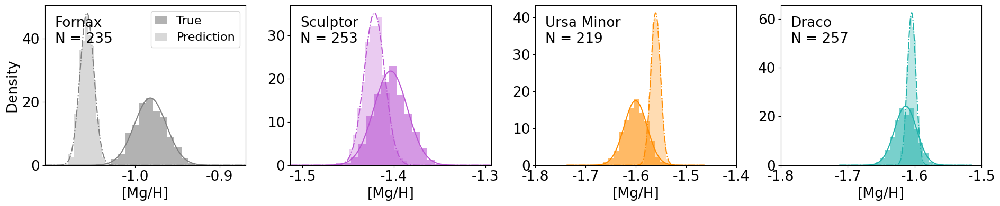

In [200]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_cnn_g', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_cnn_g', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [201]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_cnn_g')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_cnn_g')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.146, RMSE = 0.201, Relative Error % = 7.29%
Galaxy for: MAE = 0.153, RMSE = 0.219, Relative Error % = 14.40%
Galaxy scl: MAE = 0.221, RMSE = 0.311, Relative Error % = 13.23%
Galaxy umi: MAE = 0.199, RMSE = 0.290, Relative Error % = 9.19%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.194, RMSE = 0.247, Relative Error % = 11.57%
Galaxy for: MAE = 0.235, RMSE = 0.288, Relative Error % = 23.39%
Galaxy scl: MAE = 0.176, RMSE = 0.233, Relative Error % = 12.12%
Galaxy umi: MAE = 0.220, RMSE = 0.302, Relative Error % = 13.51%

Our FEH predictions are accurate to within 7-14% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 12-23% (95% confidence) across different galaxies.


# RNN (Recurrent Neural Network)

/afs/crc.nd.edu/user/j/jhong5/.local/lib/python3.9/site-packages/keras/src/layers/reshaping/reshape.py:39: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ reshape_4 (Reshape)             │ (None, 6, 1)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ (None, 6, 64)          │        16,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_10 (LSTM)                  │ (None, 6, 128)         │        98,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_11 (LSTM)                  │ (None, 256)            │       394,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 512)            │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 256)            │       131,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 128)            │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 32)             │         2,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 2)              │            66 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 816,162 (3.11 MB)

 Trainable params: 816,162 (3.11 MB)

 Non-trainable params: 0 (0.00 B)


....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................
....................................................................................................

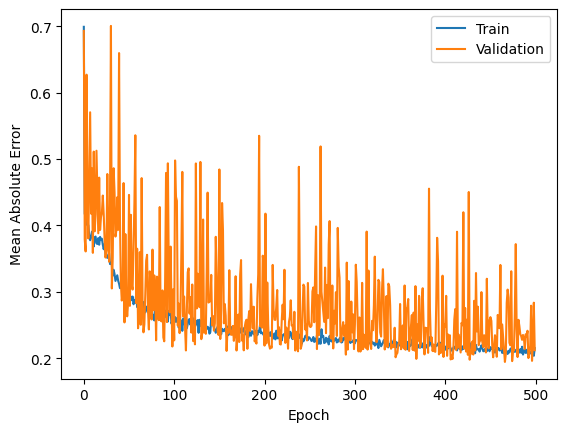

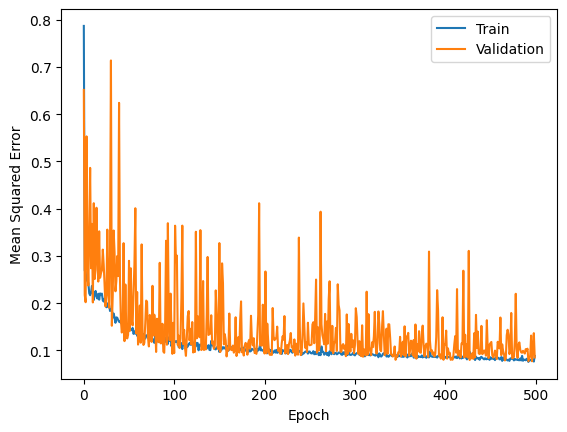

31/31 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step
Training RMSE FEH: 0.281
Training RMSE MGH: 0.287
Training R² FEH: 0.722
Training R² MGH: 0.460
8/8 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Test RMSE FEH: 0.279
Test RMSE MGH: 0.291
Test R² FEH: 0.734
Test R² MGH: 0.428
333/333 ━━━━━━━━━━━━━━━━━━━━ 14s 42ms/step
Training RMSE MGFE: 0.284
Training R² MGFE: 0.412
Test RMSE MGFE: 0.290
Test R² MGFE: 0.369
CPU times: user 2h 7min 21s, sys: 13min 30s, total: 2h 20min 52s
Wall time: 21min 44s


In [202]:
%%time

# Split train/test data
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Split train/validation data
features = ['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']
targets  = ['FEH', 'MGH']
x_train, x_val, y_train, y_val = train_test_split(
    train_dataset[features], train_dataset[targets],
    test_size=0.2, random_state=42
)

# Build the RNN model
def build_model_rnn():
    model = keras.Sequential([
        keras.layers.Reshape((6, 1), input_shape=(6,)),
        keras.layers.LSTM(64, return_sequences=True),
        keras.layers.LSTM(128, return_sequences=True),
        keras.layers.LSTM(256),
        keras.layers.Dense(512, activation='relu'),
        keras.layers.Dense(256, activation='relu'),
        keras.layers.Dense(128, activation='relu'),
        keras.layers.Dense(64, activation='relu'),
        keras.layers.Dense(32, activation='relu'),
        keras.layers.Dense(2)
    ])
    optimizer = tf.keras.optimizers.RMSprop(learning_rate=1e-3)
    model.compile(
        loss='mse',
        optimizer=optimizer,
        metrics=['mae','mse']
    )
    return model

# Model summary
model_rnn = build_model_rnn()
model_rnn.summary()

# Custom callback to print a dot every epoch
class PrintDot(keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        if epoch % 100 == 0:
            print()
        print('.', end='')

EPOCHS = 500 #5000
early_stop = keras.callbacks.EarlyStopping(monitor='val_loss', patience=500)

# Train the model
history = model_rnn.fit(
    x_train.values, y_train.values,
    epochs=EPOCHS,
    validation_data=(x_val.values, y_val.values),
    verbose=0,
    callbacks=[early_stop, PrintDot()]
)

# 모델 저장
# model_rnn.save("model_rnn.h5")

# Plot training history (MAE and MSE)
def plot_history(hist):
    df = pd.DataFrame(hist.history)
    df['epoch'] = hist.epoch

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Absolute Error')
    plt.plot(df['epoch'], df['mae'],  label='Train')
    plt.plot(df['epoch'], df['val_mae'], label='Validation')
    plt.legend()

    plt.figure()
    plt.xlabel('Epoch')
    plt.ylabel('Mean Squared Error')
    plt.plot(df['epoch'], df['mse'],      label='Train')
    plt.plot(df['epoch'], df['val_mse'],  label='Validation')
    plt.legend()
    plt.show()

plot_history(history)

# Get predictions of training and test dataset
train_preds = model_rnn.predict(train_dataset[features].values)
train_dataset['FEH_phot_rnn'], train_dataset['MGH_phot_rnn'] = train_preds[:,0], train_preds[:,1]
train_dataset['MGFE_phot_rnn'] = train_dataset['MGH_phot_rnn'] - train_dataset['FEH_phot_rnn']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'], train_dataset['FEH_phot_rnn']))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'], train_dataset['MGH_phot_rnn']))
train_FEH_r2   = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_rnn'])
train_MGH_r2   = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_rnn'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}')
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}')
print(f'Training R² FEH: {train_FEH_r2:.3f}')
print(f'Training R² MGH: {train_MGH_r2:.3f}')

test_preds = model_rnn.predict(test_dataset[features].values)
test_dataset['FEH_phot_rnn'], test_dataset['MGH_phot_rnn'] = test_preds[:,0], test_preds[:,1]
test_dataset['MGFE_phot_rnn'] = test_dataset['MGH_phot_rnn'] - test_dataset['FEH_phot_rnn']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'], test_dataset['FEH_phot_rnn']))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'], test_dataset['MGH_phot_rnn']))
test_FEH_r2   = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_rnn'])
test_MGH_r2   = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_rnn'])
print(f'Test RMSE FEH: {test_FEH_rmse:.3f}')
print(f'Test RMSE MGH: {test_MGH_rmse:.3f}')
print(f'Test R² FEH: {test_FEH_r2:.3f}')
print(f'Test R² MGH: {test_MGH_r2:.3f}')

# Get predictions of HSC samples
hsc_preds = model_rnn.predict(hsc_df_mag[features].values)
hsc_df_mag['FEH_phot_rnn'], hsc_df_mag['MGH_phot_rnn'] = hsc_preds[:,0], hsc_preds[:,1]
hsc_df_mag['MGFE_phot_rnn'] = hsc_df_mag['MGH_phot_rnn'] - hsc_df_mag['FEH_phot_rnn']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_rnn'] - train_dataset['FEH_phot_rnn']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_rnn'] - train_dataset['FEH_phot_rnn']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_rnn'] - test_dataset['FEH_phot_rnn']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_rnn'] - test_dataset['FEH_phot_rnn']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


In [206]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

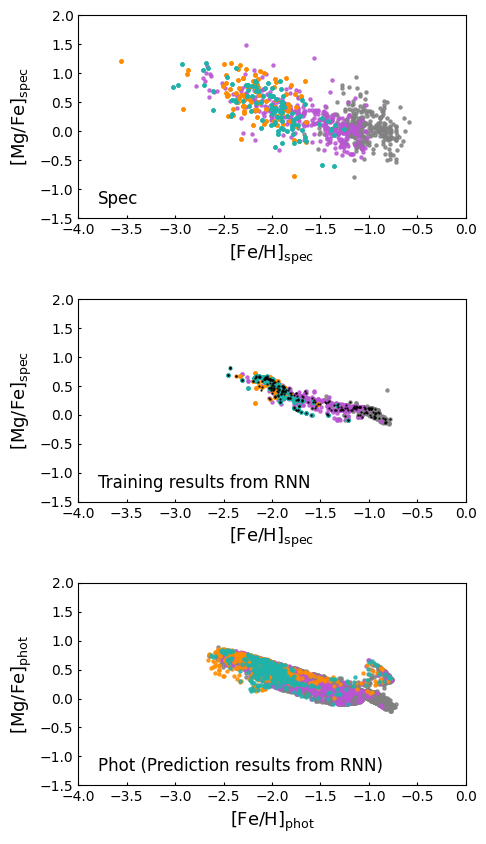

In [207]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_rnn'], train_fnx['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_rnn'], train_scl['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_rnn'], train_umi['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_rnn'], train_dra['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_rnn'], test_fnx['MGFE_phot_rnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_rnn'], test_scl['MGFE_phot_rnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_rnn'], test_umi['MGFE_phot_rnn'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_rnn'], test_dra['MGFE_phot_rnn'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from RNN', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_rnn'], hsc_fnx_mag['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_rnn'], hsc_scl_mag['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_rnn'], hsc_umi_mag['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_rnn'], hsc_dra_mag['MGFE_phot_rnn'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from RNN)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

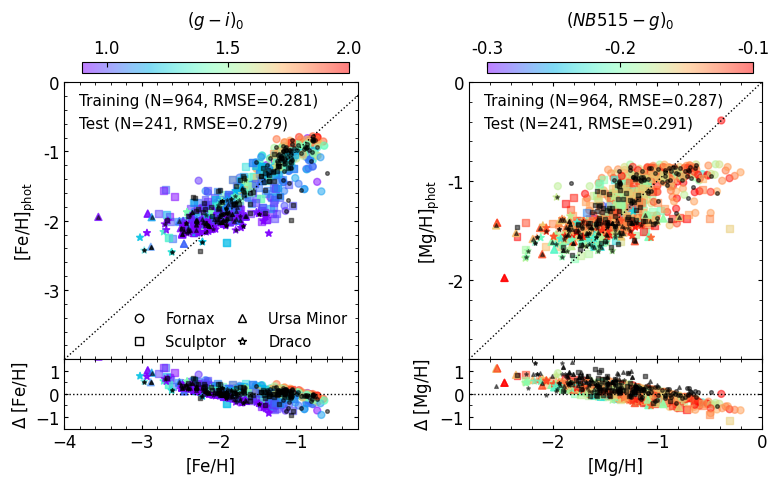

In [208]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_rnn'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_rnn'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_rnn'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_rnn'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_rnn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_rnn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_rnn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_rnn'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_rnn'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_rnn']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_rnn']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_rnn']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_rnn']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_rnn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_rnn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_rnn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_rnn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_rnn'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_rnn'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_rnn'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_rnn'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_rnn'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_rnn'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_rnn'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_rnn'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_rnn'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_rnn']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_rnn']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_rnn']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_rnn']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_rnn']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_rnn']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_rnn']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_rnn']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

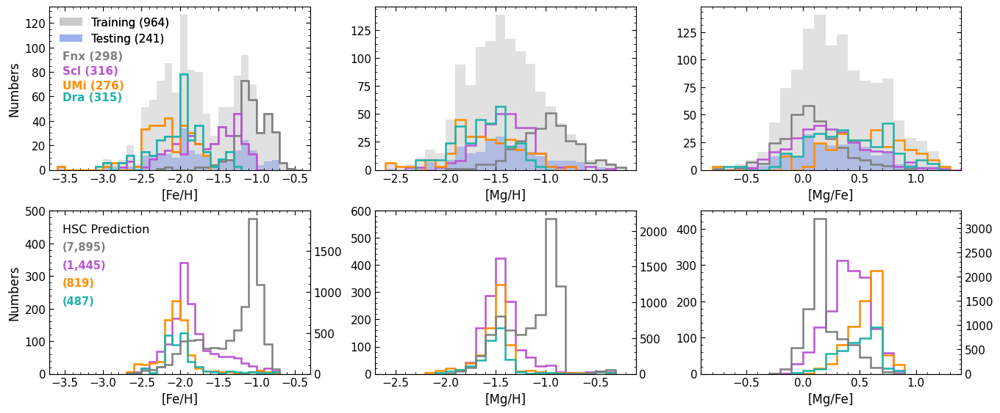

In [210]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_rnn'], [hsc_scl_mag['FEH_phot_rnn'], hsc_umi_mag['FEH_phot_rnn'], hsc_dra_mag['FEH_phot_rnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 500])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_rnn'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_rnn'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_rnn'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_rnn'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_rnn'], [hsc_scl_mag['MGH_phot_rnn'], hsc_umi_mag['MGH_phot_rnn'], hsc_dra_mag['MGH_phot_rnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 600])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_rnn'], [hsc_scl_mag['MGFE_phot_rnn'], hsc_umi_mag['MGFE_phot_rnn'], hsc_dra_mag['MGFE_phot_rnn']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [211]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_rnn']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_rnn']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_rnn']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_rnn']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_rnn']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_rnn']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_rnn']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_rnn']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_rnn']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_rnn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_rnn']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_rnn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_rnn']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_rnn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_rnn']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_rnn']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_rnn']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_rnn']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_rnn']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_rnn']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_rnn']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_rnn']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_rnn']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_rnn']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.33 ± 0.39,-1.13 ± 0.27,0.19 ± 0.17
hsc_scl_mag,-1.82 ± 0.33,-1.42 ± 0.22,0.40 ± 0.18
hsc_umi_mag,-2.04 ± 0.28,-1.48 ± 0.23,0.55 ± 0.14
hsc_dra_mag,-1.97 ± 0.30,-1.49 ± 0.25,0.49 ± 0.18


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [212]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_rnn')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_rnn')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_rnn')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_rnn')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

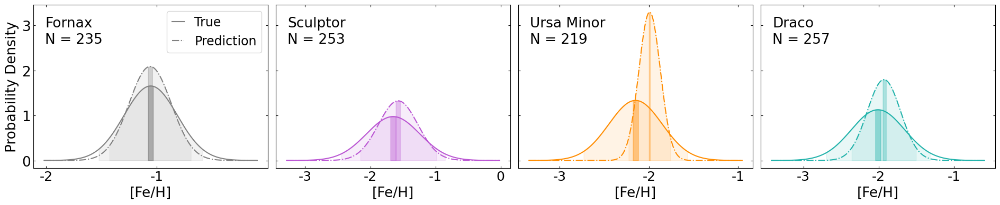

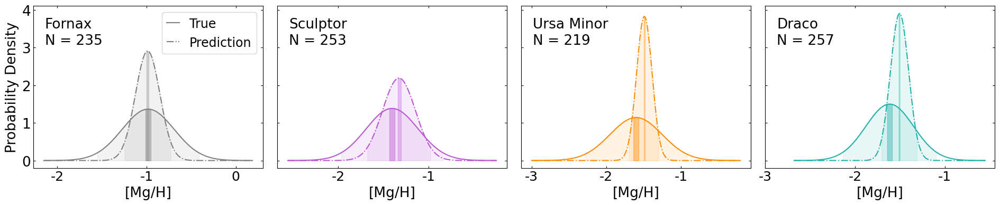

In [213]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_rnn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_rnn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

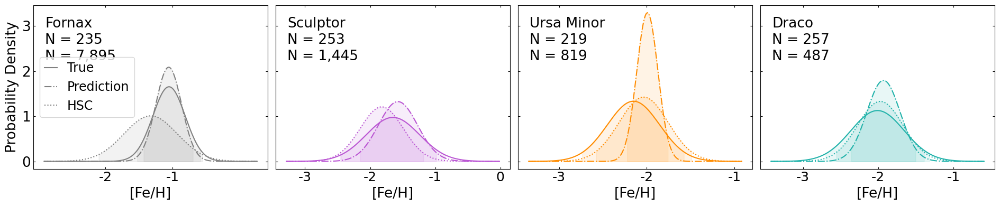

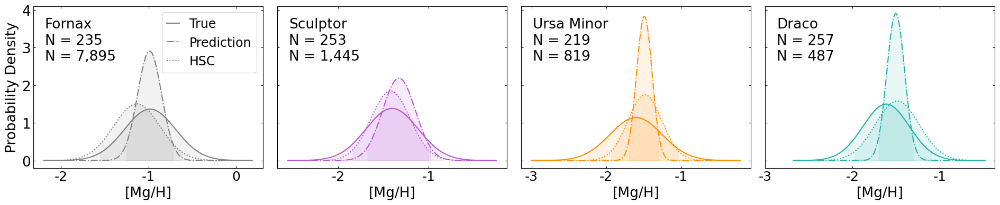

In [214]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_rnn'], hsc_df_mag['FEH_phot_rnn'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_rnn'], hsc_df_mag['MGH_phot_rnn'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [215]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_rnn')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_rnn')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_rnn')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_rnn')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0532602752755986, -1.9646492550497696)}
Galaxy for: {'bootstrap 95% CI': (-1.0844299835824056, -1.024634740197073)}
Galaxy scl: {'bootstrap 95% CI': (-1.7056908211101962, -1.5996083806216868)}
Galaxy umi: {'bootstrap 95% CI': (-2.1931855546502974, -2.1109705904635696)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6471382791092823, -1.5824988034725507)}
Galaxy for: {'bootstrap 95% CI': (-1.0190793266432907, -0.9460023965312898)}
Galaxy scl: {'bootstrap 95% CI': (-1.4384140233669402, -1.370337573878238)}
Galaxy umi: {'bootstrap 95% CI': (-1.644617997037478, -1.5551152528979588)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-1.956756341457367, -1.9020817220211028)}
Galaxy for: {'bootstrap 95% CI': (-1.0826195448637008, -1.0336180806159974)}
Galaxy scl: {'bootstrap 95% CI': (-1.6074979096651076, -1.5376570701599122)}
Galaxy um

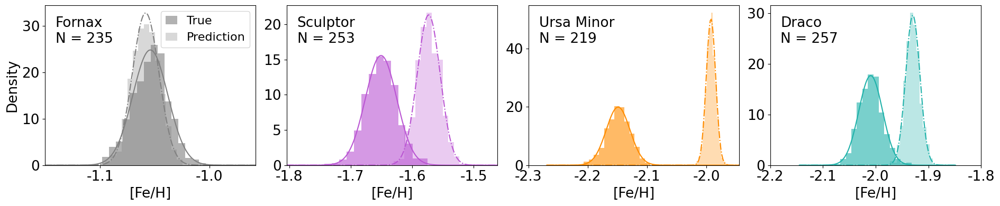

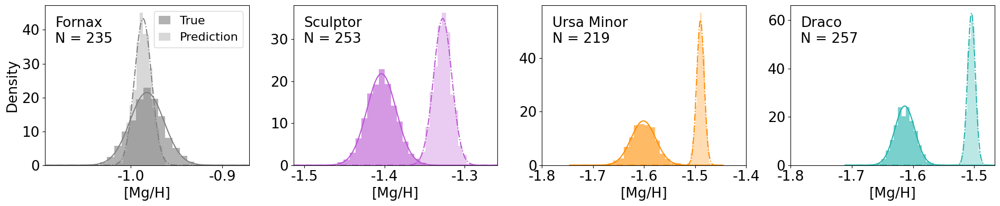

In [216]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_rnn', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_rnn', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [217]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_rnn')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_rnn')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.174, RMSE = 0.233, Relative Error % = 8.67%
Galaxy for: MAE = 0.161, RMSE = 0.225, Relative Error % = 15.23%
Galaxy scl: MAE = 0.218, RMSE = 0.301, Relative Error % = 13.09%
Galaxy umi: MAE = 0.236, RMSE = 0.342, Relative Error % = 10.87%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.230, RMSE = 0.298, Relative Error % = 13.76%
Galaxy for: MAE = 0.224, RMSE = 0.279, Relative Error % = 22.32%
Galaxy scl: MAE = 0.209, RMSE = 0.254, Relative Error % = 14.45%
Galaxy umi: MAE = 0.259, RMSE = 0.332, Relative Error % = 15.89%

Our FEH predictions are accurate to within 9-15% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 14-22% (95% confidence) across different galaxies.


# KPCA (multivariate linear regression by Wu19) w/ RF

In [218]:
%%time
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.multioutput import MultiOutputRegressor
from sklearn.ensemble import RandomForestRegressor

# Split the data into training and testing sets
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Save the original features (6 features)
X_train_orig = train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_test_orig = test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values

# Save the targets (FEH, MGH)
y_train = train_dataset[['FEH', 'MGH']].values
y_test = test_dataset[['FEH', 'MGH']].values

# Scale the target values (FEH, MGH)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train)   
y_test_scaled = scaler_y.transform(y_test)

# Kernel PCA hyperparameters grid
param_grid = {
    'gamma': [0.1, 1, 10, 50, 100],
    'n_components': [2, 3, 5, 10],
    'kernel': ['rbf', 'poly']
}

best_score = -999
best_params = None
best_kpca = None

# Explore hyperparameter
for gamma in param_grid['gamma']:
    for nc in param_grid['n_components']:
        for krn in param_grid['kernel']:
            kpca = KernelPCA(kernel=krn, gamma=gamma, n_components=nc)
            
            # (a) transform training sample
            X_train_trans = kpca.fit_transform(X_train_orig)
            
            # (b) Learn RandomForest model (using y_train_scaled)
            rf = RandomForestRegressor(n_estimators=500, random_state=42)
            multi_rf = MultiOutputRegressor(rf)
            multi_rf.fit(X_train_trans, y_train_scaled)
            
            # (c) save the R^2 score of training set
            score = multi_rf.score(X_train_trans, y_train_scaled)
            
            if score > best_score:
                best_score = score
                best_params = (gamma, nc, krn)
                best_kpca = kpca

print("Best params:", best_params)  # e.g. (50, 10, 'poly')
print("Best score:", best_score)

# Final training: transform the original data using the best Kernel PCA
X_train_final = best_kpca.transform(X_train_orig)
X_test_final = best_kpca.transform(X_test_orig)

# Learn again the final model 
rf_final = RandomForestRegressor(n_estimators=500, random_state=42)
multi_rf_final = MultiOutputRegressor(rf_final)
multi_rf_final.fit(X_train_final, y_train_scaled)  # 학습 시 y_train_scaled 사용

# Get the predictions (get the scaled y prediction)
pred_train_scaled = multi_rf_final.predict(X_train_final)
pred_test_scaled  = multi_rf_final.predict(X_test_final)

# Take an inverse transform to get the actual FEH, MGH
pred_train = scaler_y.inverse_transform(pred_train_scaled)
pred_test  = scaler_y.inverse_transform(pred_test_scaled)

# Add the prediction to datagram
train_dataset['FEH_phot_kpca'], train_dataset['MGH_phot_kpca'] = pred_train[:, 0], pred_train[:, 1]
train_dataset['MGFE_phot_kpca'] = train_dataset['MGH_phot_kpca'] - train_dataset['FEH_phot_kpca']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_kpca'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_kpca'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_kpca'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_kpca'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_dataset['FEH_phot_kpca'], test_dataset['MGH_phot_kpca'] = pred_test[:, 0], pred_test[:, 1]
test_dataset['MGFE_phot_kpca'] = test_dataset['MGH_phot_kpca'] - test_dataset['FEH_phot_kpca']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_kpca'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_kpca'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_kpca'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_kpca'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Get the HSC prediction
X_hsc_orig = hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_hsc_kpca = best_kpca.transform(X_hsc_orig)
hsc_pred_scaled = multi_rf_final.predict(X_hsc_kpca)
hsc_pred = scaler_y.inverse_transform(hsc_pred_scaled)

hsc_df_mag['FEH_phot_kpca'], hsc_df_mag['MGH_phot_kpca'] = hsc_pred[:, 0], hsc_pred[:, 1]
hsc_df_mag['MGFE_phot_kpca'] = hsc_df_mag['MGH_phot_kpca'] - hsc_df_mag['FEH_phot_kpca']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_kpca'] - train_dataset['FEH_phot_kpca']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_kpca'] - train_dataset['FEH_phot_kpca']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_kpca'] - test_dataset['FEH_phot_kpca']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_kpca'] - test_dataset['FEH_phot_kpca']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Best params: (1, 10, 'poly')
Best score: 0.9438841442262839
Training RMSE FEH: 0.062
Training RMSE MGH: 0.123
Training R² FEH: 0.987
Training R² MGH: 0.901
Training RMSE FEH: 0.200
Training RMSE MGH: 0.212
Training R² FEH: 0.863
Training R² MGH: 0.695
Training RMSE MGFE: 0.122
Training R² MGFE: 0.891
Test RMSE MGFE: 0.239
Test R² MGFE: 0.570
CPU times: user 5min 3s, sys: 0 ns, total: 5min 3s
Wall time: 5min 4s


In [219]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

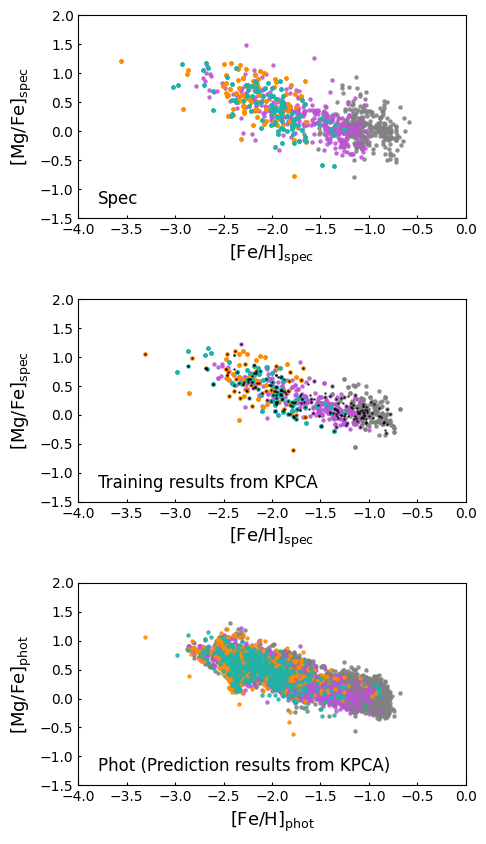

In [220]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_kpca'], train_fnx['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_kpca'], train_scl['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_kpca'], train_umi['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_kpca'], train_dra['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_kpca'], test_fnx['MGFE_phot_kpca'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_kpca'], test_scl['MGFE_phot_kpca'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_kpca'], test_umi['MGFE_phot_kpca'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_kpca'], test_dra['MGFE_phot_kpca'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from KPCA', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_kpca'], hsc_fnx_mag['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_kpca'], hsc_scl_mag['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_kpca'], hsc_umi_mag['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_kpca'], hsc_dra_mag['MGFE_phot_kpca'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from KPCA)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

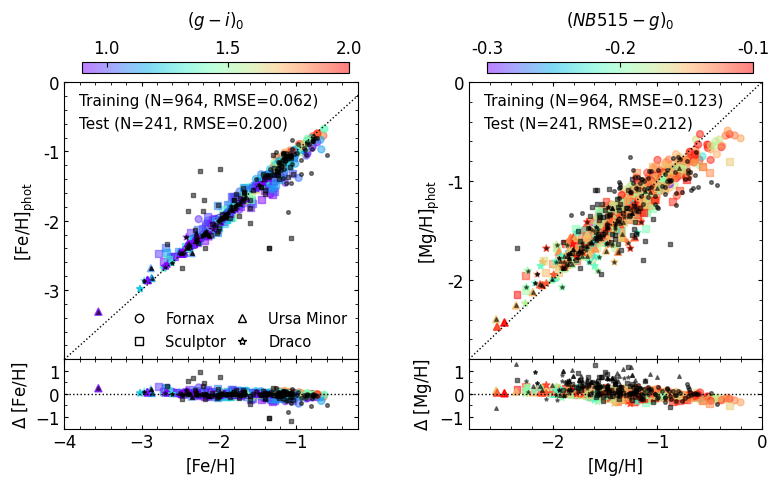

In [221]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_kpca'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_kpca'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_kpca'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_kpca'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_kpca'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_kpca'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_kpca'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_kpca'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_kpca'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_kpca']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_kpca']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_kpca']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_kpca']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_kpca']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_kpca']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_kpca']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_kpca']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_kpca'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_kpca'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_kpca'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_kpca'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_kpca'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_kpca'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_kpca'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_kpca'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_kpca'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_kpca']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_kpca']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_kpca']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_kpca']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_kpca']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_kpca']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_kpca']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_kpca']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

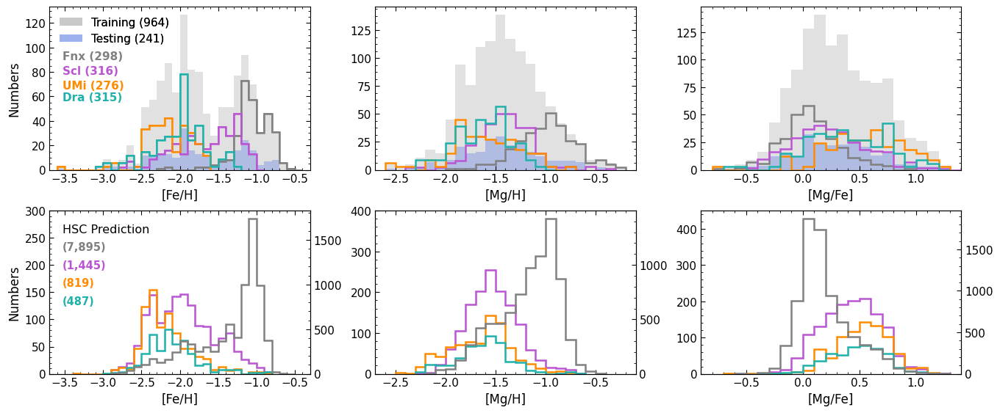

In [222]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_kpca'], [hsc_scl_mag['FEH_phot_kpca'], hsc_umi_mag['FEH_phot_kpca'], hsc_dra_mag['FEH_phot_kpca']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_kpca'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_kpca'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_kpca'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_kpca'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_kpca'], [hsc_scl_mag['MGH_phot_kpca'], hsc_umi_mag['MGH_phot_kpca'], hsc_dra_mag['MGH_phot_kpca']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_kpca'], [hsc_scl_mag['MGFE_phot_kpca'], hsc_umi_mag['MGFE_phot_kpca'], hsc_dra_mag['MGFE_phot_kpca']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [223]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_kpca']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_kpca']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_kpca']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_kpca']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_kpca']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_kpca']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_kpca']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_kpca']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_kpca']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_kpca']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_kpca']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_kpca']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_kpca']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_kpca']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_kpca']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_kpca']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_kpca']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_kpca']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_kpca']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_kpca']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_kpca']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_kpca']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_kpca']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_kpca']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.37 ± 0.45,-1.18 ± 0.29,0.19 ± 0.23
hsc_scl_mag,-1.95 ± 0.41,-1.53 ± 0.25,0.42 ± 0.25
hsc_umi_mag,-2.18 ± 0.32,-1.65 ± 0.30,0.53 ± 0.23
hsc_dra_mag,-2.10 ± 0.33,-1.62 ± 0.26,0.48 ± 0.24


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [224]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_kpca')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_kpca')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_kpca')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_kpca')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

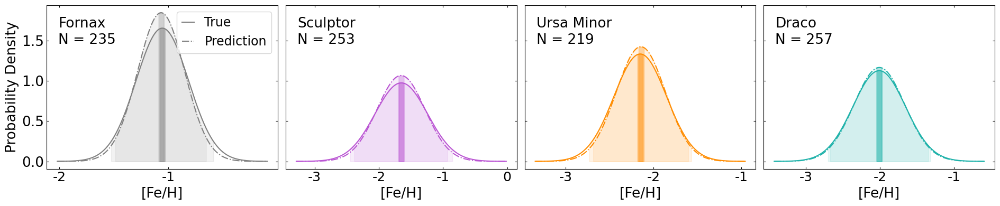

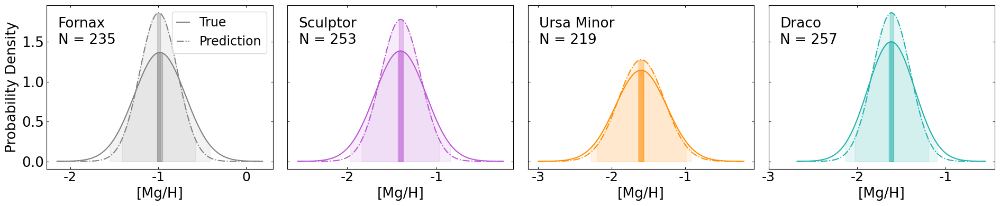

In [225]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_kpca'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_kpca'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

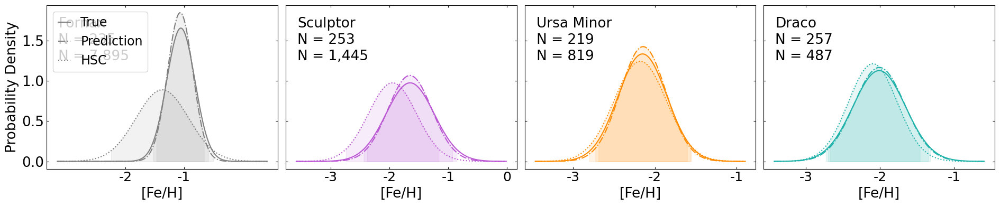

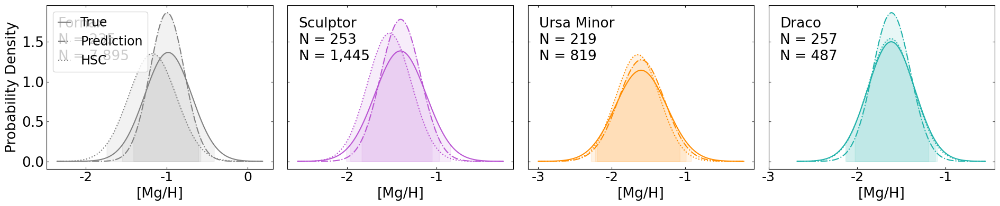

In [226]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_kpca'], hsc_df_mag['FEH_phot_kpca'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_kpca'], hsc_df_mag['MGH_phot_kpca'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [227]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_kpca')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_kpca')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_kpca')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_kpca')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0531855439805606, -1.9651255105745349)}
Galaxy for: {'bootstrap 95% CI': (-1.0856465186131388, -1.0243785343374294)}
Galaxy scl: {'bootstrap 95% CI': (-1.7002348129861848, -1.5995122422705692)}
Galaxy umi: {'bootstrap 95% CI': (-2.1863261956552904, -2.111935490455117)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6436169049066374, -1.58071182405154)}
Galaxy for: {'bootstrap 95% CI': (-1.022860122016834, -0.944052789296263)}
Galaxy scl: {'bootstrap 95% CI': (-1.4414196765053853, -1.3675718483607575)}
Galaxy umi: {'bootstrap 95% CI': (-1.64414679048752, -1.5576616108303432)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.0503589539600315, -1.966673402398955)}
Galaxy for: {'bootstrap 95% CI': (-1.0940872021371895, -1.0393687545284225)}
Galaxy scl: {'bootstrap 95% CI': (-1.7005220046041825, -1.6077754061493992)}
Galaxy umi: {

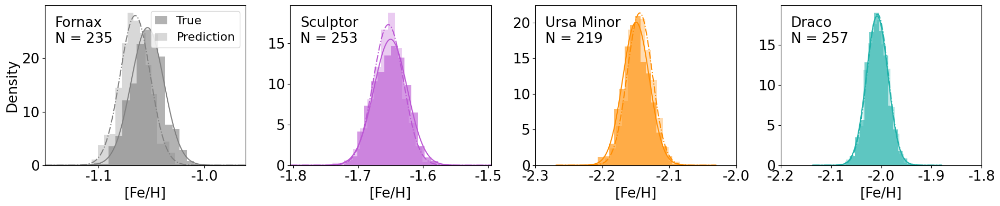

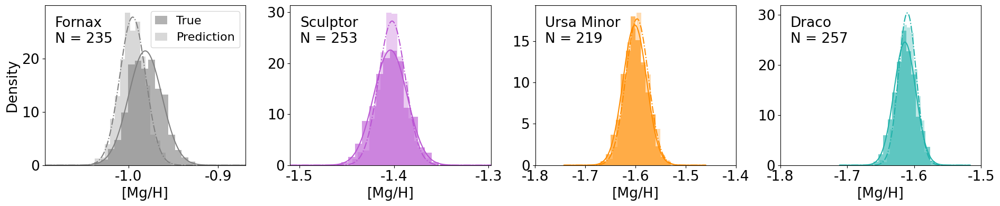

In [228]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_kpca', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_kpca', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [229]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_kpca')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_kpca')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.022, RMSE = 0.044, Relative Error % = 1.12%
Galaxy for: MAE = 0.112, RMSE = 0.178, Relative Error % = 10.58%
Galaxy scl: MAE = 0.207, RMSE = 0.340, Relative Error % = 12.42%
Galaxy umi: MAE = 0.036, RMSE = 0.064, Relative Error % = 1.67%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.145, RMSE = 0.182, Relative Error % = 8.67%
Galaxy for: MAE = 0.208, RMSE = 0.252, Relative Error % = 20.69%
Galaxy scl: MAE = 0.201, RMSE = 0.262, Relative Error % = 13.85%
Galaxy umi: MAE = 0.073, RMSE = 0.103, Relative Error % = 4.48%

Our FEH predictions are accurate to within 1-12% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 4-21% (95% confidence) across different galaxies.


# KPCA + linear

In [230]:
%%time
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import KernelPCA
from sklearn.multioutput import MultiOutputRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Split the data into training and testing sets
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Save the original features (4 features)
X_train_orig = train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_test_orig = test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values

# Save the targets (FEH, MGH)
y_train = train_dataset[['FEH', 'MGH']].values
y_test = test_dataset[['FEH', 'MGH']].values

# Scale the target values (FEH, MGH)
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train)   # Fit scaler on training targets
y_test_scaled = scaler_y.transform(y_test)           # Transform testing targets

# Kernel PCA hyperparameters grid
param_grid = {
    'gamma': [0.1, 1, 10, 50, 100],
    'n_components': [2, 3, 5, 10],
    'kernel': ['rbf', 'poly']
}

best_score = -999
best_params = None
best_kpca = None

# Explore hyperparameter grid
for gamma in param_grid['gamma']:
    for nc in param_grid['n_components']:
        for krn in param_grid['kernel']:
            kpca = KernelPCA(kernel=krn, gamma=gamma, n_components=nc)
            
            # (a) Transform training features
            X_train_trans = kpca.fit_transform(X_train_orig)
            
            # (b) Learn Multi-Output Linear Regression model (using scaled targets)
            lr = LinearRegression()
            multi_lr = MultiOutputRegressor(lr)
            multi_lr.fit(X_train_trans, y_train_scaled)
            
            # (c) Save the R^2 score of training set
            score = multi_lr.score(X_train_trans, y_train_scaled)
            
            if score > best_score:
                best_score = score
                best_params = (gamma, nc, krn)
                best_kpca = kpca

print("Best params:", best_params)  # 예: (50, 10, 'poly')
print("Best score:", best_score)

# Final training: transform the original data using the best Kernel PCA
X_train_final = best_kpca.transform(X_train_orig)
X_test_final = best_kpca.transform(X_test_orig)

# Learn the final model using Multi-Output Linear Regression
lr_final = LinearRegression()
multi_lr_final = MultiOutputRegressor(lr_final)
multi_lr_final.fit(X_train_final, y_train_scaled)  # 학습 시 scaled target 사용

# Get the predictions (scaled)
pred_train_scaled = multi_lr_final.predict(X_train_final)
pred_test_scaled  = multi_lr_final.predict(X_test_final)

# Inverse transform the predictions to get actual FEH, MGH values
pred_train = scaler_y.inverse_transform(pred_train_scaled)
pred_test  = scaler_y.inverse_transform(pred_test_scaled)

# Add the predictions to the dataframes
train_dataset['FEH_phot_kpca_lr'] = pred_train[:, 0]
train_dataset['MGH_phot_kpca_lr'] = pred_train[:, 1]
train_dataset['MGFE_phot_kpca_lr'] = train_dataset['MGH_phot_kpca_lr'] - train_dataset['FEH_phot_kpca_lr']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_kpca_lr'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_kpca_lr'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_kpca_lr'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_kpca_lr'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_dataset['FEH_phot_kpca_lr'] = pred_test[:, 0]
test_dataset['MGH_phot_kpca_lr'] = pred_test[:, 1]
test_dataset['MGFE_phot_kpca_lr'] = test_dataset['MGH_phot_kpca_lr'] - test_dataset['FEH_phot_kpca_lr']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_kpca_lr'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_kpca_lr'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_kpca_lr'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_kpca_lr'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Get the HSC prediction using the same best Kernel PCA transformation and the final model
X_hsc_orig = hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_hsc_kpca = best_kpca.transform(X_hsc_orig)
hsc_pred_scaled = multi_lr_final.predict(X_hsc_kpca)
hsc_pred = scaler_y.inverse_transform(hsc_pred_scaled)

hsc_df_mag['FEH_phot_kpca_lr'] = hsc_pred[:, 0]
hsc_df_mag['MGH_phot_kpca_lr'] = hsc_pred[:, 1]
hsc_df_mag['MGFE_phot_kpca_lr'] = hsc_df_mag['MGH_phot_kpca_lr'] - hsc_df_mag['FEH_phot_kpca_lr']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_kpca_lr'] - train_dataset['FEH_phot_kpca_lr']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_kpca_lr'] - train_dataset['FEH_phot_kpca_lr']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_kpca_lr'] - test_dataset['FEH_phot_kpca_lr']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_kpca_lr'] - test_dataset['FEH_phot_kpca_lr']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Best params: (0.1, 10, 'poly')
Best score: 0.5641614890988401
Training RMSE FEH: 0.298
Training RMSE MGH: 0.292
Training R² FEH: 0.688
Training R² MGH: 0.441
Training RMSE FEH: 0.286
Training RMSE MGH: 0.282
Training R² FEH: 0.719
Training R² MGH: 0.462
Training RMSE MGFE: 0.302
Training R² MGFE: 0.335
Test RMSE MGFE: 0.302
Test R² MGFE: 0.316
CPU times: user 5.67 s, sys: 0 ns, total: 5.67 s
Wall time: 5.85 s


In [231]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

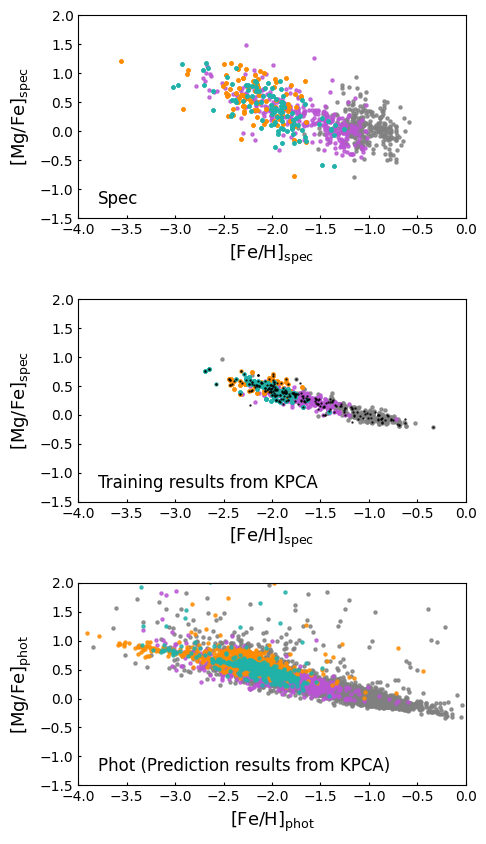

In [232]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_kpca_lr'], train_fnx['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_kpca_lr'], train_scl['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_kpca_lr'], train_umi['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_kpca_lr'], train_dra['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_kpca_lr'], test_fnx['MGFE_phot_kpca_lr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_kpca_lr'], test_scl['MGFE_phot_kpca_lr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_kpca_lr'], test_umi['MGFE_phot_kpca_lr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_kpca_lr'], test_dra['MGFE_phot_kpca_lr'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from KPCA', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_kpca_lr'], hsc_fnx_mag['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_kpca_lr'], hsc_scl_mag['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_kpca_lr'], hsc_umi_mag['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_kpca_lr'], hsc_dra_mag['MGFE_phot_kpca_lr'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from KPCA)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

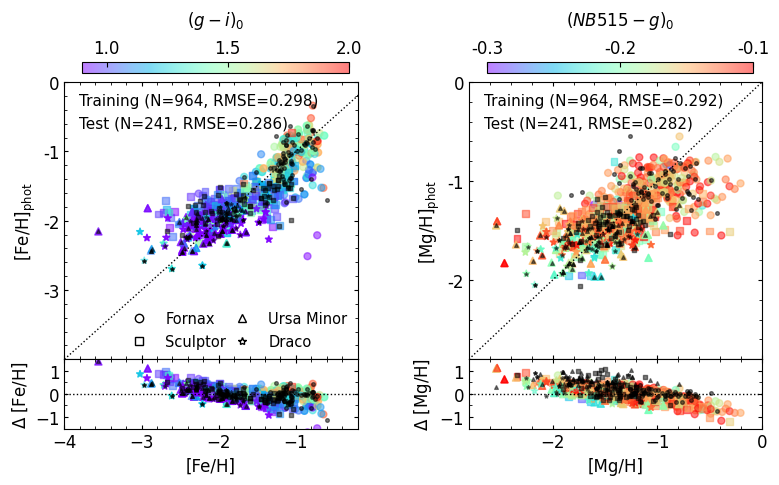

In [233]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_kpca_lr'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_kpca_lr'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_kpca_lr'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_kpca_lr'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_kpca_lr'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_kpca_lr']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_kpca_lr']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_kpca_lr']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_kpca_lr']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_kpca_lr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_kpca_lr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_kpca_lr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_kpca_lr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_kpca_lr'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_kpca_lr'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_kpca_lr'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_kpca_lr'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_kpca_lr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['MGH'], test_FEH['MGH_phot_kpca_lr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_kpca_lr']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_kpca_lr']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_kpca_lr']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_kpca_lr']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_kpca_lr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_kpca_lr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_kpca_lr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_kpca_lr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

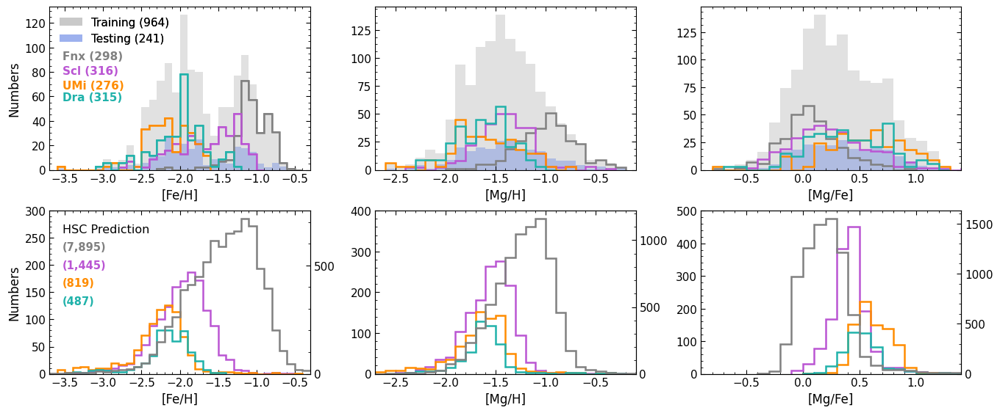

In [282]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_kpca_lr'], [hsc_scl_mag['FEH_phot_kpca_lr'], hsc_umi_mag['FEH_phot_kpca_lr'], hsc_dra_mag['FEH_phot_kpca_lr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_kpca_lr'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_kpca_lr'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_kpca_lr'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_kpca_lr'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_kpca_lr'], [hsc_scl_mag['MGH_phot_kpca_lr'], hsc_umi_mag['MGH_phot_kpca_lr'], hsc_dra_mag['MGH_phot_kpca_lr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_kpca_lr'], [hsc_scl_mag['MGFE_phot_kpca_lr'], hsc_umi_mag['MGFE_phot_kpca_lr'], hsc_dra_mag['MGFE_phot_kpca_lr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 500])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [235]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_kpca_lr']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_kpca_lr']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_kpca_lr']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_kpca_lr']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_kpca_lr']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_kpca_lr']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_kpca_lr']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_kpca_lr']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_kpca_lr']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_kpca_lr']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_kpca_lr']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_kpca_lr']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_kpca_lr']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_kpca_lr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_kpca_lr']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_kpca_lr']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df


,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.45 ± 0.50,-1.21 ± 0.37,0.24 ± 0.46
hsc_scl_mag,-1.98 ± 0.37,-1.55 ± 0.27,0.43 ± 0.31
hsc_umi_mag,-2.29 ± 0.39,-1.65 ± 0.33,0.64 ± 0.23
hsc_dra_mag,-2.19 ± 0.38,-1.59 ± 0.32,0.60 ± 0.49


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [236]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_kpca_lr')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_kpca_lr')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_kpca_lr')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_kpca_lr')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

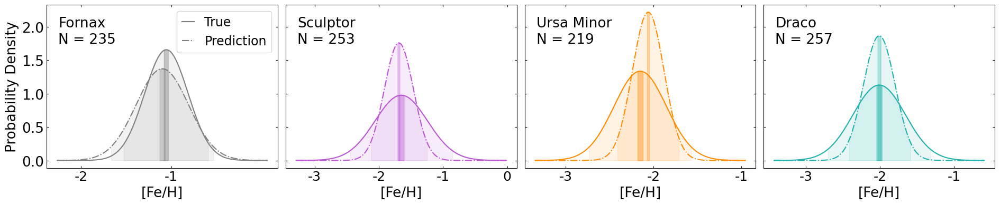

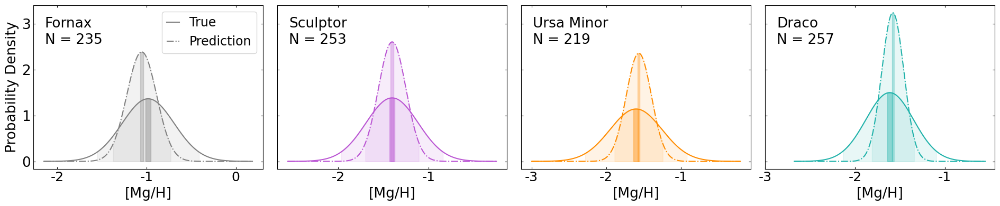

In [237]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_kpca_lr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_kpca_lr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

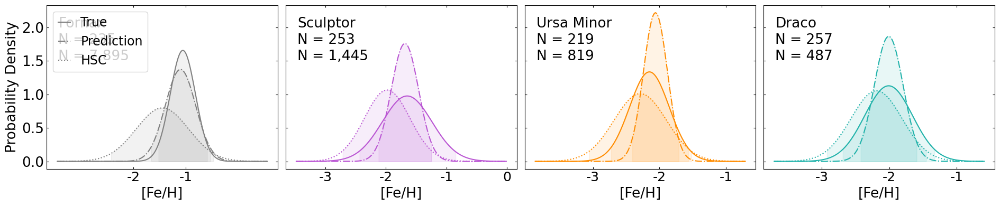

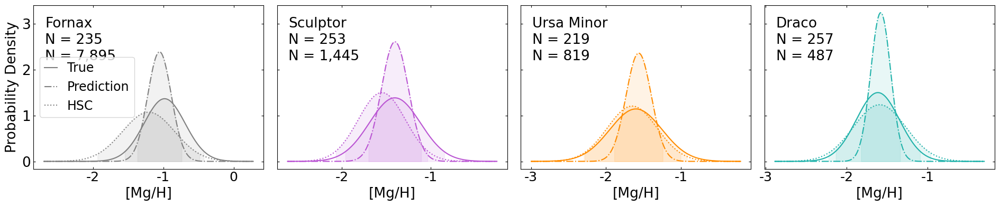

In [238]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_kpca_lr'], hsc_df_mag['FEH_phot_kpca_lr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_kpca_lr'], hsc_df_mag['MGH_phot_kpca_lr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [239]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_kpca_lr')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_kpca_lr')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_kpca_lr')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_kpca_lr')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0528069424873787, -1.9665261263555973)}
Galaxy for: {'bootstrap 95% CI': (-1.0823427727683264, -1.0229536654471538)}
Galaxy scl: {'bootstrap 95% CI': (-1.7012474883058935, -1.6005119380372854)}
Galaxy umi: {'bootstrap 95% CI': (-2.192813418746152, -2.111459190088363)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6451552713110524, -1.5808521989939144)}
Galaxy for: {'bootstrap 95% CI': (-1.0196819636472672, -0.944612239054688)}
Galaxy scl: {'bootstrap 95% CI': (-1.4391257851250965, -1.3708712762107473)}
Galaxy umi: {'bootstrap 95% CI': (-1.6489859704009562, -1.5542258491873038)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.032751517232057, -1.9824640623321468)}
Galaxy for: {'bootstrap 95% CI': (-1.1371695700313524, -1.0623344138544153)}
Galaxy scl: {'bootstrap 95% CI': (-1.7138636639073925, -1.660735711800822)}
Galaxy umi

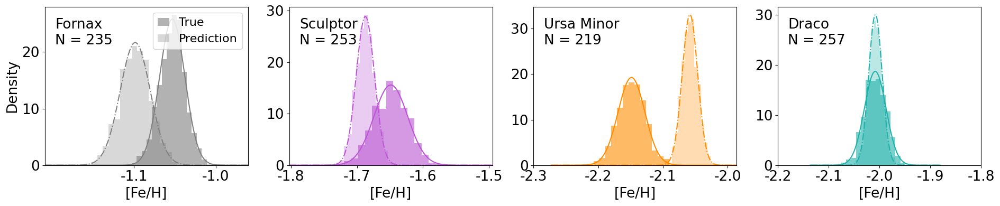

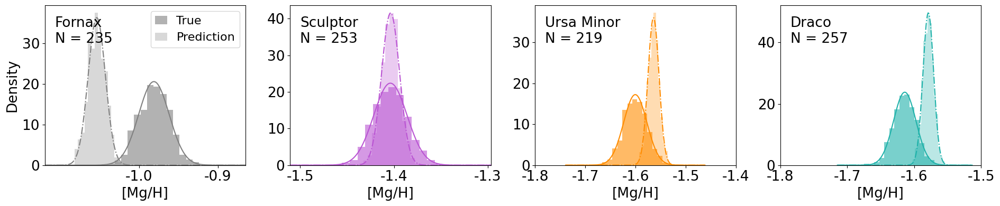

In [240]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_kpca_lr', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_kpca_lr', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [241]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_kpca_lr')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_kpca_lr')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.162, RMSE = 0.216, Relative Error % = 8.09%
Galaxy for: MAE = 0.195, RMSE = 0.277, Relative Error % = 18.42%
Galaxy scl: MAE = 0.265, RMSE = 0.330, Relative Error % = 15.92%
Galaxy umi: MAE = 0.223, RMSE = 0.306, Relative Error % = 10.29%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.196, RMSE = 0.248, Relative Error % = 11.72%
Galaxy for: MAE = 0.247, RMSE = 0.325, Relative Error % = 24.52%
Galaxy scl: MAE = 0.186, RMSE = 0.238, Relative Error % = 12.83%
Galaxy umi: MAE = 0.227, RMSE = 0.308, Relative Error % = 13.96%

Our FEH predictions are accurate to within 8-18% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 12-25% (95% confidence) across different galaxies.


# Uniform Manifold Approximation and Project (UMAP)

In [242]:
%%time
import umap
import warnings
warnings.filterwarnings("ignore")

# Split the dataset into training and testing sets
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)

# Extract input features and target values for training and testing
X_train = train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_test = test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
y_train = train_dataset[['FEH', 'MGH']].values
y_test = test_dataset[['FEH', 'MGH']].values

# Apply UMAP to reduce feature dimensions to 5 for training data
umap_reducer = umap.UMAP(n_components=5, random_state=42)

# Transform test data using the same UMAP reducer
X_train_umap = umap_reducer.fit_transform(X_train)
X_test_umap = umap_reducer.transform(X_test)

# Define and configure the Random Forest regressor model
model = RandomForestRegressor(
    n_estimators = 500,
    min_samples_leaf = 3,
    max_features = 0.5, 
    max_samples = 0.4,
    oob_score = True,
    random_state = 42
    )
    
# Train the model on UMAP-transformed training data
model.fit(X_train_umap, y_train)

# Predict target values for training and testing data
train_pred = model.predict(X_train_umap)
train_dataset = train_dataset.copy()
train_dataset['FEH_phot_umap'] = train_pred[:, 0]
train_dataset['MGH_phot_umap'] = train_pred[:, 1]
train_dataset['MGFE_phot_umap'] = train_dataset['MGH_phot_umap'] - train_dataset['FEH_phot_umap']

train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'], train_dataset['FEH_phot_umap']))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'], train_dataset['MGH_phot_umap']))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_umap'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_umap'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}')
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}')
print(f'Training R² FEH: {train_FEH_r2:.3f}')
print(f'Training R² MGH: {train_MGH_r2:.3f}')

test_pred  = model.predict(X_test_umap)
test_dataset = test_dataset.copy()
test_dataset['FEH_phot_umap'] = test_pred[:, 0]
test_dataset['MGH_phot_umap'] = test_pred[:, 1]
test_dataset['MGFE_phot_umap'] = test_dataset['MGH_phot_umap'] - test_dataset['FEH_phot_umap']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'], test_dataset['FEH_phot_umap']))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'], test_dataset['MGH_phot_umap']))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_umap'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_umap'])
print(f'Test RMSE FEH: {test_FEH_rmse:.3f}')
print(f'Test RMSE MGH: {test_MGH_rmse:.3f}')
print(f'Test R² FEH: {test_FEH_r2:.3f}')
print(f'Test R² MGH: {test_MGH_r2:.3f}')

# Get predictions of HSC samples
X_hsc_orig = hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values
X_hsc_umap = umap_reducer.transform(X_hsc_orig)
hsc_pred_umap = model.predict(X_hsc_umap)
# hsc_pred_scaled_umap = multi_model.predict(X_hsc_umap)

hsc_df_mag['FEH_phot_umap'] = hsc_pred_umap[:, 0]
hsc_df_mag['MGH_phot_umap'] = hsc_pred_umap[:, 1]
hsc_df_mag['MGFE_phot_umap'] = hsc_df_mag['MGH_phot_umap'] - hsc_df_mag['FEH_phot_umap']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_umap'] - train_dataset['FEH_phot_umap']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_umap'] - train_dataset['FEH_phot_umap']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_umap'] - test_dataset['FEH_phot_umap']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_umap'] - test_dataset['FEH_phot_umap']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Training RMSE FEH: 0.256
Training RMSE MGH: 0.255
Training R² FEH: 0.770
Training R² MGH: 0.573
Test RMSE FEH: 0.320
Test RMSE MGH: 0.282
Test R² FEH: 0.649
Test R² MGH: 0.464
Training RMSE MGFE: 0.256
Training R² MGFE: 0.525
Test RMSE MGFE: 0.284
Test R² MGFE: 0.396
CPU times: user 1min 12s, sys: 1.48 s, total: 1min 13s
Wall time: 1min 27s


In [243]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

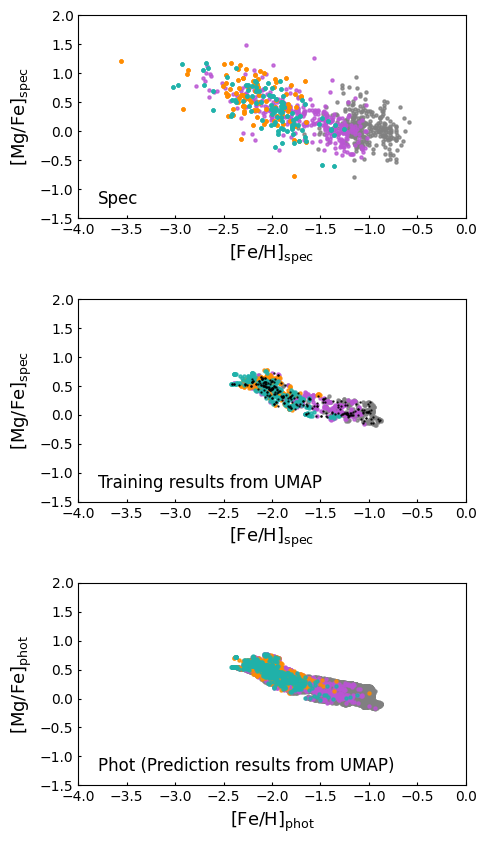

In [244]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_umap'], train_fnx['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_umap'], train_scl['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_umap'], train_umi['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_umap'], train_dra['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_umap'], test_fnx['MGFE_phot_umap'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_umap'], test_scl['MGFE_phot_umap'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_umap'], test_umi['MGFE_phot_umap'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_umap'], test_dra['MGFE_phot_umap'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from UMAP', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_umap'], hsc_fnx_mag['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_umap'], hsc_scl_mag['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_umap'], hsc_umi_mag['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_umap'], hsc_dra_mag['MGFE_phot_umap'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from UMAP)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

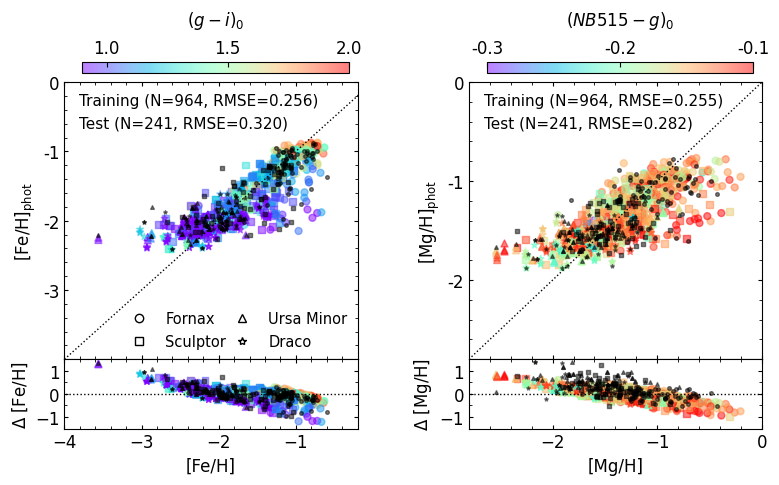

In [245]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_umap'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_umap'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_umap'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_umap'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_umap'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_umap'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_umap'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_umap'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_umap'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_umap']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_umap']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_umap']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_umap']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_umap']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_umap']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_umap']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_umap']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_umap'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_umap'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_umap'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_umap'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_umap'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_umap'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_umap'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_umap'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['MGH'], test_FEH['MGH_phot_umap'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_umap']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_umap']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_umap']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_umap']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_umap']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_umap']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_umap']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_umap']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

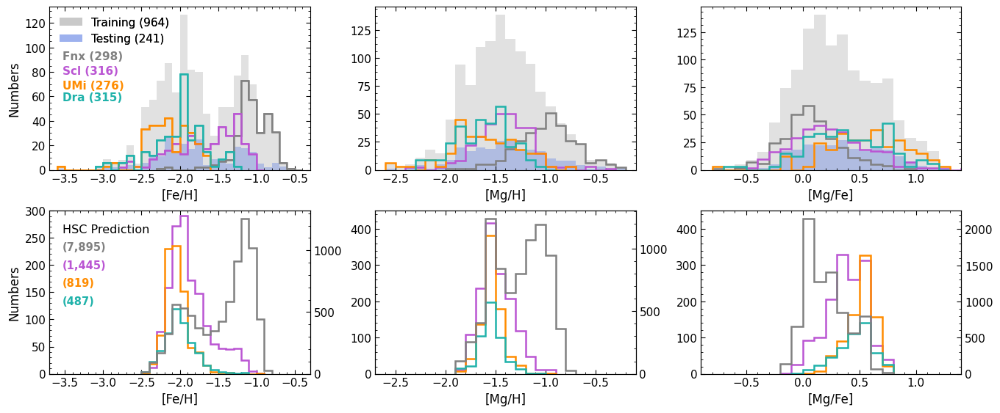

In [281]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_umap'], [hsc_scl_mag['FEH_phot_umap'], hsc_umi_mag['FEH_phot_umap'], hsc_dra_mag['FEH_phot_umap']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_umap'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_umap'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_umap'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_umap'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_umap'], [hsc_scl_mag['MGH_phot_umap'], hsc_umi_mag['MGH_phot_umap'], hsc_dra_mag['MGH_phot_umap']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 450])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_umap'], [hsc_scl_mag['MGFE_phot_umap'], hsc_umi_mag['MGFE_phot_umap'], hsc_dra_mag['MGFE_phot_umap']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [247]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_umap']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_umap']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_umap']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_umap']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_umap']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_umap']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_umap']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_umap']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_umap']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_umap']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_umap']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_umap']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_umap']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_umap']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_umap']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_umap']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_umap']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_umap']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_umap']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_umap']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_umap']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_umap']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_umap']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_umap']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df


,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.48 ± 0.40,-1.27 ± 0.25,0.21 ± 0.18
hsc_scl_mag,-1.87 ± 0.27,-1.49 ± 0.16,0.38 ± 0.18
hsc_umi_mag,-2.04 ± 0.16,-1.53 ± 0.11,0.51 ± 0.12
hsc_dra_mag,-2.00 ± 0.20,-1.55 ± 0.12,0.46 ± 0.16


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [248]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_umap')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_umap')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_umap')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_umap')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

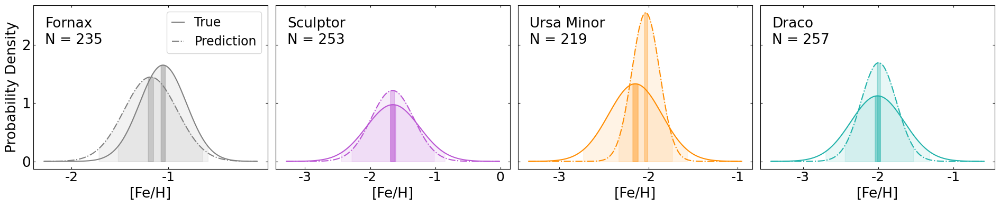

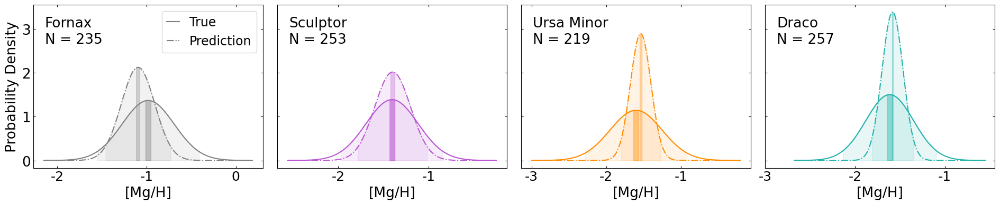

In [249]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_umap'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_umap'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

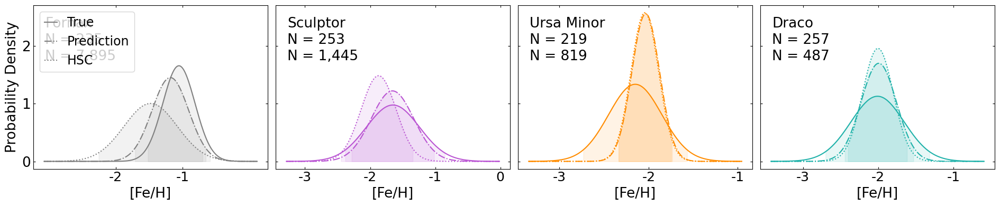

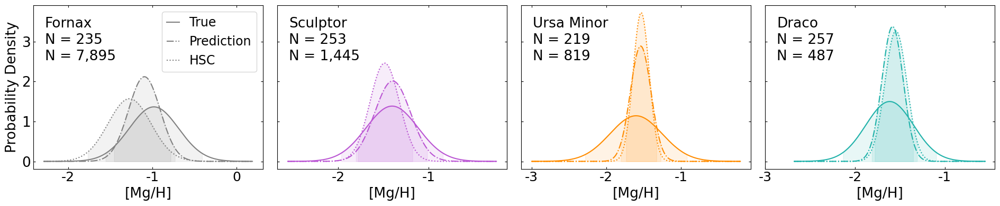

In [250]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_umap'], hsc_df_mag['FEH_phot_umap'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_umap'], hsc_df_mag['MGH_phot_umap'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [251]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_umap')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_umap')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_umap')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_umap')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.051549800699583, -1.9654434576916573)}
Galaxy for: {'bootstrap 95% CI': (-1.084605776397369, -1.0252918376698417)}
Galaxy scl: {'bootstrap 95% CI': (-1.701539806001018, -1.602534189114809)}
Galaxy umi: {'bootstrap 95% CI': (-2.1920520012943214, -2.1103283933035915)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.643800109957645, -1.5828515890153059)}
Galaxy for: {'bootstrap 95% CI': (-1.019398936844171, -0.9446329997366499)}
Galaxy scl: {'bootstrap 95% CI': (-1.4391349336483055, -1.3702622322091902)}
Galaxy umi: {'bootstrap 95% CI': (-1.645900947798618, -1.5539026021219333)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.020150226589556, -1.9639142164792516)}
Galaxy for: {'bootstrap 95% CI': (-1.2164295501471494, -1.1487123278063653)}
Galaxy scl: {'bootstrap 95% CI': (-1.6952572555864052, -1.617459017852693)}
Galaxy umi: {'

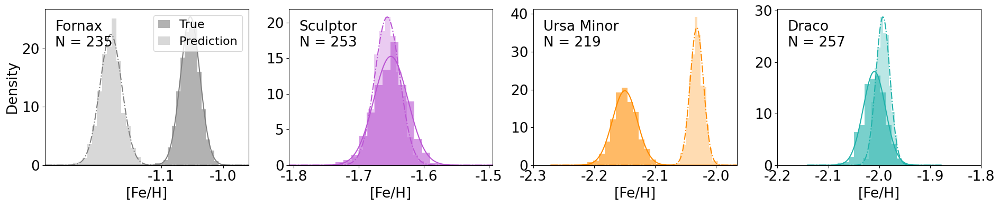

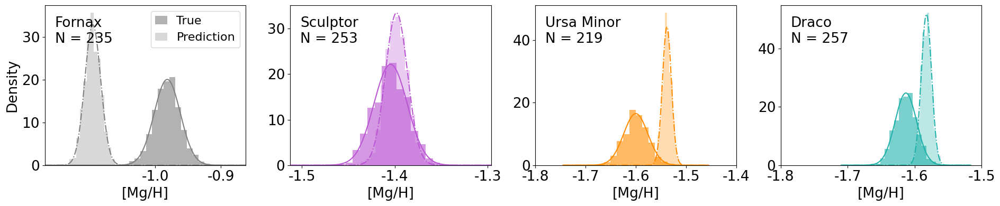

In [252]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_umap', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_umap', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [253]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_umap')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_umap')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.201, RMSE = 0.284, Relative Error % = 10.01%
Galaxy for: MAE = 0.214, RMSE = 0.301, Relative Error % = 20.16%
Galaxy scl: MAE = 0.249, RMSE = 0.333, Relative Error % = 14.96%
Galaxy umi: MAE = 0.257, RMSE = 0.360, Relative Error % = 11.83%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.210, RMSE = 0.271, Relative Error % = 12.55%
Galaxy for: MAE = 0.243, RMSE = 0.315, Relative Error % = 24.14%
Galaxy scl: MAE = 0.195, RMSE = 0.253, Relative Error % = 13.47%
Galaxy umi: MAE = 0.225, RMSE = 0.283, Relative Error % = 13.82%

Our FEH predictions are accurate to within 10-20% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 13-24% (95% confidence) across different galaxies.


# Self Organizing Maps (SOMs)

In [254]:
%%time
from minisom import MiniSom
from sklearn.preprocessing import StandardScaler

# Select input features and target columns
features = ['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']
target_cols = ['FEH', 'MGH']

# Split the dataset
train_dataset, test_dataset = train_test_split(df_mag, test_size=0.2, random_state=42)
# Standardize input features
scaler = StandardScaler()
X_train = scaler.fit_transform(train_dataset[features])
X_test  = scaler.transform(test_dataset[features])

# Initialize and train SOM
# SOM with 15x15 grid, Gaussian neighborhood, fixed random seed
som = MiniSom(x=15, y=15, 
              input_len=len(features), 
              sigma=1.0, 
              learning_rate=0.5, 
              neighborhood_function='gaussian', 
              random_seed=42)
som.random_weights_init(X_train)
som.train_batch(X_train, num_iteration=2000, verbose=False)

# Link each BMU with corresponding target values
def get_bmu_dict(X, Y):
    bmu_dict = {}
    for x, y in zip(X, Y):
        bmu = som.winner(x)
        bmu_dict.setdefault(bmu, []).append(y)
    return bmu_dict

# Compute average target values for each BMU
# Fallback to global average if BMU not found
y_train = train_dataset[target_cols].values
bmu_dict = get_bmu_dict(X_train, y_train)
bmu_avg = {bmu: np.mean(ys, axis=0) for bmu, ys in bmu_dict.items()}
global_avg = np.mean(y_train, axis=0)

# Prediction function using trained SOM
def predict_som(X_scaled):
    preds = []
    for x in X_scaled:
        bmu = som.winner(x)
        preds.append(bmu_avg.get(bmu, global_avg))  # 없는 경우 global 평균
    return np.array(preds)

# Perform predictions on training and test sets
train_pred = predict_som(X_train)
test_pred  = predict_som(X_test)

for ds, pred in zip([train_dataset, test_dataset], [train_pred, test_pred]):
    ds['FEH_phot_som'] = pred[:, 0]
    ds['MGH_phot_som'] = pred[:, 1]
    ds['MGFE_phot_som'] = ds['MGH_phot_som'] - ds['FEH_phot_som']

train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_som'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_som'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_som'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_som'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_som'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_som'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_som'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_som'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Get the HSC prediction
X_hsc = scaler.transform(hsc_df_mag[features])
hsc_pred = predict_som(X_hsc)
hsc_df_mag['FEH_phot_som'] = hsc_pred[:, 0]
hsc_df_mag['MGH_phot_som'] = hsc_pred[:, 1]
hsc_df_mag['MGFE_phot_som'] = hsc_df_mag['MGH_phot_som'] - hsc_df_mag['FEH_phot_som']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_som'] - train_dataset['FEH_phot_som']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_som'] - train_dataset['FEH_phot_som']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_som'] - test_dataset['FEH_phot_som']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_som'] - test_dataset['FEH_phot_som']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Training RMSE FEH: 0.250
Training RMSE MGH: 0.246
Training R² FEH: 0.782
Training R² MGH: 0.604
Training RMSE FEH: 0.313
Training RMSE MGH: 0.283
Training R² FEH: 0.665
Training R² MGH: 0.457
Training RMSE MGFE: 0.249
Training R² MGFE: 0.548
Test RMSE MGFE: 0.291
Test R² MGFE: 0.365
CPU times: user 1.02 s, sys: 0 ns, total: 1.02 s
Wall time: 1.01 s


In [255]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

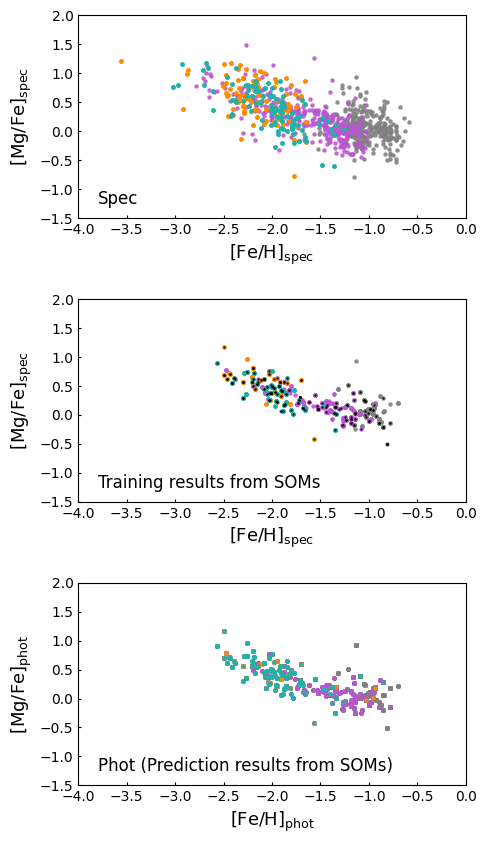

In [256]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_som'], train_fnx['MGFE_phot_som'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_som'], train_scl['MGFE_phot_som'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_som'], train_umi['MGFE_phot_som'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_som'], train_dra['MGFE_phot_som'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_som'], test_fnx['MGFE_phot_som'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_som'], test_scl['MGFE_phot_som'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_som'], test_umi['MGFE_phot_som'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_som'], test_dra['MGFE_phot_som'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from SOMs', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_som'], hsc_fnx_mag['MGFE_phot_som'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_som'], hsc_scl_mag['MGFE_phot_som'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_som'], hsc_umi_mag['MGFE_phot_som'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_som'], hsc_dra_mag['MGFE_phot_som'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from SOMs)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

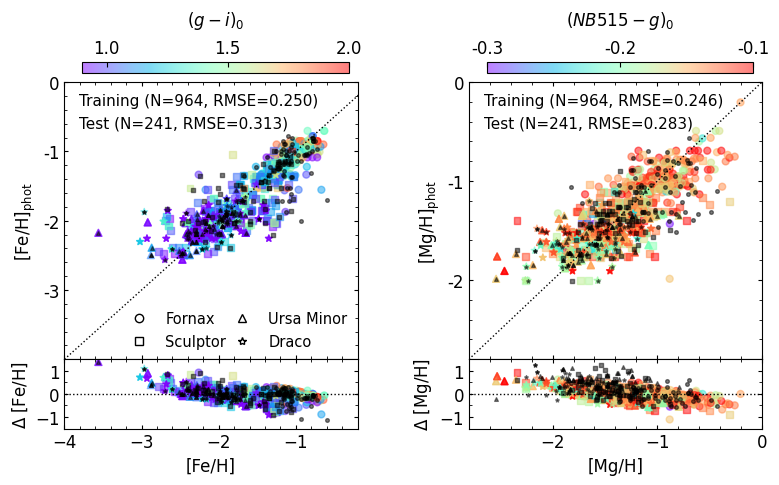

In [257]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_som'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_som'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_som'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_som'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_som'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_som'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_som'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_som'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_som'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_som']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_som']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_som']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_som']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_som']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_som']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_som']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_som']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_som'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_som'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_som'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_som'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_som'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_som'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_som'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_som'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['MGH'], test_FEH['MGH_phot_som'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_som']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_som']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_som']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_som']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_som']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_som']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_som']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_som']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

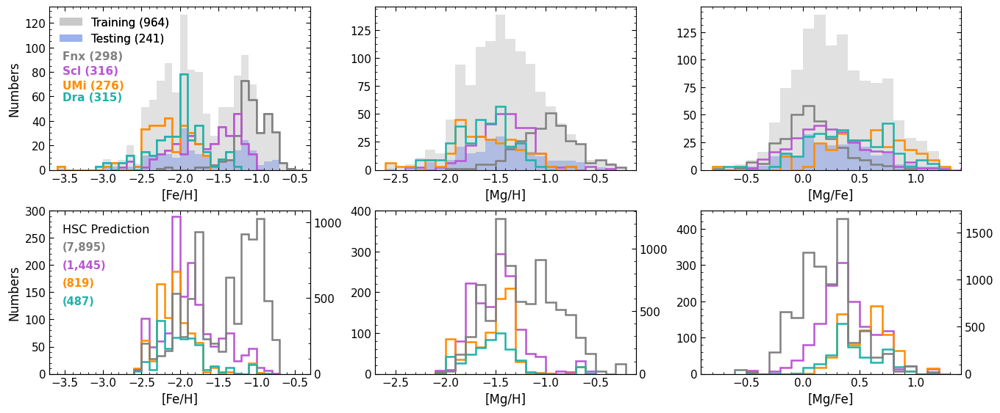

In [258]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_som'], [hsc_scl_mag['FEH_phot_som'], hsc_umi_mag['FEH_phot_som'], hsc_dra_mag['FEH_phot_som']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 300])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_som'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_som'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_som'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_som'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_som'], [hsc_scl_mag['MGH_phot_som'], hsc_umi_mag['MGH_phot_som'], hsc_dra_mag['MGH_phot_som']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 400])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_som'], [hsc_scl_mag['MGFE_phot_som'], hsc_umi_mag['MGFE_phot_som'], hsc_dra_mag['MGFE_phot_som']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 450])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [259]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_som']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_som']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_som']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_som']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_som']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_som']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_som']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_som']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_som']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_som']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_som']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_som']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_som']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_som']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_som']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_som']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_som']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_som']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_som']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_som']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_som']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_som']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_som']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_som']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df

,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.42 ± 0.45,-1.22 ± 0.34,0.21 ± 0.26
hsc_scl_mag,-1.86 ± 0.36,-1.48 ± 0.25,0.38 ± 0.25
hsc_umi_mag,-2.07 ± 0.27,-1.52 ± 0.24,0.55 ± 0.20
hsc_dra_mag,-1.98 ± 0.31,-1.53 ± 0.25,0.45 ± 0.22


# Calculate confidnce level - A) Within-Galaxy Parametric Confidence Intervals

In [260]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_som')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_som')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_som')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_som')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.009, 'std': 0.354, 'n': 257, '95% CI (std)': array([-2.702, -1.316]), '99% CI (std)': array([-2.921, -1.096]), '95% CI (SE)': array([-2.052, -1.966])}
Galaxy for: {'mean': -1.054, 'std': 0.241, 'n': 235, '95% CI (std)': array([-1.526, -0.581]), '99% CI (std)': array([-1.675, -0.432]), '95% CI (SE)': array([-1.084, -1.023])}
Galaxy scl: {'mean': -1.65, 'std': 0.409, 'n': 253, '95% CI (std)': array([-2.451, -0.849]), '99% CI (std)': array([-2.705, -0.595]), '95% CI (SE)': array([-1.701, -1.6  ])}
Galaxy umi: {'mean': -2.15, 'std': 0.299, 'n': 219, '95% CI (std)': array([-2.737, -1.563]), '99% CI (std)': array([-2.922, -1.378]), '95% CI (SE)': array([-2.19, -2.11])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.614, 'std': 0.266, 'n': 257, '95% CI (std)': array([-2.134, -1.093]), '99% CI (std)': array([-2.299, -0.928]), '95% CI (SE)': array([-1.646, -1.581])}
Galaxy for: {'mean': -0.982, 'st

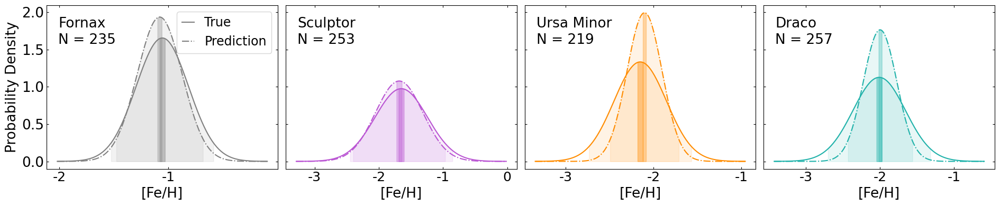

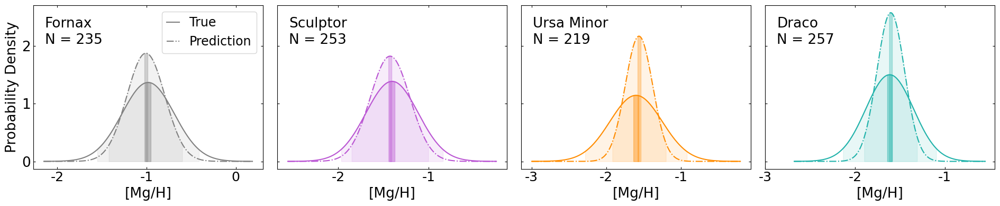

In [261]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_som'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_som'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

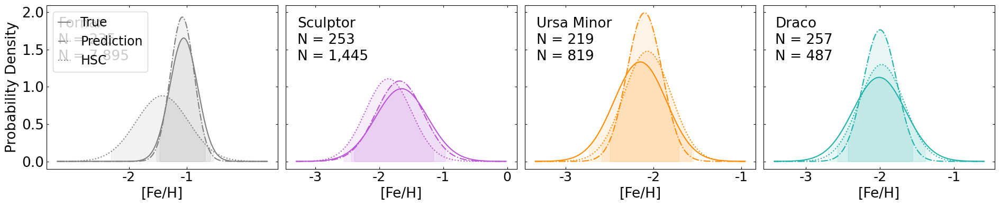

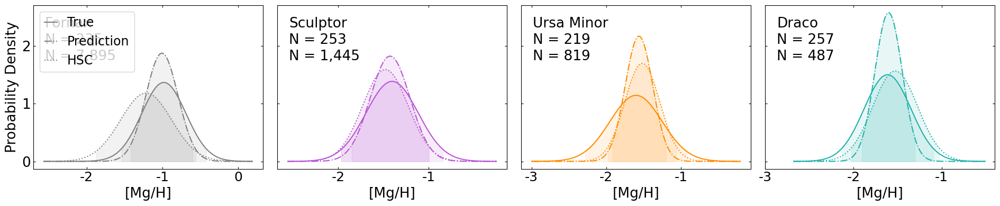

In [262]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_som'], hsc_df_mag['FEH_phot_som'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_som'], hsc_df_mag['MGH_phot_som'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [263]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_som')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_som')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_som')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_som')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0510519768975053, -1.968282212677219)}
Galaxy for: {'bootstrap 95% CI': (-1.0851815847239608, -1.02268620133319)}
Galaxy scl: {'bootstrap 95% CI': (-1.6983110184048746, -1.5984283636737624)}
Galaxy umi: {'bootstrap 95% CI': (-2.190406360044954, -2.1125450743665644)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.6472188357156268, -1.5828951082636071)}
Galaxy for: {'bootstrap 95% CI': (-1.0190246070886744, -0.9441204078433334)}
Galaxy scl: {'bootstrap 95% CI': (-1.4373736367656607, -1.3696232024519255)}
Galaxy umi: {'bootstrap 95% CI': (-1.6468838395445398, -1.5548770776590555)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-2.0252708112103126, -1.9700275233913425)}
Galaxy for: {'bootstrap 95% CI': (-1.1043453780553403, -1.0507785299793204)}
Galaxy scl: {'bootstrap 95% CI': (-1.7292225424055754, -1.636519866508617)}
Galaxy umi

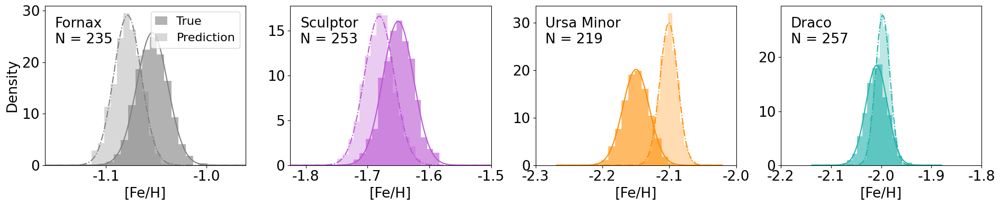

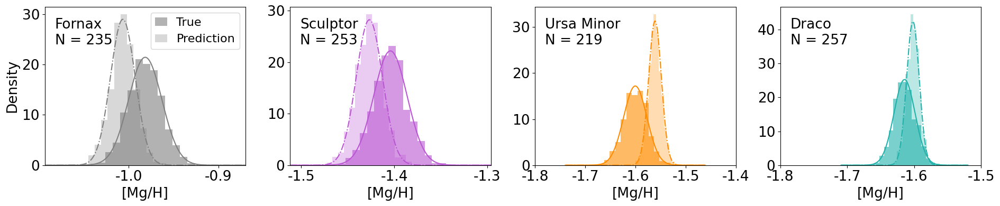

In [264]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_som', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_som', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [265]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_som')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_som')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.184, RMSE = 0.287, Relative Error % = 9.16%
Galaxy for: MAE = 0.217, RMSE = 0.311, Relative Error % = 20.49%
Galaxy scl: MAE = 0.278, RMSE = 0.372, Relative Error % = 16.70%
Galaxy umi: MAE = 0.162, RMSE = 0.262, Relative Error % = 7.47%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.220, RMSE = 0.277, Relative Error % = 13.13%
Galaxy for: MAE = 0.278, RMSE = 0.347, Relative Error % = 27.62%
Galaxy scl: MAE = 0.194, RMSE = 0.245, Relative Error % = 13.41%
Galaxy umi: MAE = 0.179, RMSE = 0.250, Relative Error % = 10.98%

Our FEH predictions are accurate to within 7-20% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 11-28% (95% confidence) across different galaxies.


# support vector machines (Wang22) / regression (SVR)

In [267]:
%%time
from sklearn.svm import SVR
from sklearn.multioutput import MultiOutputRegressor
from sklearn.model_selection import GridSearchCV

# Create SVM model
def build_svm_model(C=1.0, epsilon=0.1, kernel='rbf'):
    svr = SVR(C=C, epsilon=epsilon, kernel=kernel)
    model = MultiOutputRegressor(svr)
    return model

model_svr = build_svm_model(C=0.3, epsilon=0.5, kernel='rbf')

all_train_FEH_mean_preds = []
all_train_FEH_std_preds = []
all_test_FEH_mean_preds = []
all_test_FEH_std_preds = []

all_train_MGH_mean_preds = []
all_train_MGH_std_preds = []
all_test_MGH_mean_preds = []
all_test_MGH_std_preds = []

# KFold cross-validation
for train_index, test_index in kf.split(df_mag):
    # Split into training and test datasets
    train_dataset = df_mag.iloc[train_index]
    test_dataset = df_mag.iloc[test_index]

    # Train the model: Input features and target variables (FEH, MGH)
    model_svr.fit(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values,
                  train_dataset[['FEH', 'MGH']].values)

    # Make predictions
    train_pred = model_svr.predict(train_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    train_FEH_mean_pred = train_pred[:, 0]
    train_FEH_std_pred  = np.std(train_pred[:, 0])
    train_MGH_mean_pred = train_pred[:, 1]
    train_MGH_std_pred  = np.std(train_pred[:, 1])
    all_train_FEH_mean_preds.append(train_FEH_mean_pred)
    all_train_FEH_std_preds.append(train_FEH_std_pred)
    all_train_MGH_mean_preds.append(train_MGH_mean_pred)
    all_train_MGH_std_preds.append(train_MGH_std_pred)
    
    test_pred = model_svr.predict(test_dataset[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
    test_FEH_mean_pred = test_pred[:, 0]
    test_FEH_std_pred  = np.std(test_pred[:, 0])
    test_MGH_mean_pred = test_pred[:, 1]
    test_MGH_std_pred  = np.std(test_pred[:, 1])
    all_test_FEH_mean_preds.append(test_FEH_mean_pred)
    all_test_FEH_std_preds.append(test_FEH_std_pred)
    all_test_MGH_mean_preds.append(test_MGH_mean_pred)
    all_test_MGH_std_preds.append(test_MGH_std_pred)

final_train_FEH = np.mean(all_train_FEH_mean_preds, axis=0)
final_train_FEH_unc = np.mean(all_train_FEH_std_preds, axis=0)
final_train_MGH = np.mean(all_train_MGH_mean_preds, axis=0)
final_train_MGH_unc = np.mean(all_train_MGH_std_preds, axis=0)

final_test_FEH = np.mean(all_test_FEH_mean_preds, axis=0)
final_test_FEH_unc = np.mean(all_test_FEH_std_preds, axis=0)
final_test_MGH = np.mean(all_test_MGH_mean_preds, axis=0)
final_test_MGH_unc = np.mean(all_test_MGH_std_preds, axis=0)

train_dataset['FEH_phot_svr'] = final_train_FEH
train_dataset['FEH_phot_svr_uncertainty'] = final_train_FEH_unc
train_dataset['MGH_phot_svr'] = final_train_MGH
train_dataset['MGH_phot_svr_uncertainty'] = final_train_MGH_unc
train_dataset['MGFE_phot_svr'] = train_dataset['MGH_phot_svr'] - train_dataset['FEH_phot_svr']
train_FEH_rmse = math.sqrt(mean_squared_error(train_dataset['FEH'].values, train_dataset['FEH_phot_svr'].values))
train_MGH_rmse = math.sqrt(mean_squared_error(train_dataset['MGH'].values, train_dataset['MGH_phot_svr'].values))
train_FEH_r2 = r2_score(train_dataset['FEH'], train_dataset['FEH_phot_svr'])
train_MGH_r2 = r2_score(train_dataset['MGH'], train_dataset['MGH_phot_svr'])
print(f'Training RMSE FEH: {train_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {train_MGH_rmse:.3f}') #
print(f'Training R² FEH: {train_FEH_r2:.3f}') #
print(f'Training R² MGH: {train_MGH_r2:.3f}') #

test_dataset['FEH_phot_svr'] = final_test_FEH
test_dataset['FEH_phot_svr_uncertainty'] = final_test_FEH_unc
test_dataset['MGH_phot_svr'] = final_test_MGH
test_dataset['MGH_phot_svr_uncertainty'] = final_test_MGH_unc
test_dataset['MGFE_phot_svr'] = test_dataset['MGH_phot_svr'] - test_dataset['FEH_phot_svr']
test_FEH_rmse = math.sqrt(mean_squared_error(test_dataset['FEH'].values, test_dataset['FEH_phot_svr'].values))
test_MGH_rmse = math.sqrt(mean_squared_error(test_dataset['MGH'].values, test_dataset['MGH_phot_svr'].values))
test_FEH_r2 = r2_score(test_dataset['FEH'], test_dataset['FEH_phot_svr'])
test_MGH_r2 = r2_score(test_dataset['MGH'], test_dataset['MGH_phot_svr'])
print(f'Training RMSE FEH: {test_FEH_rmse:.3f}') #
print(f'Training RMSE MGH: {test_MGH_rmse:.3f}') #
print(f'Training R² FEH: {test_FEH_r2:.3f}') #
print(f'Training R² MGH: {test_MGH_r2:.3f}') #

# Predict using the trained model for the HSC dataset
hsc_dataset_pred_svr = model_svr.predict(hsc_df_mag[['Mg0', 'Mi0', 'Mn0', 'g0_i0', 'g0_n0', 'n0_i0']].values)
hsc_df_mag['FEH_phot_svr'], hsc_df_mag['MGH_phot_svr'] = hsc_dataset_pred_svr[:, 0], hsc_dataset_pred_svr[:, 1]
hsc_df_mag['FEH_phot_svr_uncertainty'], hsc_df_mag['MGH_phot_svr_uncertainty'] = np.std(hsc_dataset_pred_svr[:, 0]), np.std(hsc_dataset_pred_svr[:, 1])
hsc_df_mag['MGFE_phot_svr'] = hsc_df_mag['MGH_phot_svr'] - hsc_df_mag['FEH_phot_svr']

train_MGFE_rmse = math.sqrt(mean_squared_error( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_svr'] - train_dataset['FEH_phot_svr']) ))
train_MGFE_r2 = r2_score( (train_dataset['MGH']-train_dataset['FEH']), (train_dataset['MGH_phot_svr'] - train_dataset['FEH_phot_svr']) )
print(f'Training RMSE MGFE: {train_MGFE_rmse:.3f}') #
print(f'Training R² MGFE: {train_MGFE_r2:.3f}') #

test_MGFE_rmse = math.sqrt(mean_squared_error( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_svr'] - test_dataset['FEH_phot_svr']) ))
test_MGFE_r2 = r2_score( (test_dataset['MGH']-test_dataset['FEH']), (test_dataset['MGH_phot_svr'] - test_dataset['FEH_phot_svr']) )
print(f'Test RMSE MGFE: {test_MGFE_rmse:.3f}') #
print(f'Test R² MGFE: {test_MGFE_r2:.3f}') #


Training RMSE FEH: 0.409
Training RMSE MGH: 0.333
Training R² FEH: 0.416
Training R² MGH: 0.253
Training RMSE FEH: 0.428
Training RMSE MGH: 0.356
Training R² FEH: 0.354
Training R² MGH: 0.236
Training RMSE MGFE: 0.340
Training R² MGFE: 0.167
Test RMSE MGFE: 0.340
Test R² MGFE: 0.101
CPU times: user 640 ms, sys: 1.68 ms, total: 641 ms
Wall time: 799 ms


In [268]:
train_fnx = train_dataset[train_dataset['DSPH'] == 'for']
train_scl = train_dataset[train_dataset['DSPH'] == 'scl']
train_umi = train_dataset[train_dataset['DSPH'] == 'umi']
train_dra = train_dataset[train_dataset['DSPH'] == 'dra']

test_fnx = test_dataset[test_dataset['DSPH'] == 'for']
test_scl = test_dataset[test_dataset['DSPH'] == 'scl']
test_umi = test_dataset[test_dataset['DSPH'] == 'umi']
test_dra = test_dataset[test_dataset['DSPH'] == 'dra']

df_fnx_mag = df_mag[df_mag['DSPH'] == 'for']
df_scl_mag = df_mag[df_mag['DSPH'] == 'scl']
df_umi_mag = df_mag[df_mag['DSPH'] == 'umi']
df_dra_mag = df_mag[df_mag['DSPH'] == 'dra']

hsc_fnx_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'for']
hsc_scl_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'scl']
hsc_umi_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'umi']
hsc_dra_mag = hsc_df_mag[hsc_df_mag['DSPH'] == 'dra']

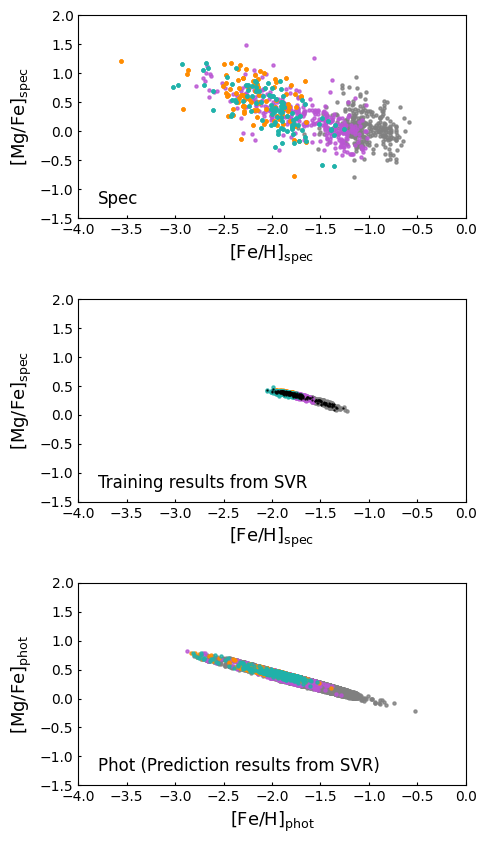

In [269]:
fig, (ax0, ax1, ax2) = plt.subplots(nrows=3, ncols=1, figsize=(5,10), gridspec_kw={'wspace':0.4, 'hspace':0.4})
s = 5 ; alpha = 0.8
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']

# Spectroscopy
ax0.scatter(fnx_mag['FEH'], fnx_mag['MGFE'], s=s, alpha=alpha, color=colors[0])
ax0.scatter(scl_mag['FEH'], scl_mag['MGFE'], s=s, alpha=alpha, color=colors[1])
ax0.scatter(umi_mag['FEH'], umi_mag['MGFE'], s=s, alpha=alpha, color=colors[2])
ax0.scatter(dra_mag['FEH'], dra_mag['MGFE'], s=s, alpha=alpha, color=colors[3])
ax0.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax0.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax0.set_xlim([-4, 0])
ax0.set_ylim([-1.5, 2])
ax0.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax0.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax0.text(0.05, 0.05, 'Spec', ha='left', va='bottom', transform=ax0.transAxes, color='k', size=12)

# Training
ax1.scatter(train_fnx['FEH_phot_svr'], train_fnx['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[0])
ax1.scatter(train_scl['FEH_phot_svr'], train_scl['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[1])
ax1.scatter(train_umi['FEH_phot_svr'], train_umi['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[2])
ax1.scatter(train_dra['FEH_phot_svr'], train_dra['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[3])
ax1.scatter(test_fnx['FEH_phot_svr'], test_fnx['MGFE_phot_svr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_scl['FEH_phot_svr'], test_scl['MGFE_phot_svr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_umi['FEH_phot_svr'], test_umi['MGFE_phot_svr'], s=0.5, alpha=alpha, color='k')
ax1.scatter(test_dra['FEH_phot_svr'], test_dra['MGFE_phot_svr'], s=0.5, alpha=alpha, color='k')
ax1.set_xlabel(r'[Fe/H]$_\mathrm{spec}$', size=13)
ax1.set_ylabel(r'[Mg/Fe]$_\mathrm{spec}$', size=13)
ax1.set_xlim([-4, 0])
ax1.set_ylim([-1.5, 2])
ax1.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax1.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax1.text(0.05, 0.05, 'Training results from SVR', ha='left', va='bottom', transform=ax1.transAxes, color='k', size=12)

# Photometry
ax2.scatter(hsc_fnx_mag['FEH_phot_svr'], hsc_fnx_mag['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[0])
ax2.scatter(hsc_scl_mag['FEH_phot_svr'], hsc_scl_mag['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[1])
ax2.scatter(hsc_umi_mag['FEH_phot_svr'], hsc_umi_mag['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[2])
ax2.scatter(hsc_dra_mag['FEH_phot_svr'], hsc_dra_mag['MGFE_phot_svr'], s=s, alpha=alpha, color=colors[3])
ax2.set_xlabel(r'[Fe/H]$_\mathrm{phot}$', size=13)
ax2.set_ylabel(r'[Mg/Fe]$_\mathrm{phot}$', size=13)
ax2.set_xlim([-4, 0])
ax2.set_ylim([-1.5, 2])
ax2.tick_params(axis='x', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='x', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.tick_params(axis='y', which='major', direction='in', right=False, top=False, length=2.5, labelsize=10)
ax2.tick_params(axis='y', which='minor', direction='in', right=False, top=False, length=2, labelsize=10)
ax2.text(0.05, 0.05, 'Phot (Prediction results from SVR)', ha='left', va='bottom', transform=ax2.transAxes, color='k', size=12)

plt.show()

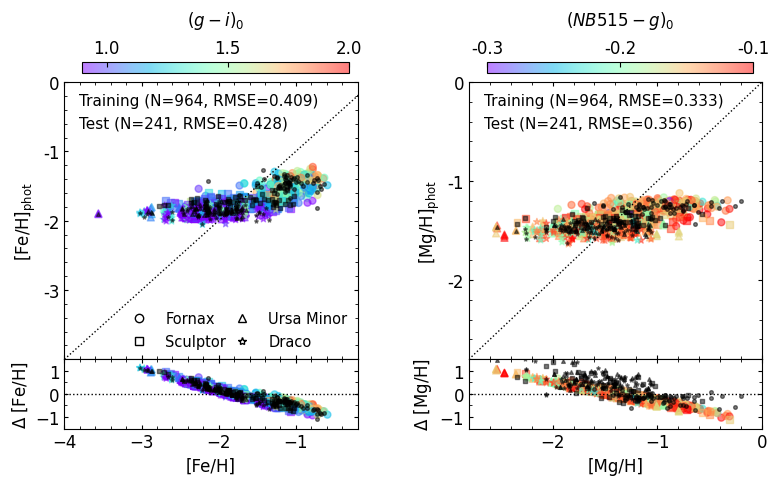

In [270]:
fig, ((ax0, ax1), (ax2, ax3)) = plt.subplots(nrows=2, ncols=2, figsize=(9, 4.5), gridspec_kw={'wspace':0.38, 'hspace':0, 'height_ratios': [1, 0.25]})
s = 25 ; alpha = 0.5
xmin, xmax = -4, -0.2
vmin, vmax = 0.9, 2
color = 'deeppink'
markers = ['o', 's', '^', '*']

# Training
# [Fe/H]
ax0.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax0.scatter(train_fnx['FEH'], train_fnx['FEH_phot_svr'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax0.scatter(train_scl['FEH'], train_scl['FEH_phot_svr'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax0.scatter(train_umi['FEH'], train_umi['FEH_phot_svr'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax0.scatter(train_dra['FEH'], train_dra['FEH_phot_svr'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax0.scatter(test_fnx['FEH'], test_fnx['FEH_phot_svr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax0.scatter(test_scl['FEH'], test_scl['FEH_phot_svr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax0.scatter(test_umi['FEH'], test_umi['FEH_phot_svr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax0.scatter(test_dra['FEH'], test_dra['FEH_phot_svr'], s=7, alpha=0.5, marker=markers[3], color='black')

custom_legend = [
    Line2D([0], [0], linestyle='None', marker=markers[0], color='k', markerfacecolor='w', markersize=6, label='Fornax'),
    Line2D([0], [0], linestyle='None', marker=markers[1], color='k', markerfacecolor='w', markersize=6, label='Sculptor'),
    Line2D([0], [0], linestyle='None', marker=markers[2], color='k', markerfacecolor='w', markersize=6, label='Ursa Minor'),
    Line2D([0], [0], linestyle='None', marker=markers[3], color='k', markerfacecolor='w', markersize=6, label='Draco'),
]
legend = ax0.legend(handles=custom_legend, fontsize=10.5, framealpha=0, ncol=2, columnspacing=0.1)
legend.set_bbox_to_anchor((0.16, 0.12, 0.3, 0.1), transform=ax0.transAxes)
ax0.set_xlabel('')
ax0.set_ylabel('[Fe/H]$_\mathrm{phot}$', size=12)
ax0.set_xlim([xmin, xmax])
ax0.set_ylim([xmin, xmax])
ax0.set_xticklabels('')
ax0.set_yticks([-3, -2, -1, 0])
ax0.set_yticklabels(['-3', '-2', '-1', '0'])
ax0.xaxis.set_minor_locator(AutoMinorLocator(5))
ax0.yaxis.set_minor_locator(AutoMinorLocator(5))
ax0.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax0.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax0.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
ax0.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_FEH_rmse:.3f})', ha='left', va='top', transform=ax0.transAxes, size=11)
cax = fig.add_axes([ax0.get_position().x0+0.02, ax0.get_position().y1+0.02, ax0.get_position().x1-ax0.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(g - i)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([1.0, 1.5, 2.0])
cbar.ax.set_xticklabels(['1.0', '1.5', '2.0'])
#m_train, b_train = np.polyfit(train_FEH['FEH'], train_FEH['FEH_phot_svr'], 1)
#ax0.plot(np.linspace(xmin, xmax, 100), m_train * np.linspace(xmin, xmax, 100) + b_train, color='black', linestyle='-', linewidth=1.5, label='Train Fit')
#print('m_train =', m_train)

ax2.axhline(0, xmin, xmax+2, color='k', linewidth=1, linestyle=':')
ax2.scatter(train_fnx['FEH'], train_fnx['FEH_phot_svr']-train_fnx['FEH'], s=s, alpha=alpha, c=train_fnx['Mg0']-train_fnx['Mi0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax2.scatter(train_scl['FEH'], train_scl['FEH_phot_svr']-train_scl['FEH'], s=s, alpha=alpha, c=train_scl['Mg0']-train_scl['Mi0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax2.scatter(train_umi['FEH'], train_umi['FEH_phot_svr']-train_umi['FEH'], s=s, alpha=alpha, c=train_umi['Mg0']-train_umi['Mi0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax2.scatter(train_dra['FEH'], train_dra['FEH_phot_svr']-train_dra['FEH'], s=s, alpha=alpha, c=train_dra['Mg0']-train_dra['Mi0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax2.scatter(test_fnx['FEH'], test_fnx['FEH_phot_svr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax2.scatter(test_scl['FEH'], test_scl['FEH_phot_svr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax2.scatter(test_umi['FEH'], test_umi['FEH_phot_svr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax2.scatter(test_dra['FEH'], test_dra['FEH_phot_svr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax2.set_xlabel('[Fe/H]', size=12)
ax2.set_ylabel('$\Delta$ [Fe/H]', size=12)
ax2.set_xlim([xmin, xmax])
ax2.set_ylim([-1.5, 1.5])
ax2.xaxis.set_minor_locator(AutoMinorLocator(5))
ax2.yaxis.set_minor_locator(AutoMinorLocator(2))
ax2.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax2.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax2.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)


# Test
# [Mg/H]
xmin, xmax = -2.8, 0
vmin, vmax = -0.3, -0.1
ax1.plot(np.arange(xmin, xmax+0.5, 0.1), np.arange(xmin, xmax+0.5, 0.1), color='k', linewidth=1, linestyle=':')
im = ax1.scatter(train_fnx['MGH'], train_fnx['MGH_phot_svr'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax1.scatter(train_scl['MGH'], train_scl['MGH_phot_svr'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax1.scatter(train_umi['MGH'], train_umi['MGH_phot_svr'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax1.scatter(train_dra['MGH'], train_dra['MGH_phot_svr'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax1.scatter(test_fnx['MGH'], test_fnx['MGH_phot_svr'], s=7, alpha=0.5, marker=markers[0], color='black')
ax1.scatter(test_scl['MGH'], test_scl['MGH_phot_svr'], s=7, alpha=0.5, marker=markers[1], color='black')
ax1.scatter(test_umi['MGH'], test_umi['MGH_phot_svr'], s=7, alpha=0.5, marker=markers[2], color='black')
ax1.scatter(test_dra['MGH'], test_dra['MGH_phot_svr'], s=7, alpha=0.5, marker=markers[3], color='black')

ax1.set_xlabel('')
ax1.set_ylabel('[Mg/H]$_\mathrm{phot}$', size=12)
ax1.set_xlim([xmin, xmax])
ax1.set_ylim([xmin, xmax])
ax1.set_xticklabels('')
ax1.set_yticks([-2, -1, 0])
ax1.set_yticklabels(['-2', '-1', '0'])
ax1.xaxis.set_minor_locator(AutoMinorLocator(5))
ax1.yaxis.set_minor_locator(AutoMinorLocator(5))
ax1.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax1.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax1.text(0.05, 0.96, f'Training (N={len(train_dataset)}, RMSE={train_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
ax1.text(0.05, 0.88, f'Test (N={len(test_dataset)}, RMSE={test_MGH_rmse:.3f})', ha='left', va='top', transform=ax1.transAxes, size=11)
cax = fig.add_axes([ax1.get_position().x0+0.02, ax1.get_position().y1+0.02, ax1.get_position().x1-ax1.get_position().x0-0.03, 0.025])
cbar = fig.colorbar(im, orientation='horizontal', cax=cax)
cbar.ax.tick_params(labelsize=12, direction='in')
cbar.ax.xaxis.set_ticks_position('top')
cbar.ax.xaxis.set_label_position('top')
cbar.set_label('$(NB515 - g)_0$', size=12, labelpad=10, loc='center')
cbar.ax.set_xticks([-0.3, -0.2, -0.1])
cbar.ax.set_xticklabels(['-0.3', '-0.2', '-0.1'])
#m_test, b_test = np.polyfit(test_FEH['FEH'], test_FEH['FEH_phot_svr'], 1)
#ax1.plot(np.linspace(xmin, xmax, 100), m_test * np.linspace(xmin, xmax, 100) + b_test, color=color, linestyle='-', linewidth=1.5, label='Test Fit')
#print('m_test =', m_test)

ax3.axhline(0, xmin, xmax+1, color='k', linewidth=1, linestyle=':')
ax3.scatter(train_fnx['MGH'], train_fnx['MGH_phot_svr']-train_fnx['MGH'], s=s, alpha=alpha, c=train_fnx['Mn0']-train_fnx['Mg0'], cmap='rainbow', marker=markers[0], vmin=vmin, vmax=vmax)
ax3.scatter(train_scl['MGH'], train_scl['MGH_phot_svr']-train_scl['MGH'], s=s, alpha=alpha, c=train_scl['Mn0']-train_scl['Mg0'], cmap='rainbow', marker=markers[1], vmin=vmin, vmax=vmax)
ax3.scatter(train_umi['MGH'], train_umi['MGH_phot_svr']-train_umi['MGH'], s=s, alpha=alpha, c=train_umi['Mn0']-train_umi['Mg0'], cmap='rainbow', marker=markers[2], vmin=vmin, vmax=vmax)
ax3.scatter(train_dra['MGH'], train_dra['MGH_phot_svr']-train_dra['MGH'], s=s, alpha=alpha, c=train_dra['Mn0']-train_dra['Mg0'], cmap='rainbow', marker=markers[3], vmin=vmin, vmax=vmax)

ax3.scatter(test_fnx['MGH'], test_fnx['MGH_phot_svr']-test_fnx['FEH'], s=7, alpha=0.5, marker=markers[0], color='black')
ax3.scatter(test_scl['MGH'], test_scl['MGH_phot_svr']-test_scl['FEH'], s=7, alpha=0.5, marker=markers[1], color='black')
ax3.scatter(test_umi['MGH'], test_umi['MGH_phot_svr']-test_umi['FEH'], s=7, alpha=0.5, marker=markers[2], color='black')
ax3.scatter(test_dra['MGH'], test_dra['MGH_phot_svr']-test_dra['FEH'], s=7, alpha=0.5, marker=markers[3], color='black')

ax3.set_xlabel('[Mg/H]', size=12)
ax3.set_ylabel('$\Delta$ [Mg/H]', size=12)
ax3.set_xlim([xmin, xmax])
ax3.set_ylim([-1.5, 1.5])
ax3.xaxis.set_minor_locator(AutoMinorLocator(5))
ax3.yaxis.set_minor_locator(AutoMinorLocator(2))
ax3.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)
ax3.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=12)
ax3.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=12)

plt.show()

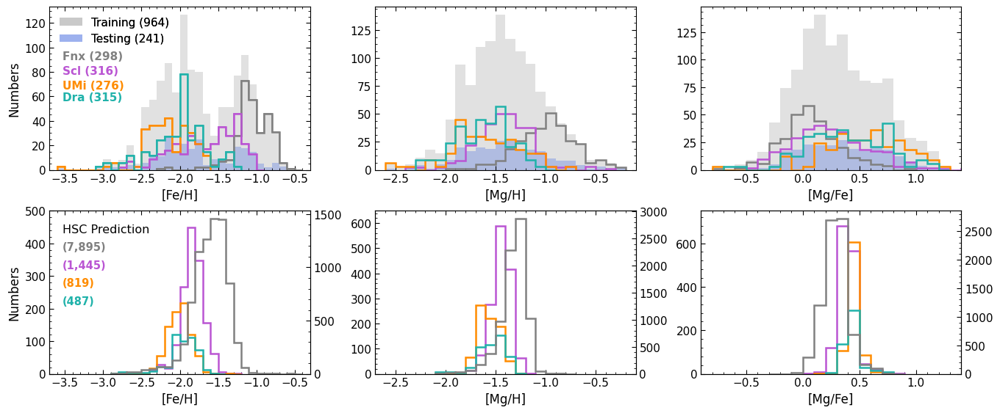

In [280]:
def plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    for data, color in zip(data_list, colors):
        ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                histtype='step', linestyle=linestyle, color=color, linewidth=1.8, alpha=alpha)
    ax.set_xlabel(xlabel, size=12)
    ax.set_ylabel(ylabel, size=12)
    if show_legend:
        for data, label, color in zip(data_list, labels, colors):
            ax.hist(data, bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                     np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                    histtype='step', linestyle=linestyle, color=color, label=label, linewidth=1.8, alpha=alpha)
        ax.legend(loc='upper left', frameon=False, fontsize=11)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(4))
    ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)

def plot_with_twinx(ax_twin, ax, twin_data, data_list, twin_label, labels, twin_color, colors, alpha, xlabel, ylabel, bins_width=0.1, show_legend=True, linestyle='solid'):
    ax_twin.hist(twin_data, bins=np.arange(np.floor(np.min(twin_data) / bins_width) * bins_width,
                                     np.ceil(np.max(twin_data) / bins_width) * bins_width + bins_width,
                                     bins_width),
                 histtype='step', linestyle=linestyle, color=twin_color, label=twin_label, linewidth=1.8, alpha=alpha)
    plot_histogram(ax, data_list, labels, colors, alpha, xlabel, ylabel, bins_width, show_legend, linestyle)
    ax.xaxis.set_minor_locator(AutoMinorLocator(5))
    ax.yaxis.set_minor_locator(AutoMinorLocator(5))

    ax.tick_params(axis='y', which='both', left=True, right=False)
    ax_twin.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=4, labelsize=11)
    ax_twin.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=11)
    ax_twin.yaxis.set_minor_locator(MultipleLocator(100))
    ax_twin.yaxis.set_major_locator(MultipleLocator(500))
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        handles_twin, labels_twin = ax_twin.get_legend_handles_labels()
        ax.legend(handles_twin + handles, labels_twin + labels, loc='upper left', frameon=False, fontsize=10)



# Set up the figure and axes
fig, ((ax0, ax1, ax2), (ax3, ax4, ax5)) = plt.subplots(nrows=2, ncols=3, figsize=(16, 6.5), gridspec_kw={'wspace': 0.25, 'hspace': 0.25})
bins_width = 0.1
labels = ['Fornax', 'Sculptor', 'Ursa Minor', 'Draco']
colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
alpha = 1

# 1st row 
h1 = ax0.hist(df_mag['FEH'], bins=np.arange(np.floor(np.min(df_mag['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2, label='Combined DEIMOS')
h2 = ax0.hist(test_dataset['FEH'], bins=np.arange(np.floor(np.min(test_dataset['FEH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['FEH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3, label='Test results')
handles1 = [h1[2][0], h2[2][0]]
labels1 = [f'Training ({len(train_dataset):,.0f})', f'Testing ({len(test_dataset):,.0f})']
legend1 = ax0.legend(handles1, labels1, loc='upper left', frameon=False, fontsize=11, bbox_to_anchor=(0, 1))
ax0.set_xticks([-3.5, -3.0, -2.5, -2.0, -1.5, -1.0, -0.5])
ax0.set_xlim([-3.7, -0.3])
plot_histogram(ax0, [fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], labels, colors, alpha, '[Fe/H]', 'Numbers', show_legend=False)
gal_handles = []
for data, color in zip([fnx_mag['FEH'], scl_mag['FEH'], umi_mag['FEH'], dra_mag['FEH']], colors):
    n, bins, patches = ax0.hist(data,
                                bins=np.arange(np.floor(np.min(data) / bins_width) * bins_width,
                                               np.ceil(np.max(data) / bins_width) * bins_width + bins_width,
                                               bins_width),
                                histtype='step', linestyle='solid', color=color, linewidth=1.2, alpha=alpha)
    gal_handles.append(patches[0])
ax0.add_artist(legend1)
ax0.text(0.05, 0.73, f'Fnx ({len(fnx_mag):,.0f})', ha='left', va='top', color=colors[0], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.64, f'Scl ({len(scl_mag):,.0f})', ha='left', va='top', color=colors[1], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.55, f'UMi ({len(umi_mag):,.0f})', ha='left', va='top', color=colors[2], size=11, transform=ax0.transAxes, fontweight='bold')
ax0.text(0.05, 0.48, f'Dra ({len(dra_mag):,.0f})', ha='left', va='top', color=colors[3], size=11, transform=ax0.transAxes, fontweight='bold')

ax1.hist(df_mag['MGH'], bins=np.arange(np.floor(np.min(df_mag['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax1.hist(test_dataset['MGH'], bins=np.arange(np.floor(np.min(test_dataset['MGH']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGH']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax1, [fnx_mag['MGH'], scl_mag['MGH'], umi_mag['MGH'], dra_mag['MGH']], labels, colors, alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax1.set_xlim([-2.7, -0.1])

ax2.hist(df_mag['MGFE'], bins=np.arange(np.floor(np.min(df_mag['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(df_mag['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='dimgray', alpha=0.2)
ax2.hist(test_dataset['MGFE'], bins=np.arange(np.floor(np.min(test_dataset['MGFE']) / bins_width) * bins_width,
                                     np.ceil(np.max(test_dataset['MGFE']) / bins_width) * bins_width + bins_width,
                                     bins_width),
         histtype='stepfilled', color='royalblue', alpha=0.3)
plot_histogram(ax2, [fnx_mag['MGFE'], scl_mag['MGFE'], umi_mag['MGFE'], dra_mag['MGFE']], labels, colors, alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax2.set_xlim([-0.9, 1.4])

# 2nd row
plot_with_twinx(ax3.twinx(), ax3,
                hsc_fnx_mag['FEH_phot_svr'], [hsc_scl_mag['FEH_phot_svr'], hsc_umi_mag['FEH_phot_svr'], hsc_dra_mag['FEH_phot_svr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Fe/H]', 'Numbers', show_legend=False)
ax3.set_xlim([-3.7, -0.3])
ax3.set_ylim([0, 500])
ax3.text(0.05, 0.92, 'HSC Prediction', ha='left', va='top', transform=ax3.transAxes, size=11.5)
ax3.text(0.05, 0.81, '({0:,.0f})'.format(len(hsc_fnx_mag['FEH_phot_svr'])), ha='left', va='top', color=colors[0], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.70, '({0:,.0f})'.format(len(hsc_scl_mag['FEH_phot_svr'])), ha='left', va='top', color=colors[1], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.59, '({0:,.0f})'.format(len(hsc_umi_mag['FEH_phot_svr'])), ha='left', va='top', color=colors[2], size=10.5, transform=ax3.transAxes, fontweight='bold')
ax3.text(0.05, 0.48, '({0:,.0f})'.format(len(hsc_dra_mag['FEH_phot_svr'])), ha='left', va='top', color=colors[3], size=10.5, transform=ax3.transAxes, fontweight='bold')

plot_with_twinx(ax4.twinx(), ax4, 
                hsc_fnx_mag['MGH_phot_svr'], [hsc_scl_mag['MGH_phot_svr'], hsc_umi_mag['MGH_phot_svr'], hsc_dra_mag['MGH_phot_svr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/H]', 'Numbers', show_legend=False)
ax4.set_xlim([-2.7, -0.1])
ax4.set_ylim([0, 650])

plot_with_twinx(ax5.twinx(), ax5, 
                hsc_fnx_mag['MGFE_phot_svr'], [hsc_scl_mag['MGFE_phot_svr'], hsc_umi_mag['MGFE_phot_svr'], hsc_dra_mag['MGFE_phot_svr']], 
                'Fnx prediction', ['Scl prediction', 'UMi prediction', 'Dra prediction'], 
                'gray', ['mediumorchid', 'darkorange', 'lightseagreen'], alpha, '[Mg/Fe]', 'Numbers', show_legend=False)
ax5.set_xlim([-0.9, 1.4])
ax5.set_ylim([0, 750])

for ax in [ax1, ax2, ax4, ax5]:
    ax.set_ylabel('')

plt.show()

In [272]:
data = {
    'FEH': [
        f"{np.mean(fnx_mag['FEH']):.2f} ± {np.std(fnx_mag['FEH']):.2f}",
        f"{np.mean(scl_mag['FEH']):.2f} ± {np.std(scl_mag['FEH']):.2f}",
        f"{np.mean(umi_mag['FEH']):.2f} ± {np.std(umi_mag['FEH']):.2f}",
        f"{np.mean(dra_mag['FEH']):.2f} ± {np.std(dra_mag['FEH']):.2f}",
        f"{np.mean(hsc_fnx_mag['FEH_phot_svr']):.2f} ± {np.std(hsc_fnx_mag['FEH_phot_svr']):.2f}",
        f"{np.mean(hsc_scl_mag['FEH_phot_svr']):.2f} ± {np.std(hsc_scl_mag['FEH_phot_svr']):.2f}",
        f"{np.mean(hsc_umi_mag['FEH_phot_svr']):.2f} ± {np.std(hsc_umi_mag['FEH_phot_svr']):.2f}",
        f"{np.mean(hsc_dra_mag['FEH_phot_svr']):.2f} ± {np.std(hsc_dra_mag['FEH_phot_svr']):.2f}"
    ],
    'MGH': [
        f"{np.mean(fnx_mag['MGH']):.2f} ± {np.std(fnx_mag['MGH']):.2f}",
        f"{np.mean(scl_mag['MGH']):.2f} ± {np.std(scl_mag['MGH']):.2f}",
        f"{np.mean(umi_mag['MGH']):.2f} ± {np.std(umi_mag['MGH']):.2f}",
        f"{np.mean(dra_mag['MGH']):.2f} ± {np.std(dra_mag['MGH']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGH_phot_svr']):.2f} ± {np.std(hsc_fnx_mag['MGH_phot_svr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGH_phot_svr']):.2f} ± {np.std(hsc_scl_mag['MGH_phot_svr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGH_phot_svr']):.2f} ± {np.std(hsc_umi_mag['MGH_phot_svr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGH_phot_svr']):.2f} ± {np.std(hsc_dra_mag['MGH_phot_svr']):.2f}"
    ],
    'MGFE': [
        f"{np.mean(fnx_mag['MGFE']):.2f} ± {np.std(fnx_mag['MGFE']):.2f}",
        f"{np.mean(scl_mag['MGFE']):.2f} ± {np.std(scl_mag['MGFE']):.2f}",
        f"{np.mean(umi_mag['MGFE']):.2f} ± {np.std(umi_mag['MGFE']):.2f}",
        f"{np.mean(dra_mag['MGFE']):.2f} ± {np.std(dra_mag['MGFE']):.2f}",
        f"{np.mean(hsc_fnx_mag['MGFE_phot_svr']):.2f} ± {np.std(hsc_fnx_mag['MGFE_phot_svr']):.2f}",
        f"{np.mean(hsc_scl_mag['MGFE_phot_svr']):.2f} ± {np.std(hsc_scl_mag['MGFE_phot_svr']):.2f}",
        f"{np.mean(hsc_umi_mag['MGFE_phot_svr']):.2f} ± {np.std(hsc_umi_mag['MGFE_phot_svr']):.2f}",
        f"{np.mean(hsc_dra_mag['MGFE_phot_svr']):.2f} ± {np.std(hsc_dra_mag['MGFE_phot_svr']):.2f}"
    ]
}

index = [
    'fnx_mag', 'scl_mag', 'umi_mag', 'dra_mag',
    'hsc_fnx_mag', 'hsc_scl_mag', 'hsc_umi_mag', 'hsc_dra_mag'
]

df = pd.DataFrame(data, index=index)

df


,FEH,MGH,MGFE
fnx_mag,-1.05 ± 0.23,-0.99 ± 0.29,0.07 ± 0.25
scl_mag,-1.65 ± 0.41,-1.41 ± 0.28,0.24 ± 0.34
umi_mag,-2.15 ± 0.31,-1.61 ± 0.34,0.55 ± 0.35
dra_mag,-2.01 ± 0.35,-1.62 ± 0.27,0.38 ± 0.35
hsc_fnx_mag,-1.61 ± 0.23,-1.32 ± 0.13,0.29 ± 0.11
hsc_scl_mag,-1.84 ± 0.16,-1.45 ± 0.10,0.39 ± 0.07
hsc_umi_mag,-2.02 ± 0.16,-1.57 ± 0.12,0.45 ± 0.06
hsc_dra_mag,-1.97 ± 0.20,-1.53 ± 0.14,0.43 ± 0.08


In [273]:
def parametric_confidence_intervals(df, abundance_col, group_col='DSPH'):
    """
    For each galaxy group, calculate the mean, standard deviation, 
    and the 95% and 99% confidence intervals 
    (based on standard deviation, and 95% confidence interval based on standard error) for the abundance column (e.g., 'FEH' or 'MGH').
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        mu = group[abundance_col].mean()
        sigma = group[abundance_col].std()
        n = group[abundance_col].count()
        se = sigma / np.sqrt(n)
        
        # CI from standard deviation
        ci_95_std = (mu - 1.96 * sigma, mu + 1.96 * sigma)
        ci_99_std = (mu - 2.58 * sigma, mu + 2.58 * sigma)
        
        # CI from standard error
        ci_95_se = (mu - 1.96 * se, mu + 1.96 * se)
        
        results[galaxy] = {
            'mean': np.round(mu, 3),
            'std': np.round(sigma, 3),
            'n': n,
            '95% CI (std)': np.round(ci_95_std, 3),
            '99% CI (std)': np.round(ci_99_std, 3),
            '95% CI (SE)': np.round(ci_95_se, 3)
        }
    return results

# CI for FEH, MGH of training dataset
parametric_ci_feh = parametric_confidence_intervals(train_dataset, 'FEH')
parametric_ci_mgh = parametric_confidence_intervals(train_dataset, 'MGH')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
parametric_ci_feh_pred = parametric_confidence_intervals(train_dataset, 'FEH_phot_svr')
parametric_ci_mgh_pred = parametric_confidence_intervals(train_dataset, 'MGH_phot_svr')

# CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
parametric_ci_feh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'FEH_phot_svr')
parametric_ci_mgh_pred_hsc = parametric_confidence_intervals(hsc_df_mag, 'MGH_phot_svr')

print("Parametric Confidence Intervals for FEH (Real):")
for galaxy, metrics in parametric_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Real):")
for galaxy, metrics in parametric_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in parametric_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in parametric_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in parametric_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nParametric Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in parametric_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Parametric Confidence Intervals for FEH (Real):
Galaxy dra: {'mean': -2.012, 'std': 0.349, 'n': 245, '95% CI (std)': array([-2.695, -1.329]), '99% CI (std)': array([-2.911, -1.113]), '95% CI (SE)': array([-2.056, -1.968])}
Galaxy for: {'mean': -1.045, 'std': 0.224, 'n': 240, '95% CI (std)': array([-1.484, -0.605]), '99% CI (std)': array([-1.623, -0.466]), '95% CI (SE)': array([-1.073, -1.016])}
Galaxy scl: {'mean': -1.644, 'std': 0.4, 'n': 260, '95% CI (std)': array([-2.429, -0.859]), '99% CI (std)': array([-2.677, -0.611]), '95% CI (SE)': array([-1.693, -1.595])}
Galaxy umi: {'mean': -2.158, 'std': 0.3, 'n': 219, '95% CI (std)': array([-2.747, -1.57 ]), '99% CI (std)': array([-2.933, -1.384]), '95% CI (SE)': array([-2.198, -2.119])}

Parametric Confidence Intervals for MGH (Real):
Galaxy dra: {'mean': -1.628, 'std': 0.266, 'n': 245, '95% CI (std)': array([-2.149, -1.106]), '99% CI (std)': array([-2.314, -0.941]), '95% CI (SE)': array([-1.661, -1.594])}
Galaxy for: {'mean': -0.996, 'st

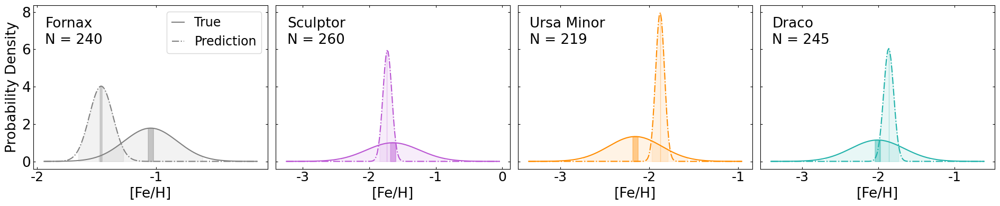

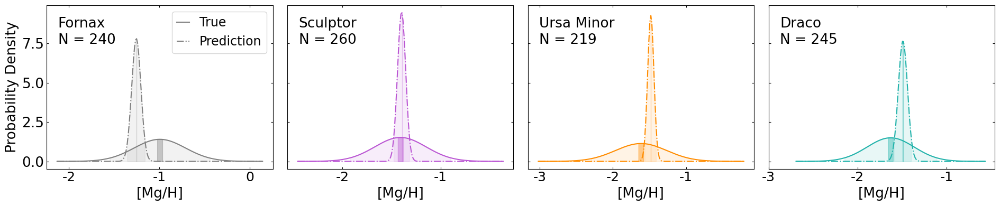

In [274]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, real_data, pred_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
                        color=color, alpha=0.3)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, train_dataset['FEH'], train_dataset['FEH_phot_svr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, train_dataset['MGH'], train_dataset['MGH_phot_svr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh.png', bbox_inches='tight')
plt.show()

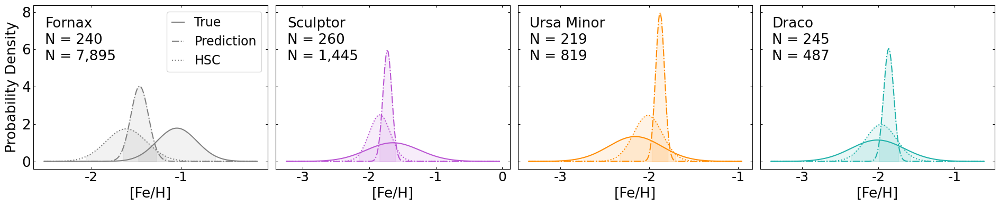

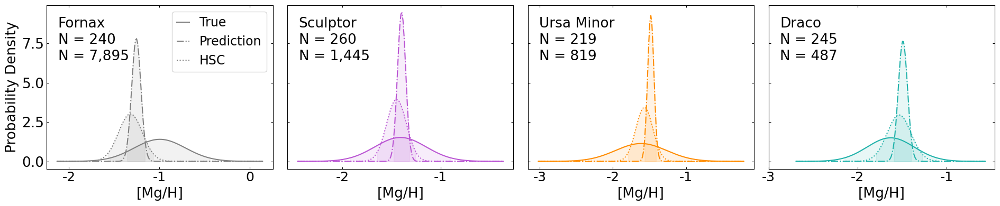

In [275]:
from scipy.stats import norm

def plot_gaussian_comparison_with_ci(ci_data_real, ci_data_pred, ci_data_hsc, real_data, pred_data, hsc_data, measure_name, save_path=None):
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4), sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        
        # mean and std for True and Prediction values
        mu_real, sigma_real = ci_data_real[galaxy]['mean'], ci_data_real[galaxy]['std']
        mu_pred, sigma_pred = ci_data_pred[galaxy]['mean'], ci_data_pred[galaxy]['std']
        mu_hsc,  sigma_hsc  = ci_data_hsc[galaxy]['mean'],  ci_data_hsc[galaxy]['std']
        
        # x range
        x_min = min(mu_real - 4 * sigma_real, mu_pred - 4 * sigma_pred, mu_hsc - 4 * sigma_hsc)
        x_max = max(mu_real + 4 * sigma_real, mu_pred + 4 * sigma_pred, mu_hsc + 4 * sigma_hsc)
        x = np.linspace(x_min, x_max, 200)
        
        # normal distribution
        y_real = norm.pdf(x, mu_real, sigma_real)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)
        y_hsc  = norm.pdf(x, mu_hsc, sigma_hsc)
        
        # shade 95% CI (std) and 95% CI (SE) for True
        ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
                        where=((x >= ci_data_real[galaxy]['95% CI (std)'][0]) & (x <= ci_data_real[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_real, sigma_real),
        #                 where=((x >= ci_data_real[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_real[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # shade 95% CI (std) and 95% CI (SE) for Prediction
        ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
                        where=((x >= ci_data_pred[galaxy]['95% CI (std)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_data_pred[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_pred[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)

        # shade 95% CI (std) and 95% CI (SE) for HSC
        ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
                        where=((x >= ci_data_hsc[galaxy]['95% CI (std)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (std)'][1])),
                        color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_hsc, sigma_hsc),
        #                 where=((x >= ci_data_hsc[galaxy]['95% CI (SE)'][0]) & (x <= ci_data_hsc[galaxy]['95% CI (SE)'][1])),
        #                 color=color, alpha=0.4)
        
        # plot the curves of True Prediction
        ax.plot(x, y_real, linestyle='-', color=color, label='True' if i == 0 else None)
        ax.plot(x, y_pred, linestyle='-.', color=color, label='Prediction' if i == 0 else None)
        ax.plot(x, y_hsc, linestyle=':', color=color, label='HSC' if i == 0 else None)
        ax.tick_params(axis='x', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='x', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)
        ax.tick_params(axis='y', which='major', direction='in', right=True, top=True, length=3, labelsize=19)
        ax.tick_params(axis='y', which='minor', direction='in', right=True, top=True, length=2, labelsize=19)

        # add galaxy's name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {ci_data_real[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.73, f'N = {ci_data_hsc[galaxy]["n"]:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')

        # x label
        ax.set_xlabel(measure_name, size=19)

        # y label
        if i == 0:
            ax.set_ylabel('Probability Density', size=19)
    
    # add legend
    axes[0].legend(handlelength=1, fontsize=17)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes


# FEH
fig_feh, axes_feh = plot_gaussian_comparison_with_ci(
    parametric_ci_feh, parametric_ci_feh_pred, parametric_ci_feh_pred_hsc, train_dataset['FEH'], train_dataset['FEH_phot_svr'], hsc_df_mag['FEH_phot_svr'], '[Fe/H]',
    save_path=None)
axes_feh[0].set_xticks([-2.0, -1.0])
axes_feh[0].set_xticklabels(['-2', '-1'], fontsize=18)
axes_feh[1].set_xticks([-3.0, -2.0, -1.0, 0.0])
axes_feh[1].set_xticklabels(['-3', '-2', '-1', '0'], fontsize=18)
axes_feh[2].set_xticks([-3.0, -2.0, -1.0])
axes_feh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_feh[3].set_xticks([-3.0, -2.0, -1.0])
axes_feh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_feh_hsc.png', bbox_inches='tight')
plt.show()

# MGH 
fig_mgh, axes_mgh = plot_gaussian_comparison_with_ci(
    parametric_ci_mgh, parametric_ci_mgh_pred, parametric_ci_mgh_pred_hsc, train_dataset['MGH'], train_dataset['MGH_phot_svr'], hsc_df_mag['MGH_phot_svr'], '[Mg/H]',
    save_path=None)
axes_mgh[0].set_xticks([-2.0, -1.0, 0.0])
axes_mgh[0].set_xticklabels(['-2', '-1', '0'], fontsize=18)
axes_mgh[1].set_xticks([-2.0, -1.0])
axes_mgh[1].set_xticklabels(['-2', '-1'], fontsize=18)
axes_mgh[2].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[2].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
axes_mgh[3].set_xticks([-3.0, -2.0, -1.0])
axes_mgh[3].set_xticklabels(['-3', '-2', '-1'], fontsize=18)
plt.tight_layout()
plt.savefig('parametric_ci_mgh_hsc.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - B) Bootstrap Method (more robust)

In [276]:
def bootstrap_confidence_intervals(df, abundance_col, group_col='DSPH', n_bootstrap=1000, alpha=0.05):
    """
    Perform bootstrap resampling for each galaxy group 
    on the abundance_col to calculate the 95% confidence interval (α=0.05) ; 5% alpha = significance level of CI = 95% CI
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        boot_means = []
        data = group[abundance_col].values
        n = len(data)
        for i in range(n_bootstrap):
            sample = np.random.choice(data, size=n, replace=True)
            boot_means.append(np.mean(sample))
        lower = np.percentile(boot_means, 100 * alpha/2)
        upper = np.percentile(boot_means, 100 * (1 - alpha/2))
        results[galaxy] = {'bootstrap 95% CI': (lower, upper)}
    return results

# bootstrap CI for prediction FEH, MGH of training dataset
bootstrap_ci_feh = bootstrap_confidence_intervals(train_dataset, 'FEH')
bootstrap_ci_mgh = bootstrap_confidence_intervals(train_dataset, 'MGH')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of training dataset
bootstrap_ci_feh_pred = bootstrap_confidence_intervals(train_dataset, 'FEH_phot_svr')
bootstrap_ci_mgh_pred = bootstrap_confidence_intervals(train_dataset, 'MGH_phot_svr')

# bootstrap CI for prediction FEH_phot_rfr, MGH_phot_rfr of HSC
bootstrap_ci_feh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'FEH_phot_svr')
bootstrap_ci_mgh_pred_hsc = bootstrap_confidence_intervals(hsc_df_mag, 'MGH_phot_svr')

print("Bootstrap Confidence Intervals for FEH (Real):")
for galaxy, metrics in bootstrap_ci_feh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Real):")
for galaxy, metrics in bootstrap_ci_mgh.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted):")
for galaxy, metrics in bootstrap_ci_feh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted):")
for galaxy, metrics in bootstrap_ci_mgh_pred.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for FEH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_feh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

print("\nBootstrap Confidence Intervals for MGH (Predicted HSC):")
for galaxy, metrics in bootstrap_ci_mgh_pred_hsc.items():
    print(f"Galaxy {galaxy}: {metrics}")

Bootstrap Confidence Intervals for FEH (Real):
Galaxy dra: {'bootstrap 95% CI': (-2.0574759802324585, -1.9683028126145967)}
Galaxy for: {'bootstrap 95% CI': (-1.0746931333896894, -1.0190327205340604)}
Galaxy scl: {'bootstrap 95% CI': (-1.6891302042626697, -1.5946278382341121)}
Galaxy umi: {'bootstrap 95% CI': (-2.1955986347246825, -2.1209809535940836)}

Bootstrap Confidence Intervals for MGH (Real):
Galaxy dra: {'bootstrap 95% CI': (-1.659726146471042, -1.5945204892944476)}
Galaxy for: {'bootstrap 95% CI': (-1.0339883510969943, -0.9583063102469772)}
Galaxy scl: {'bootstrap 95% CI': (-1.4416658854555477, -1.378194465447378)}
Galaxy umi: {'bootstrap 95% CI': (-1.6628058460365123, -1.567705765544811)}

Bootstrap Confidence Intervals for FEH (Predicted):
Galaxy dra: {'bootstrap 95% CI': (-1.8742006561315079, -1.8575245455373386)}
Galaxy for: {'bootstrap 95% CI': (-1.4724757814371163, -1.4488910614249004)}
Galaxy scl: {'bootstrap 95% CI': (-1.7339305142763086, -1.7188379211044873)}
Galaxy u

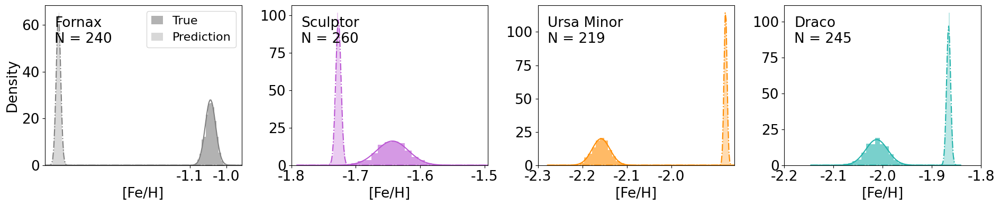

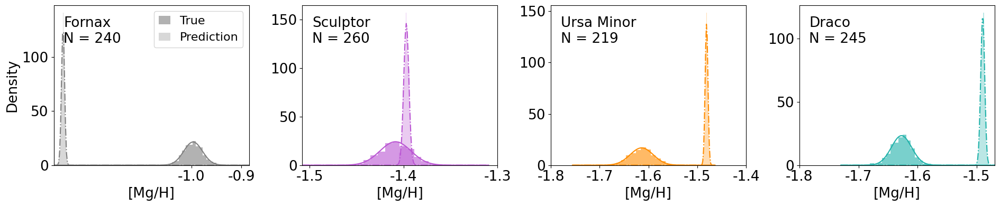

In [277]:
from scipy.stats import norm

def plot_bootstrap_comparison_with_ci(df, abundance_col_true, abundance_col_pred, measure_name, n_bootstrap=1000, save_path=None):
    """
    For each galaxy (DSPH: 'for', 'scl', 'umi', 'dra'), perform bootstrap resampling
    for both True and Prediction values, compute Gaussian fits and bootstrap CIs,
    then plot histograms, fitted curves and CI regions on subplots (1x4).
    """
    galaxies = ['for', 'scl', 'umi', 'dra']
    colors = ['gray', 'mediumorchid', 'darkorange', 'lightseagreen']
    mapping = {'for': 'Fornax', 'scl': 'Sculptor', 'umi': 'Ursa Minor', 'dra': 'Draco'}
    
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(19, 4)) #, sharey=True)
    
    for i, (galaxy, color) in enumerate(zip(galaxies, colors)):
        ax = axes[i]
        # Filter data for this galaxy
        data_true = df[df['DSPH'] == galaxy][abundance_col_true].values
        data_pred = df[df['DSPH'] == galaxy][abundance_col_pred].values
        
        # Skip if no data
        if len(data_true) == 0 or len(data_pred) == 0:
            continue
        
        n_true = len(data_true)
        n_pred = len(data_pred)
        
        # Bootstrap resampling for True and Prediction
        boot_means_true = [np.mean(np.random.choice(data_true, size=n_true, replace=True)) 
                           for _ in range(n_bootstrap)]
        boot_means_pred = [np.mean(np.random.choice(data_pred, size=n_pred, replace=True)) 
                           for _ in range(n_bootstrap)]
        
        # Compute Gaussian fit parameters
        mu_true, sigma_true = np.mean(boot_means_true), np.std(boot_means_true)
        mu_pred, sigma_pred = np.mean(boot_means_pred), np.std(boot_means_pred)
        
        # Compute bootstrap confidence intervals (2.5th, 97.5th percentiles)
        ci_true = (np.percentile(boot_means_true, 2.5), np.percentile(boot_means_true, 97.5))
        ci_pred = (np.percentile(boot_means_pred, 2.5), np.percentile(boot_means_pred, 97.5))
        
        # Set x range based on Gaussian fits
        x_min = min(mu_true - 6*sigma_true, mu_pred - 6*sigma_pred)
        x_max = max(mu_true + 6*sigma_true, mu_pred + 6*sigma_pred)
        x = np.linspace(x_min, x_max, 200)
        
        # Gaussian curves
        y_true = norm.pdf(x, mu_true, sigma_true)
        y_pred = norm.pdf(x, mu_pred, sigma_pred)

        
        # Plot histogram (density normalized) for both distributions
        ax.hist(boot_means_true, bins=15, density=True, alpha=0.6, color=color,
                label='True' if i==0 else None)
        ax.hist(boot_means_pred, bins=15, density=True, alpha=0.3, color=color,
                label='Prediction' if i==0 else None)

        # Plot Gaussian fit curves: True as solid, Prediction as dotted
        ax.plot(x, y_true, linestyle='-', color=color)
        ax.plot(x, y_pred, linestyle='-.', color=color)
        
        # # Shade CI regions for True and Prediction
        # ax.fill_between(x, 0, norm.pdf(x, mu_true, sigma_true),
        #                 where=((x >= ci_true[0]) & (x <= ci_true[1])),
        #                 color=color, alpha=0.1)
        # ax.fill_between(x, 0, norm.pdf(x, mu_pred, sigma_pred),
        #                 where=((x >= ci_pred[0]) & (x <= ci_pred[1])),
        #                 color=color, alpha=0.1)

        # ax.set_xlim([mu_true-0.24, mu_true+0.24])

        # Add galaxy name and number of stars
        ax.text(0.05, 0.93, mapping[galaxy], transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.text(0.05, 0.83, f'N = {n_true:,.0f}', transform=ax.transAxes, fontsize=19, ha='left', va='top')
        ax.set_xlim([x_min, x_max])
        
        # Set labels
        ax.set_xlabel(measure_name, size=19)
        if i == 0:
            ax.set_ylabel('Density', size=19)
        
        ax.tick_params(axis='x', labelsize=19)
        ax.tick_params(axis='y', labelsize=19)

    # add legend
    axes[0].legend(loc='upper right', fontsize=16, handlelength=1)

    plt.tight_layout()
    if save_path is not None:
        plt.savefig(save_path, bbox_inches='tight')
    
    return fig, axes
    
# FEH
fig_feh, axes_feh = plot_bootstrap_comparison_with_ci(train_dataset, 'FEH', 'FEH_phot_svr', '[Fe/H]', n_bootstrap=1000, save_path=None)
# axes_feh[0].set_xlim([-1.14, -0.96])
axes_feh[0].set_xticks([-1.1, -1.0])
axes_feh[0].set_xticklabels(['-1.1', '-1.0'], fontsize=19)
# axes_feh[1].set_xlim([-1.8, -1.35])
axes_feh[1].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_feh[1].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
# axes_feh[2].set_xlim([-2.3, -1.95])
axes_feh[2].set_xticks([-2.3, -2.2, -2.1, -2.0])
axes_feh[2].set_xticklabels(['-2.3', '-2.2', '-2.1', '-2.0'], fontsize=19)
# axes_feh[3].set_xlim([-2.18, -1.7])
axes_feh[3].set_xticks([-2.2, -2.1, -2.0, -1.9, -1.8])
axes_feh[3].set_xticklabels(['-2.2', '-2.1', '-2.0', '-1.9', '-1.8'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_feh.png', bbox_inches='tight')
plt.show()

# MGH
fig_mgh, axes_mgh = plot_bootstrap_comparison_with_ci(train_dataset, 'MGH', 'MGH_phot_svr', '[Mg/H]', n_bootstrap=1000, save_path=None)
# axes_mgh[0].set_xlim([-1.14, -0.88])
axes_mgh[0].set_xticks([-1.0, -0.9])
axes_mgh[0].set_xticklabels(['-1.0', '-0.9'], fontsize=19)
# axes_mgh[1].set_xlim([-1.52, -1.28])
axes_mgh[1].set_xticks([-1.5, -1.4, -1.3])
axes_mgh[1].set_xticklabels(['-1.5', '-1.4', '-1.3'], fontsize=19)
# axes_mgh[2].set_xlim([-1.78, -1.42])
axes_mgh[2].set_xticks([-1.8, -1.7, -1.6, -1.5, -1.4])
axes_mgh[2].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5', '-1.4'], fontsize=19)
# axes_mgh[3].set_xlim([-1.72, -1.5])
axes_mgh[3].set_xticks([-1.8, -1.7, -1.6, -1.5])
axes_mgh[3].set_xticklabels(['-1.8', '-1.7', '-1.6', '-1.5'], fontsize=19)
plt.tight_layout()
plt.savefig('bootstrap_ci_mgh.png', bbox_inches='tight')
plt.show()

# Calculate confidnce level - C) Prediction Performance Metrics

In [278]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

def performance_metrics(df, actual_col, pred_col, group_col='DSPH'):
    """
    For each galaxy group, calculate MAE, RMSE, the mean actual values, and the error percentage (%) 
    for both actual_col and pred_col.
    """
    results = {}
    for galaxy, group in df.groupby(group_col):
        actual = group[actual_col]
        predicted = group[pred_col]
        mae = np.mean(np.abs(actual - predicted))
        rmse = np.sqrt(np.mean((actual - predicted)**2))
        mean_actual = actual.mean()
        # relative error
        error_percent = abs(mae / mean_actual) * 100 if mean_actual != 0 else np.nan
        
        results[galaxy] = {
            'MAE': mae,
            'RMSE': rmse,
            'Mean Actual': mean_actual,
            'Error %': error_percent
        }
    return results

perf_feh = performance_metrics(test_dataset, 'FEH', 'FEH_phot_svr')
perf_mgh = performance_metrics(test_dataset, 'MGH', 'MGH_phot_svr')

print("Prediction Performance Metrics for FEH:")
for galaxy, metrics in perf_feh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

print("\nPrediction Performance Metrics for MGH:")
for galaxy, metrics in perf_mgh.items():
    print(f"Galaxy {galaxy}: MAE = {metrics['MAE']:.3f}, RMSE = {metrics['RMSE']:.3f}, Relative Error % = {metrics['Error %']:.2f}%")

# Final print
feh_errors = [abs(metrics["Error %"]) for metrics in perf_feh.values()]
mgh_errors = [abs(metrics["Error %"]) for metrics in perf_mgh.values()]
print("\nOur FEH predictions are accurate to within", 
      f"{min(feh_errors):.0f}-{max(feh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

print("Our MGH predictions are accurate to within", 
      f"{min(mgh_errors):.0f}-{max(mgh_errors):.0f}%", 
      "(95% confidence) across different galaxies.")

Prediction Performance Metrics for FEH:
Galaxy dra: MAE = 0.255, RMSE = 0.363, Relative Error % = 12.78%
Galaxy for: MAE = 0.403, RMSE = 0.462, Relative Error % = 36.77%
Galaxy scl: MAE = 0.370, RMSE = 0.440, Relative Error % = 21.81%
Galaxy umi: MAE = 0.345, RMSE = 0.454, Relative Error % = 16.15%

Prediction Performance Metrics for MGH:
Galaxy dra: MAE = 0.231, RMSE = 0.300, Relative Error % = 14.28%
Galaxy for: MAE = 0.360, RMSE = 0.436, Relative Error % = 37.98%
Galaxy scl: MAE = 0.261, RMSE = 0.341, Relative Error % = 18.26%
Galaxy umi: MAE = 0.285, RMSE = 0.342, Relative Error % = 18.08%

Our FEH predictions are accurate to within 13-37% (95% confidence) across different galaxies.
Our MGH predictions are accurate to within 14-38% (95% confidence) across different galaxies.
